In [1]:
from astropy.io import fits
from astropy import units, constants
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import corner
from voigt_fit_lib import *
import os
import pickle

Load in the files

In [2]:
rootdir = '/Users/thepoetoftwilight/Documents/Astro/Data/PG1522+101/'

First, the FUV files

In [3]:
spec_fits_fuv = fits.open(rootdir + 'FUV/PG1522+101_FUV_wavecal_new.fits')
lsf_fits_fuv = fits.open(rootdir + 'FUV/PG1522_COS_FUV_wavcal2022_lsf_ZQ.fits')

Then, the NUV files

In [4]:
spec_fits_nuv = fits.open(rootdir + 'G185M/PG1522+101_NUV_wavecal_new.fits')
lsf_fits_nuv = fits.open(rootdir + 'G185M/PG1522_COS_NUV_wavcal2022_lsf.fits')

Then, the STIS files

In [5]:
spec_fits_stis = fits.open(rootdir + 'STIS/PG1522+101_E230M_new.fits')
lsf_fits_stis = fits.open(rootdir + 'STIS/PG1522_STIS_NUV_wavcal2022_lsf.fits')

Finally, HIRES files

In [6]:
spec_fits_hires = fits.open(rootdir + 'HIRES/PG1522+101_HIRES.fits')
lsf_fits_hires = fits.open(rootdir + 'HIRES/PG1522_HIRES_wavcal2023_lsf.fits')

Compile a list of the spectra, continuum nodes, and IDs for all detectors

In [7]:
spec_fits_list = [spec_fits_fuv, spec_fits_nuv, spec_fits_stis, spec_fits_hires]
lsf_fits_list = [lsf_fits_fuv, lsf_fits_nuv, lsf_fits_stis, lsf_fits_hires]

Systemic redshift

In [8]:
z_sys = 1.04430762 #1.04430803 #1.04430667 #1.04430681 #1.04430695 #1.04430722 #1.04430763

In [9]:
#np.round(1.04430803-((1+1.04430803)*0.06/3e+5), 8)

# HI

## HI 1215 (STIS)

In [10]:
hi_1215_stis = ion_transition('HI', 1215, 'H', z_sys, 'STIS')

In [11]:
hi_1215_stis.grab_ion_transition_info()

In [12]:
hi_1215_stis.grab_ion_transition_spec(spec_fits_list, masks=[[120,160]])

In [13]:
hi_1215_stis.cont_norm_flux(v_abs_range=[-70,170], degree=1)

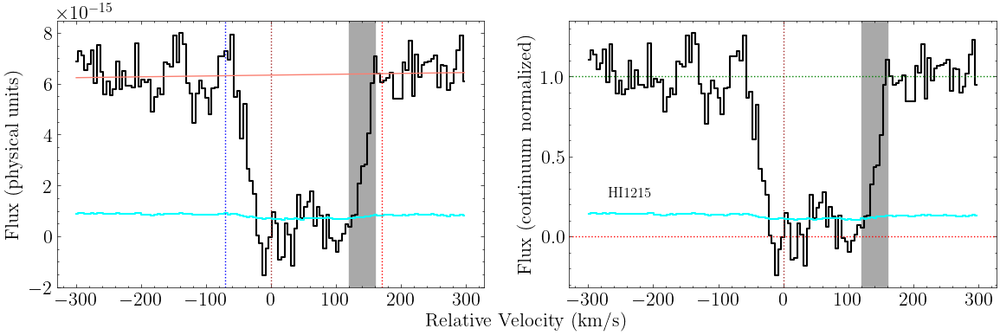

In [14]:
fig, axes = hi_1215_stis.plot_ion_transition_spec_cont()

In [15]:
hi_1215_stis.get_EW_total(-70,170)

Integration window: [-70, 170]
EW, 1sig: 696, 16
EW-3sig: 47.861


In [16]:
hi_1215_stis.grab_ion_transition_lsf(lsf_fits_list)

In [17]:
hi_1215_stis.init_ion_transition(init_values = np.array([[13.91, 10, 0],[13.5, 10, 40],[13.4,10,80], [13.7, 10,100]]), 
                             lsf_convolve = True)

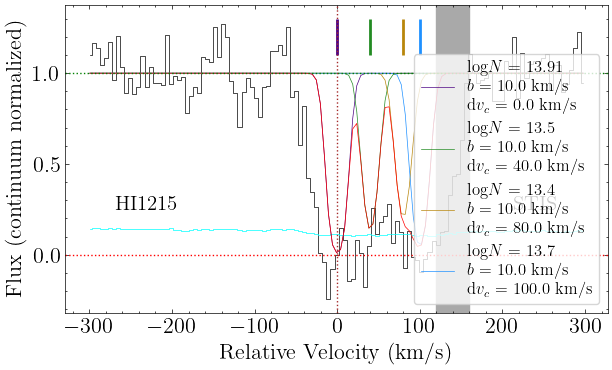

In [18]:
fig, ax = hi_1215_stis.plot_ion_transition_init_fit()

In [19]:
hi_1215_stis.fit_ion_transition(fix_params_list=['it1c1_dv_c', 'it1c2_dv_c', 'it1c3_dv_c', 'it1c4_dv_c'])

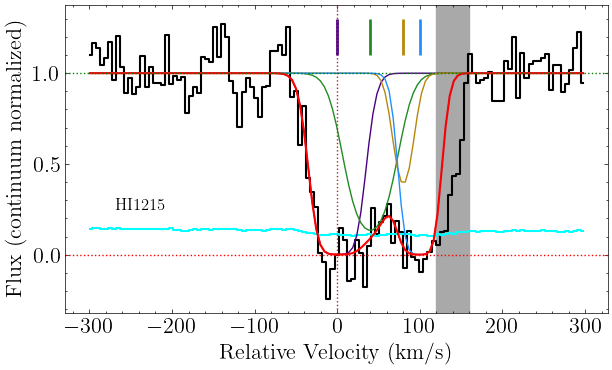

In [20]:
fig, ax = hi_1215_stis.plot_ion_transition_best_fit(legend=False)

## HI 1025 (NUV)

In [21]:
hi_1025_nuv = ion_transition('HI', 1025, 'H', z_sys, 'COS NUV')

In [22]:
hi_1025_nuv.grab_ion_transition_info()

In [23]:
hi_1025_nuv.grab_ion_transition_spec(spec_fits_list, masks=[[-90,-40],[110,260]])

In [24]:
hi_1025_nuv.cont_norm_flux(v_abs_range=[-90,260], degree=1)

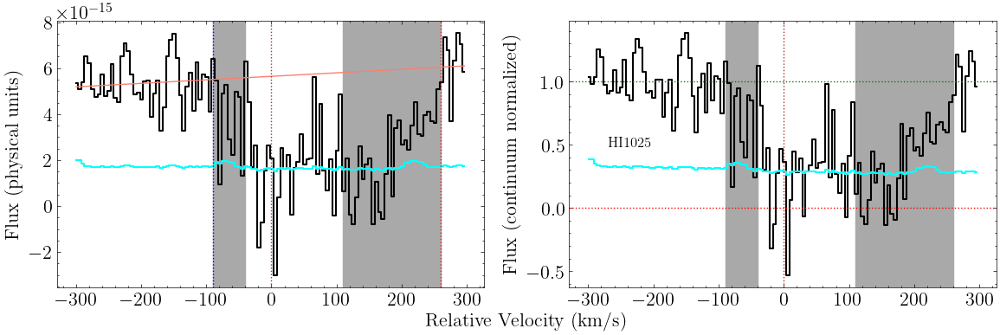

In [25]:
fig, axes = hi_1025_nuv.plot_ion_transition_spec_cont()

In [26]:
hi_1025_nuv.grab_ion_transition_lsf(lsf_fits_list)

In [27]:
hi_1025_nuv.get_EW_total(-60,140)

Integration window: [-60, 140]
EW, 1sig: 449, 31
EW-3sig: 92.181


In [28]:
hi_1025_nuv.init_ion_transition(init_values = np.array([[13.91, 10, 0],
                                                        [13.5, 10, 40],
                                                        [13.4,10,80], 
                                                        [13.7, 10,100]]), 
                             lsf_convolve = True)

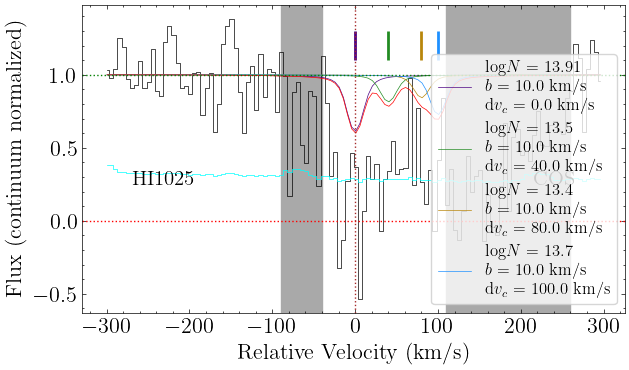

In [29]:
fig, ax = hi_1025_nuv.plot_ion_transition_init_fit()

In [30]:
hi_1025_nuv.fit_ion_transition(fix_params_list=['it1c1_dv_c', 'it1c2_dv_c', 'it1c3_dv_c', 'it1c4_dv_c'])

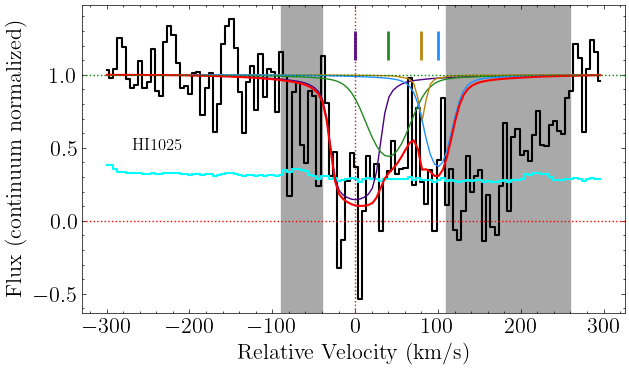

In [31]:
fig, ax = hi_1025_nuv.plot_ion_transition_best_fit(legend=False)

## HI 972 (NUV)

In [32]:
hi_972_nuv = ion_transition('HI', 972, 'H', z_sys, 'COS NUV')

In [33]:
hi_972_nuv.grab_ion_transition_info()

In [34]:
hi_972_nuv.grab_ion_transition_spec(spec_fits_list)

In [35]:
hi_972_nuv.cont_norm_flux(v_abs_range=[-80,220], degree=1)

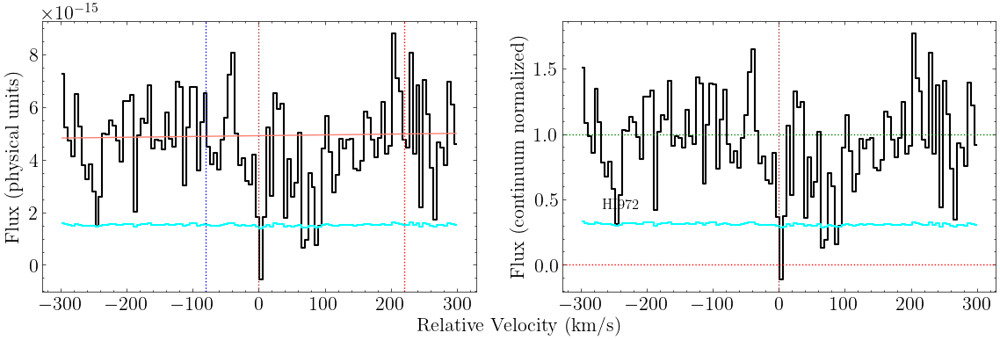

In [36]:
fig, axes = hi_972_nuv.plot_ion_transition_spec_cont()

In [37]:
hi_972_nuv.get_EW_total(-60,140)

Integration window: [-60, 140]
EW, 1sig: 151, 32
EW-3sig: 94.829


In [38]:
hi_972_nuv.grab_ion_transition_lsf(lsf_fits_list)

In [39]:
hi_972_nuv.init_ion_transition(init_values = np.array([[14.9, 18, 0],[13.9, 11, 40.1],[14.3,13,79.3], [14.6,20,100.5]]), 
                             lsf_convolve = True)

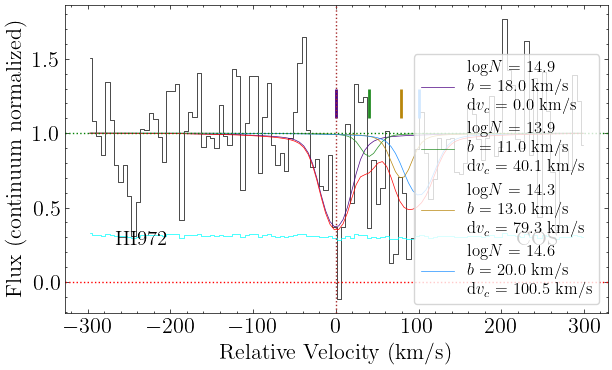

In [40]:
fig, ax = hi_972_nuv.plot_ion_transition_init_fit()

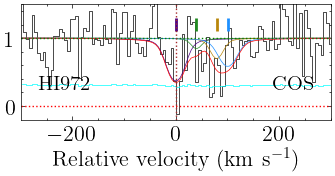

In [41]:
fig, ax = plt.subplots(1, 1, figsize=(4,1.5), sharex=True, sharey=True)

hi_972_nuv.plot_ion_transition_init_fit(fig=fig, ax=ax, legend=False, label_axes=False)

ax.set_xlim(-300,300)
ax.set_ylim(-0.2,1.5)
ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])
ax_label.set_xlabel(r'Relative velocity (km s${}^{-1}$)', labelpad=20) # Use argument `labelpad` to move label downwards.
#ax_label.set_ylabel('Normalized flux', labelpad=15)

plt.savefig(rootdir+'Figures/z_104_HI.png', dpi=300)

In [42]:
hi_972_nuv.fit_ion_transition()

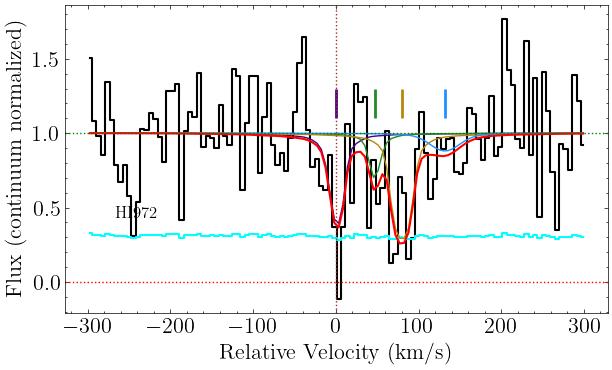

In [43]:
fig, ax = hi_972_nuv.plot_ion_transition_best_fit(legend=False)

## HI 949 (NUV)

In [44]:
hi_949_nuv = ion_transition('HI', 949, 'H', z_sys, 'COS NUV')

In [45]:
hi_949_nuv.grab_ion_transition_info()

In [46]:
hi_949_nuv.grab_ion_transition_spec(spec_fits_list)

In [47]:
hi_949_nuv.cont_norm_flux(v_abs_range=[-80,220], degree=1)

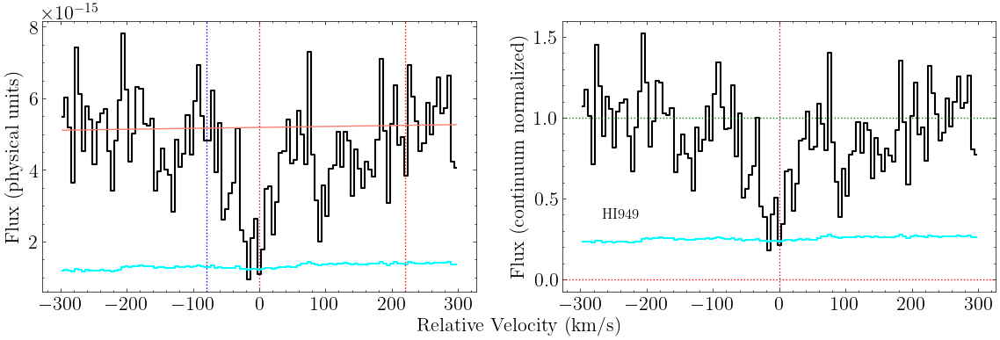

In [48]:
fig, axes = hi_949_nuv.plot_ion_transition_spec_cont()

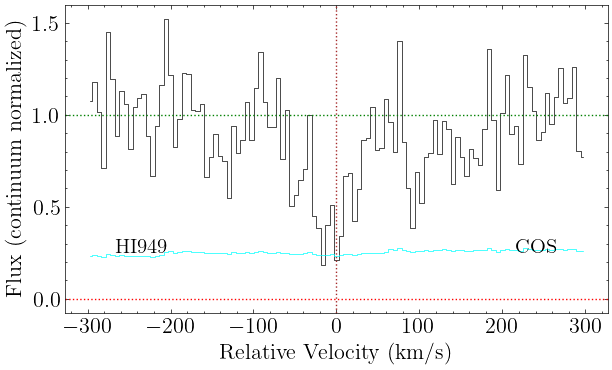

In [49]:
fig, axes = hi_949_nuv.plot_ion_transition_spec()

In [50]:
hi_949_nuv.grab_ion_transition_lsf(lsf_fits_list)

In [51]:
hi_949_nuv.init_ion_transition(init_values = hi_972_nuv.best_values, 
                             lsf_convolve = True)

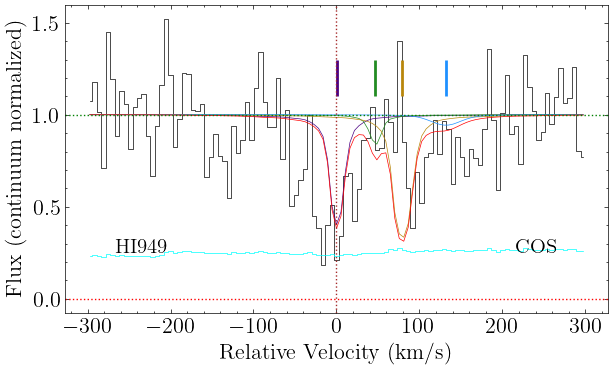

In [52]:
fig, ax = hi_949_nuv.plot_ion_transition_init_fit(legend=False)

In [53]:
hi_949_nuv.fit_ion_transition()

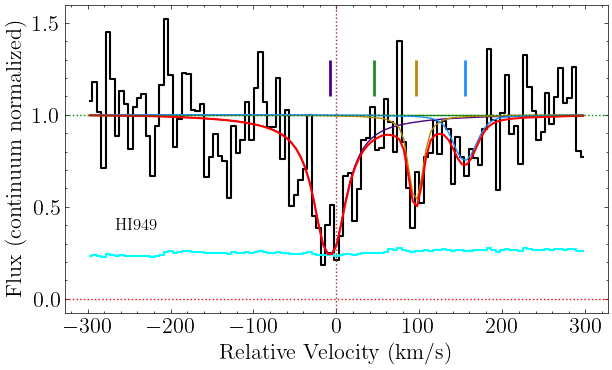

In [54]:
fig, ax = hi_949_nuv.plot_ion_transition_best_fit(legend=False)

## HI 930 (NUV)

In [55]:
hi_930_nuv = ion_transition('HI', 930, 'H', z_sys, 'COS NUV')

In [56]:
hi_930_nuv.grab_ion_transition_info()

In [57]:
hi_930_nuv.grab_ion_transition_spec(spec_fits_list)

In [58]:
hi_930_nuv.cont_norm_flux(v_abs_range=[-80,220], degree=1)

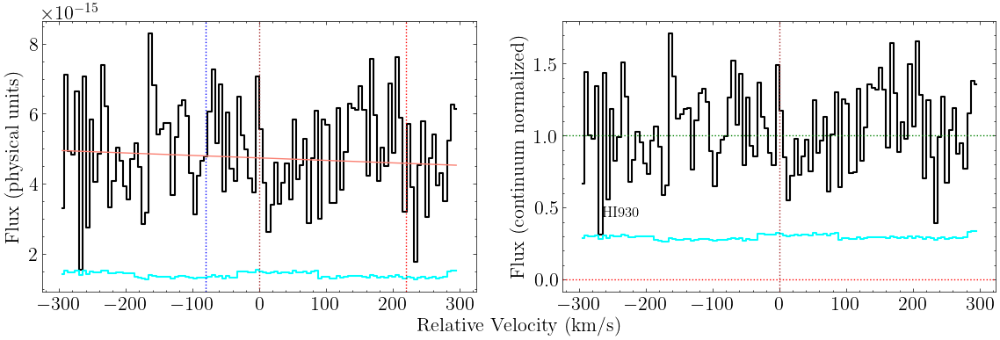

In [59]:
fig, axes = hi_930_nuv.plot_ion_transition_spec_cont()

In [60]:
hi_930_nuv.grab_ion_transition_lsf(lsf_fits_list)

In [61]:
hi_930_nuv.init_ion_transition(init_values = hi_972_nuv.best_values, 
                             lsf_convolve = True)

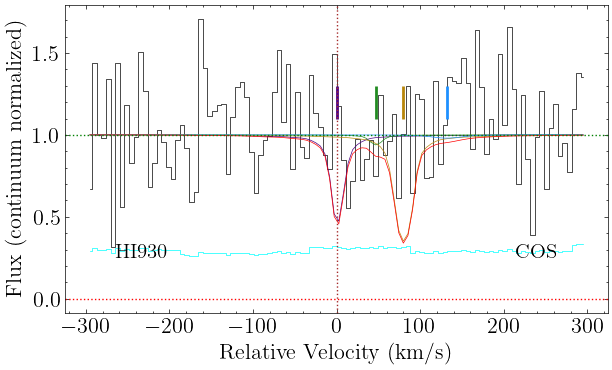

In [62]:
fig, ax = hi_930_nuv.plot_ion_transition_init_fit(legend=False)

In [63]:
hi_930_nuv.fit_ion_transition()

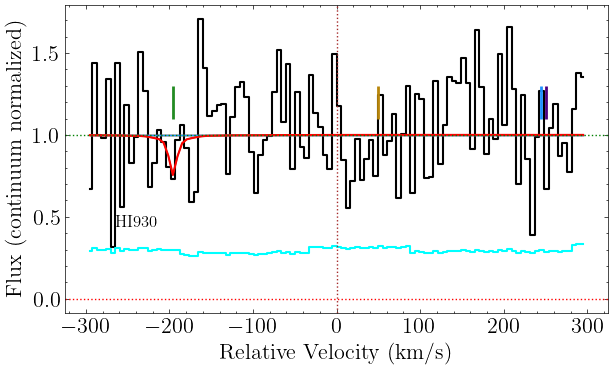

In [64]:
fig, ax = hi_930_nuv.plot_ion_transition_best_fit(legend=False)

## HI ion

In [65]:
hi = ion(z_sys, 'HI', [hi_1215_stis, hi_1025_nuv, hi_972_nuv])

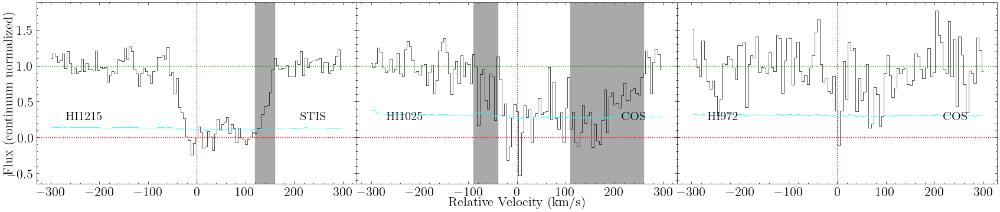

In [66]:
fig, axes = hi.plot_ion(n_cols=3)

In [67]:
hi.init_ion([[[14.7, 18, 0], [13.7, 13, 40], [13.9, 20, 80], [14.2, 23, 100]],
             [[14.7, 18, 0], [13.7, 13, 40], [13.9, 20, 80], [14.2, 23, 100]],
             [[14.7, 18, 0], [13.7, 13, 40], [13.9, 20, 80], [14.2, 23, 100]]])

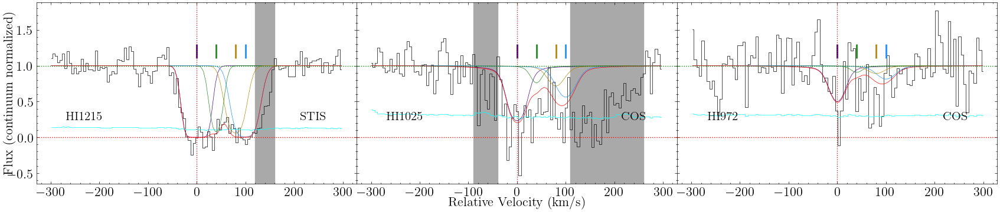

In [68]:
fig, axes = hi.plot_ion_init_fit(n_cols=3, legend=False)

In [69]:
hi.fit_ion(tie_params_list = [['it1c1_logN', 'it2c1_logN'], # Component 1
                              ['it1c1_logN', 'it3c1_logN'],
                              ['it1c1_b', 'it2c1_b'],
                              ['it1c1_b', 'it3c1_b'],
                              ['it1c1_dv_c', 'it2c1_dv_c'],
                              ['it1c1_dv_c', 'it3c1_dv_c'],
                              ['it1c2_logN', 'it2c2_logN'], # Component 2
                              ['it1c2_logN', 'it3c2_logN'],
                              ['it1c2_b', 'it2c2_b'],
                              ['it1c2_b', 'it3c2_b'],
                              ['it1c2_dv_c', 'it2c2_dv_c'],
                              ['it1c2_dv_c', 'it3c2_dv_c'],
                              ['it1c3_logN', 'it2c3_logN'], # Component 3
                              ['it1c3_logN', 'it3c3_logN'],
                              ['it1c3_b', 'it2c3_b'],
                              ['it1c3_b', 'it3c3_b'],
                              ['it1c3_dv_c', 'it2c3_dv_c'],
                              ['it1c3_dv_c', 'it3c3_dv_c'],
                              ['it1c4_logN', 'it2c4_logN'], # Component 4
                              ['it1c4_logN', 'it3c4_logN'],
                              ['it1c4_b', 'it2c4_b'],
                              ['it1c4_b', 'it3c4_b'],
                              ['it1c4_dv_c', 'it2c4_dv_c'],
                              ['it1c4_dv_c', 'it3c4_dv_c'],             
                             ],
          fix_params_list = ['it1c1_dv_c', 'it1c2_dv_c', 'it1c3_dv_c', 'it1c4_dv_c'],
          exclude_models = [
                            'it1c3_logN < it1c2_logN', # c3 doesn't disappear
                            'it1c4_logN < it1c3_logN', # c3 doesn't overwhelm c4
                            'it1c3_b < it1c2_b', # c3 broader than c3 for CIV
                            'it1c3_b > it1c4_b'
                           ],
          lower_bounds_dict = {
                              'it1c1_b': 12, 
                              }
          )

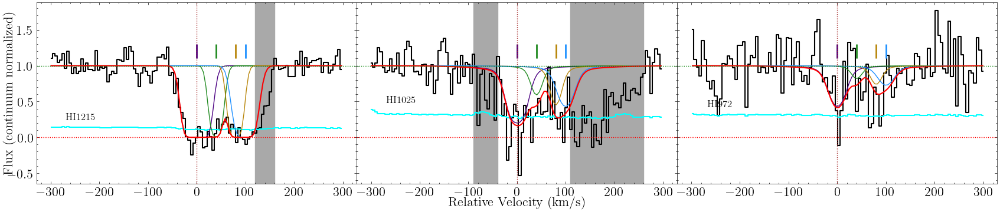

In [70]:
fig, axes = hi.plot_ion_best_fit(legend=False, n_cols=3)

In [71]:
#hi.result

In [72]:
#hi.fit_ion_emcee(loaddir=rootdir, scale_covar=1e-18, n_walkers=100, n_steps=2500)
#hi.fit_ion_emcee(load=True, loaddir=rootdir)

In [73]:
#fig, axes = hi.plot_samples(n_cols=3)

In [74]:
#hi.plot_corner()

# HeI

## HeI 584

In [75]:
hei_584_fuv = ion_transition('HeI', 584, 'He', z_sys, 'COS FUV')

In [76]:
hei_584_fuv.grab_ion_transition_info()

In [77]:
hei_584_fuv.grab_ion_transition_spec(spec_fits_list, masks=[[-300,-270]])

In [78]:
hei_584_fuv.cont_norm_flux(v_abs_range=[-120,120], degree=1)

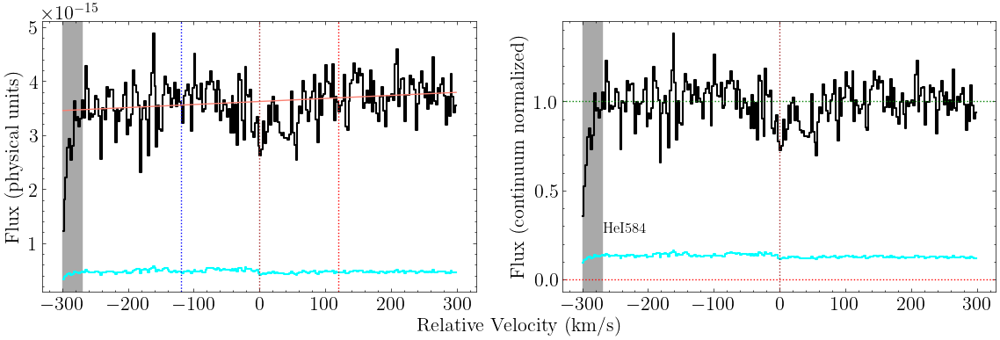

In [79]:
fig, ax = hei_584_fuv.plot_ion_transition_spec_cont()

In [80]:
hei_584_fuv.grab_ion_transition_lsf(lsf_fits_list)

(-40.0, 40.0)

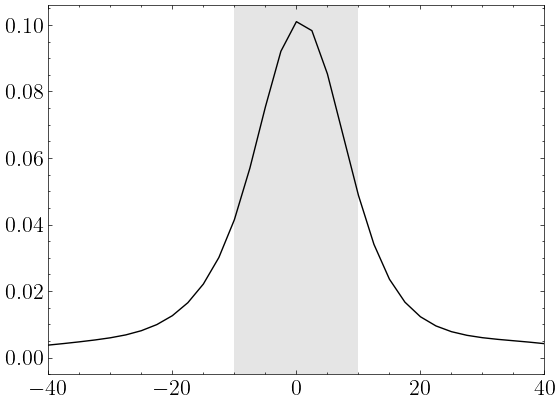

In [81]:
plt.plot(hei_584_fuv.v_lsf, hei_584_fuv.lsf)
plt.axvspan(-10,10, alpha=.1)
plt.xlim(-40,40)

In [82]:
#fig, ax = hei_584_fuv.plot_ion_transition_spec()
#plt.savefig(rootdir+'Ions/z=1.04430803/HeI_spec.png', dpi=300)

In [83]:
hei_584_fuv.init_ion_transition(init_values = np.array([[13.5,19,0],[12.5,10,40],[13.3,14,79.5],[13.5,21,100.5]]), 
                             lsf_convolve = True)

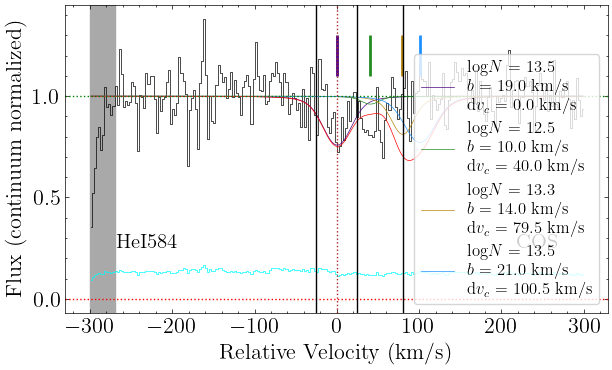

In [84]:
fig, ax = hei_584_fuv.plot_ion_transition_init_fit()
ax.axvline(-25)
ax.axvline(25)
ax.axvline(80)

In [85]:
hei_584_fuv.get_upper_lim(10)

logN-1sig: 12.7
logN-2sig: 12.9
logN-3sig: 13.1


In [86]:
hei_584_fuv.get_upper_lim_data(10, 0, v_min=-25, v_max=25, logN_max=15)

logN-1sig: 13.3
logN-2sig: 13.4
logN-3sig: 13.5


In [87]:
hei_584_fuv.get_upper_lim_data(10, 50, v_min=25, v_max=80, logN_max=15)

logN-1sig: 13.3
logN-2sig: 13.4
logN-3sig: 13.5


In [88]:
hei_584_fuv.get_upper_lim_data(10, 80, v_min=60, v_max=130, logN_max=15)

logN-1sig: 12.8
logN-2sig: 13.0
logN-3sig: 13.1


In [89]:
hei_584_fuv.fit_ion_transition(fix_params_list=['it1c1_dv_c', 'it1c1_b', 'it1c2_dv_c', 'it1c2_b', 'it1c3_dv_c', 'it1c3_b', 'it1c4_dv_c', 'it1c4_b'])

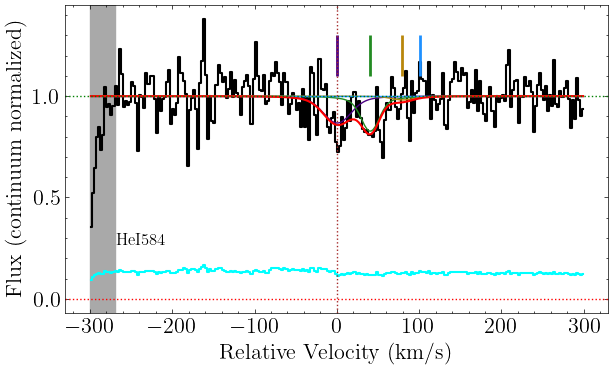

In [90]:
fig, ax = hei_584_fuv.plot_ion_transition_best_fit(legend=False)

## HeI ion

In [91]:
hei = ion(hei_584_fuv, 'HeI', [hei_584_fuv])

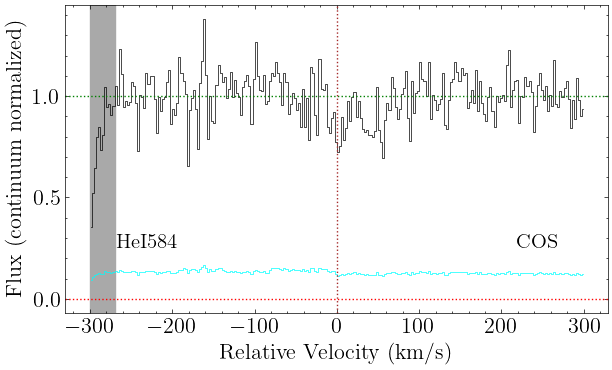

In [92]:
fig, axes = hei.plot_ion()

In [93]:
hei.init_ion([[[13.2,10,0],[13.2,8,40]]])

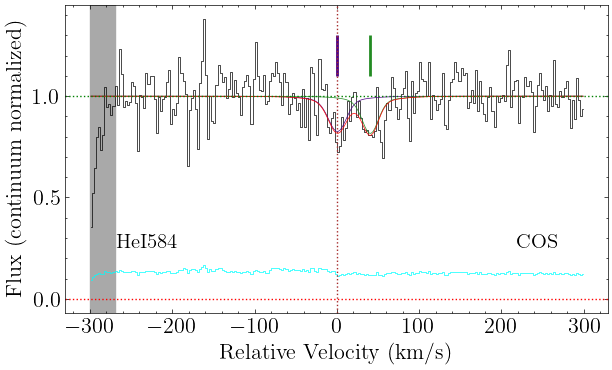

In [94]:
fig, axes = hei.plot_ion_init_fit(legend=False)

In [95]:
hei.fit_ion(fix_params_list = ['it1c1_dv_c', 'it1c2_dv_c'], lower_bounds_dict = {'it1c1_b':6.4, 
                                                                                 'it1c2_b':6.4},
            upper_bounds_dict = {'it1c1_b':19, 'it1c2_b':10})

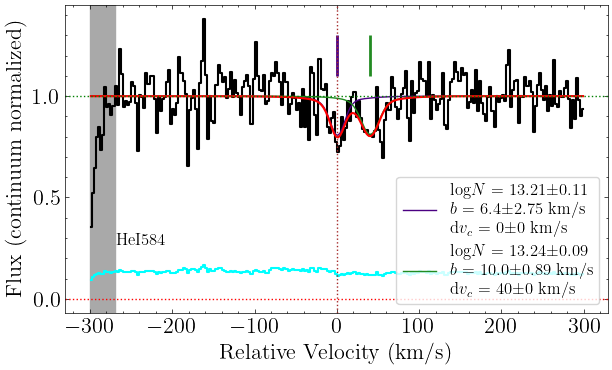

In [96]:
fig, axes = hei.plot_ion_best_fit()

In [97]:
#hei.fit_ion_emcee(loaddir=rootdir, scale_covar=1e-19, n_walkers=100, n_steps=2500)
#hei.fit_ion_emcee(load=True, loaddir=rootdir)

In [98]:
#fig, axes = hei.plot_samples()

In [99]:
#hei.plot_corner()

In [100]:
#np.median(hei.result_emcee.flatchain['it1c2_logN'])

In [101]:
#np.percentile(hei.result_emcee.flatchain['it1c1_logN'], 100*cdf_3sig)

# CIV

## CIV 1548 (HIRES)

In [313]:
civ_1548_hires = ion_transition('CIV', 1548, 'C', z_sys, 'HIRES')

In [314]:
civ_1548_hires.grab_ion_transition_info()

In [315]:
civ_1548_hires.grab_ion_transition_spec(spec_fits_list, masks=[[-40,-15],[50,70],[115,140]])

In [316]:
civ_1548_hires.cont_norm_flux(v_abs_range=[-40,150], degree=1)

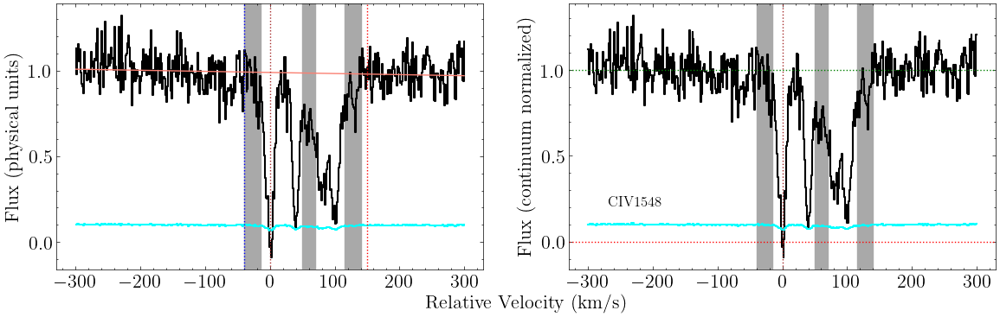

In [317]:
fig, ax = civ_1548_hires.plot_ion_transition_spec_cont()

(-0.1, 1.2)

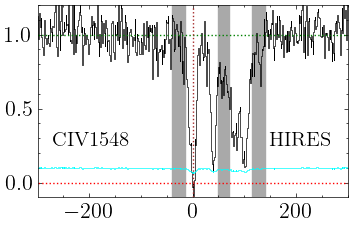

In [318]:
fig, ax = plt.subplots(1, figsize=(4,2.5))

civ_1548_hires.plot_ion_transition_spec(fig=fig, ax = ax, label_axes=False)

ax.set_xlim(-300,300)
ax.set_ylim(-0.1,1.2)

In [319]:
civ_1548_hires.get_EW_total(-40,150)

Integration window: [-40, 150]
EW, 1sig: 342, 7
EW-3sig: 21.828


In [320]:
civ_1548_hires.grab_ion_transition_lsf(lsf_fits_list)

In [321]:
civ_1548_hires.init_ion_transition(init_values = np.array([[13.64, 6.4, 0],[13.41, 6.1, 40.1], 
                                                           [13.40, 10, 79.3], [13.52, 8.2, 100.5]]), 
                             lsf_convolve = True)

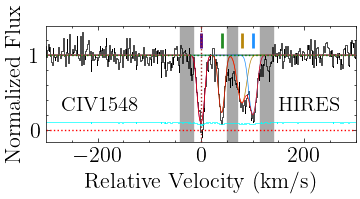

In [111]:
fig, ax = plt.subplots(1, figsize=(4,1.5))

civ_1548_hires.plot_ion_transition_init_fit(fig=fig, ax=ax, legend=False, label_axes=False)

ax.set_xlim(-300,300)

ax.set_xlabel('Relative Velocity (km/s)')
ax.set_ylabel('Normalized Flux')

plt.savefig(rootdir+'Figures/z_104_CIV.png', dpi=300)

In [112]:
civ_1548_hires.fit_ion_transition()

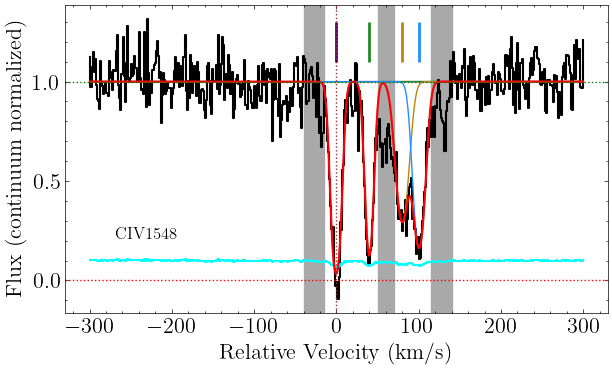

In [113]:
fig, ax = civ_1548_hires.plot_ion_transition_best_fit(legend=False)

## CIV 1550 (HIRES)

In [114]:
civ_1550_hires = ion_transition('CIV', 1550, 'C', z_sys, 'HIRES')

In [115]:
civ_1550_hires.grab_ion_transition_info()

In [116]:
civ_1550_hires.grab_ion_transition_spec(spec_fits_list, masks=[[-20,-10],[50,70],[110,140]])

In [117]:
civ_1550_hires.cont_norm_flux(v_abs_range=[-20,140], degree=1)

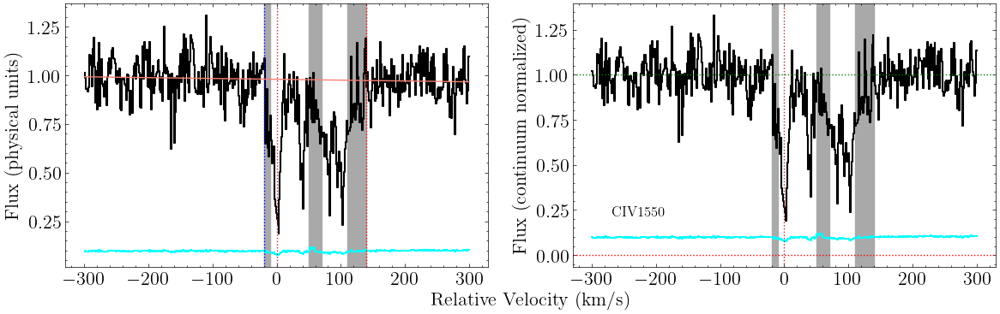

In [118]:
fig, ax = civ_1550_hires.plot_ion_transition_spec_cont()

In [119]:
civ_1550_hires.get_EW_total(-20,140)

Integration window: [-20, 140]
EW, 1sig: 216, 7
EW-3sig: 21.174


In [120]:
civ_1550_hires.grab_ion_transition_lsf(lsf_fits_list)

In [121]:
civ_1550_hires.init_ion_transition(init_values = civ_1548_hires.init_values, 
                             lsf_convolve = True)

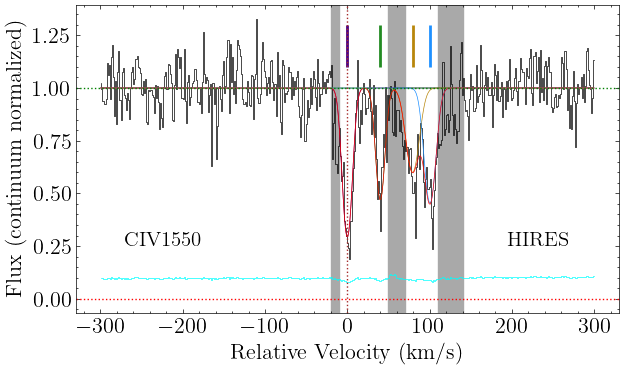

In [122]:
fig, ax = civ_1550_hires.plot_ion_transition_init_fit(legend=False)

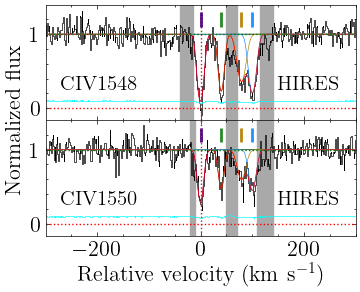

In [123]:
fig, axes = plt.subplots(2, 1, figsize=(4,1.5*2), sharex=True, sharey=True)

civ_1548_hires.plot_ion_transition_init_fit(fig=fig, ax=axes[0], legend=False, label_axes=False)
civ_1550_hires.plot_ion_transition_init_fit(fig=fig, ax=axes[1], legend=False, label_axes=False)

axes[0].set_xlim(-300,300)

plt.subplots_adjust(wspace=0., hspace=0)

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])
ax_label.set_xlabel(r'Relative velocity (km s${}^{-1}$)', labelpad=20) # Use argument `labelpad` to move label downwards.
ax_label.set_ylabel('Normalized flux', labelpad=15)

plt.savefig(rootdir+'Figures/z_104_CIV_doublet.png', dpi=300)

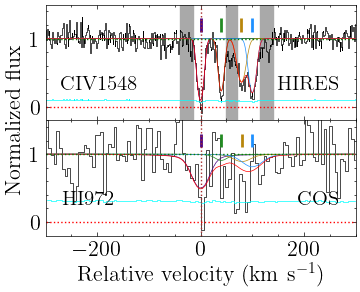

In [124]:
fig, axes = plt.subplots(2, 1, figsize=(4,1.5*2), sharex=True, sharey=True)

civ_1548_hires.plot_ion_transition_init_fit(fig=fig, ax=axes[0], legend=False, label_axes=False)

hi_972_nuv.plot_ion_transition_init_fit(fig=fig, ax=axes[1], legend=False, label_axes=False)

axes[0].set_xlim(-300,300)
axes[0].set_ylim(-0.2,1.5)

plt.subplots_adjust(wspace=0., hspace=0)

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])
ax_label.set_xlabel(r'Relative velocity (km s${}^{-1}$)', labelpad=20) # Use argument `labelpad` to move label downwards.
ax_label.set_ylabel('Normalized flux', labelpad=15)

plt.savefig(rootdir+'Figures/z_104_HI_CIV.png', dpi=300)

In [125]:
civ_1550_hires.fit_ion_transition()

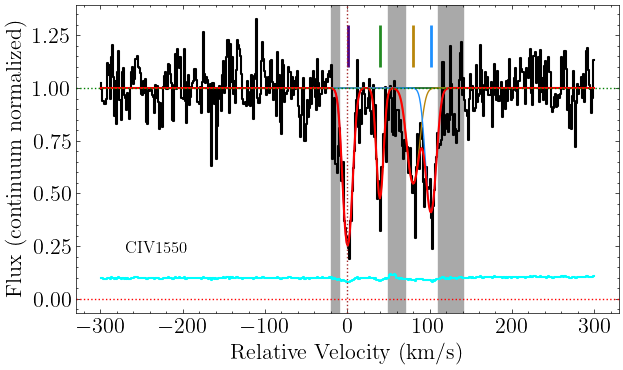

In [126]:
fig, ax = civ_1550_hires.plot_ion_transition_best_fit(legend=False)

## CIV ion

In [127]:
civ = ion(z_sys, 'CIV', [civ_1548_hires, civ_1550_hires])

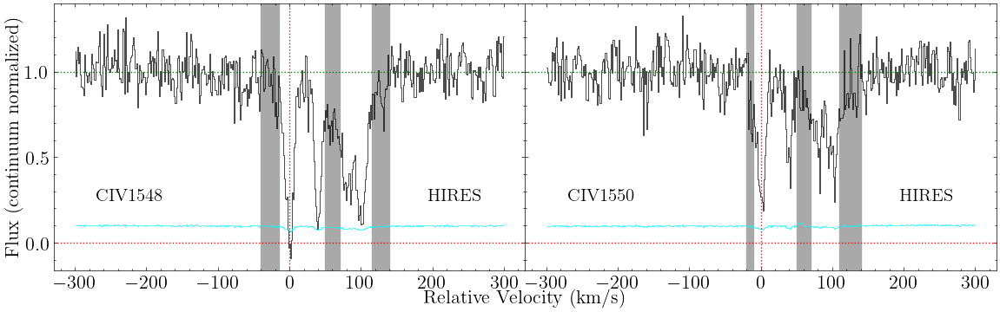

In [128]:
fig, axes = civ.plot_ion()

In [129]:
civ.init_ion([civ_1548_hires.init_values, civ_1548_hires.init_values])
#ciii.init_ion(np.array([[13.42,16,-1.15]]))

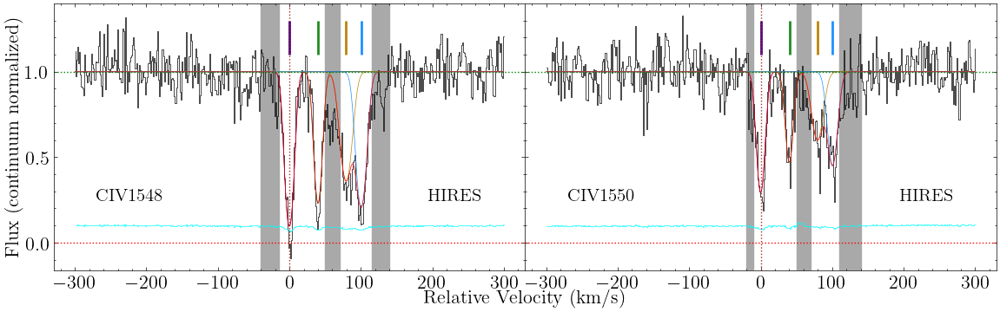

In [130]:
fig, axes = civ.plot_ion_init_fit(legend=False)

In [131]:
civ.fit_ion(tie_params_list = [['it1c1_logN', 'it2c1_logN'],
                               ['it1c1_b', 'it2c1_b'],
                               ['it1c1_dv_c', 'it2c1_dv_c'],
                               ['it1c2_logN', 'it2c2_logN'],
                               ['it1c2_b', 'it2c2_b'],
                               ['it1c2_dv_c', 'it2c2_dv_c'],
                               ['it1c3_logN', 'it2c3_logN'],
                               ['it1c3_b', 'it2c3_b'],
                               ['it1c3_dv_c', 'it2c3_dv_c'],
                               ['it1c4_logN', 'it2c4_logN'],
                               ['it1c4_b', 'it2c4_b'],
                               ['it1c4_dv_c', 'it2c4_dv_c'],
                              ],
            exclude_models=['it1c3_logN > it1c4_logN']
           )

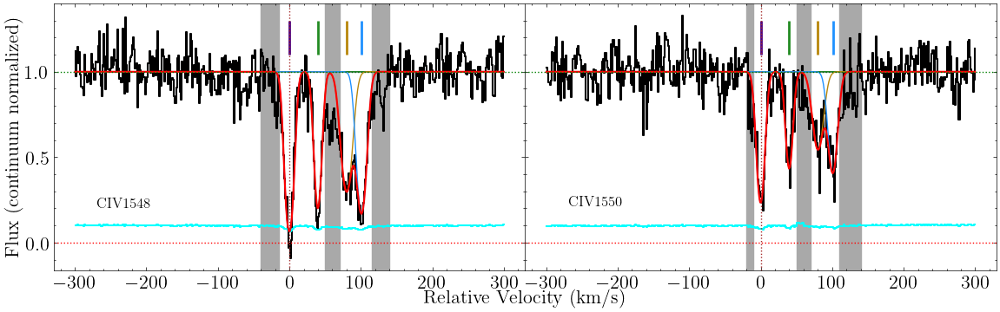

In [132]:
fig, axes = civ.plot_ion_best_fit(legend=False)

In [133]:
#civ.fit_ion_emcee(loaddir=rootdir, scale_covar=1e-10, n_walkers=100, n_steps=2500)
#civ.fit_ion_emcee(load=True, loaddir=rootdir)

In [134]:
#fig, axes = civ.plot_samples()

In [135]:
#civ.plot_corner()

# CIII

## CIII 977 (NUV)

In [136]:
ciii_977_nuv = ion_transition('CIII', 977, 'C', z_sys, 'COS NUV')

In [137]:
ciii_977_nuv.grab_ion_transition_info(delta_v=-2)

In [138]:
ciii_977_nuv.grab_ion_transition_spec(spec_fits_list, masks=[[-300,-280],[-80,-30],[40,60],[120,180],[270,300]])

In [139]:
ciii_977_nuv.cont_norm_flux(v_abs_range=[-70,180], degree=1)

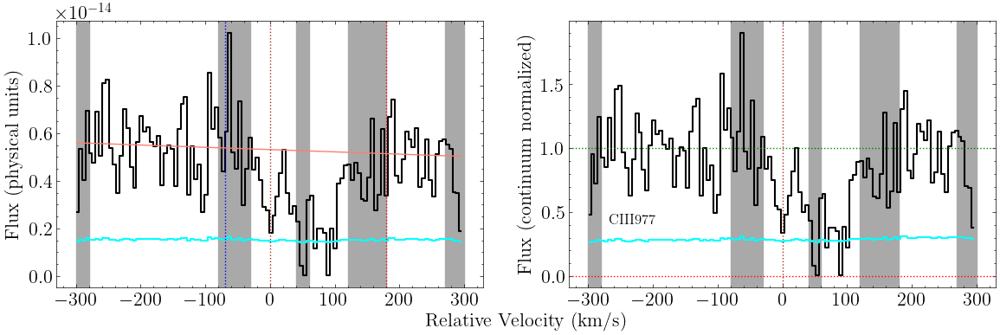

In [140]:
fig, ax = ciii_977_nuv.plot_ion_transition_spec_cont()

In [141]:
ciii_977_nuv.grab_ion_transition_lsf(lsf_fits_list)

In [142]:
ciii_977_nuv.get_EW_total(-70,140)

Integration window: [-70, 140]
EW, 1sig: 222, 30
EW-3sig: 90.746


In [143]:
ciii_977_nuv.init_ion_transition(init_values = [[14.0, 6.4, 0],[13.1, 6.1, 40.1],
                                                [13.9, 10, 79.3],[13.2, 8.2, 100.5]], 
                             lsf_convolve = True)

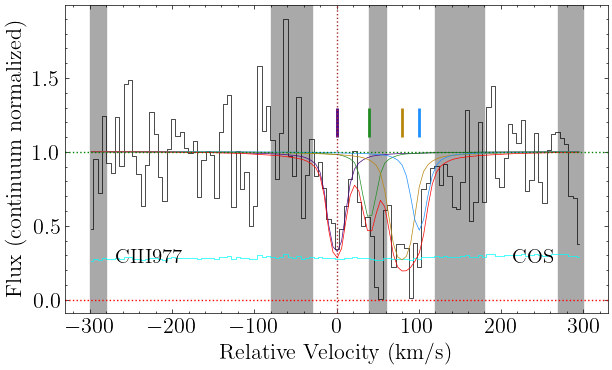

In [144]:
fig, ax = ciii_977_nuv.plot_ion_transition_init_fit(legend=False)

In [145]:
ciii_977_nuv.fit_ion_transition(fix_params_list = ['it1c1_b', 'it1c1_dv_c', 
                                                  'it1c2_b', 'it1c2_dv_c'])

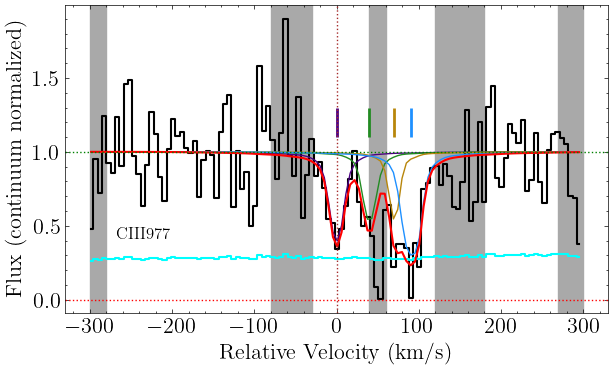

In [146]:
fig, ax = ciii_977_nuv.plot_ion_transition_best_fit(legend=False)

In [147]:
ciii_977_nuv.get_upper_lim(8.2)

logN-1sig: 12.6
logN-2sig: 12.9
logN-3sig: 13.2


## CIII ion

In [148]:
ciii = ion(z_sys, 'CIII', [ciii_977_nuv])

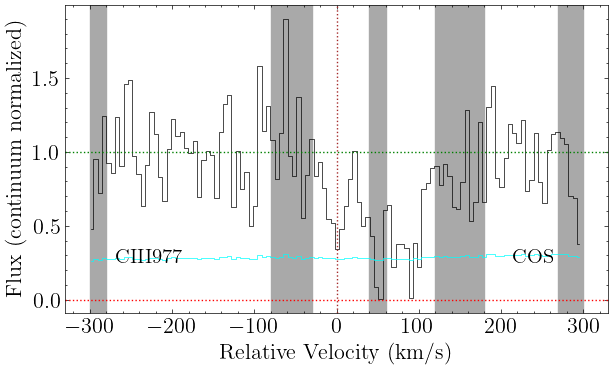

In [149]:
fig, axes = ciii.plot_ion()

In [150]:
ciii.init_ion([[[13.5, 6.7, 0], [13.2, 6.2, 40], [13.8, 10, 80], [13.3, 8.2, 100]]])

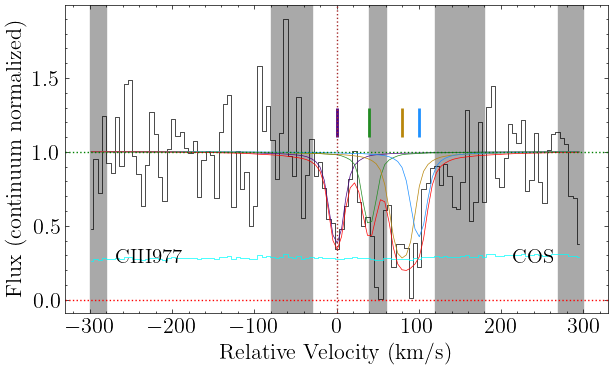

In [151]:
fig, axes = ciii.plot_ion_init_fit(legend=False)

In [152]:
ciii.fit_ion(fix_params_list=[
                              'it1c1_dv_c', 'it1c1_b',
                              'it1c2_dv_c', 'it1c2_b', 
                              'it1c3_dv_c', 'it1c3_b',
                              'it1c4_dv_c', 'it1c4_b' 
                             ],
             exclude_models = [
                 'it1c1_logN < it1c2_logN',
                 'it1c3_logN < it1c4_logN',
                 'it1c2_logN > it1c4_logN'
             ],
            lower_bounds_dict = {'it1c1_b':3.7,
                                 'it1c3_b':3.7},
            upper_bounds_dict = {'it1c1_logN':14.9,
                                 'it1c2_logN': 14.1,
                                 'it1c3_logN':14.3,
                                 'it1c4_logN':14.5}
            )

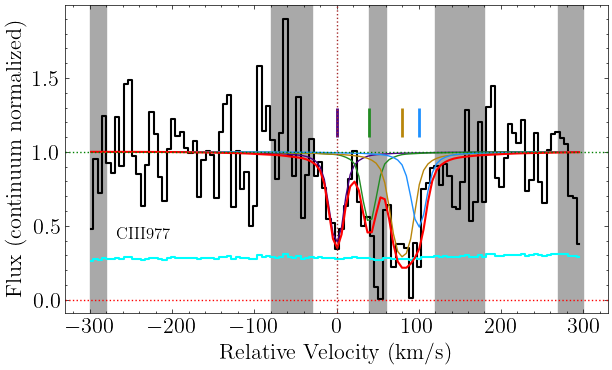

In [153]:
fig, axes = ciii.plot_ion_best_fit(legend=False)

In [154]:
#ciii.fit_ion_emcee(loaddir=rootdir, scale_covar=1e-18, n_walkers=200, n_steps=2000)
#ciii.fit_ion_emcee(load=True, loaddir=rootdir)

In [155]:
#fig, axes = ciii.plot_samples()

In [156]:
#ciii.plot_corner()

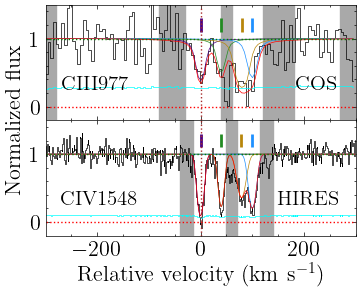

In [157]:
fig, axes = plt.subplots(2, 1, figsize=(4,1.5*2), sharex=True, sharey=True)

civ_1548_hires.plot_ion_transition_init_fit(fig=fig, ax=axes[1], legend=False, label_axes=False)
ciii_977_nuv.plot_ion_transition_init_fit(fig=fig, ax=axes[0], legend=False, label_axes=False)

axes[0].set_xlim(-300,300)
axes[0].set_ylim(-0.2,1.5)

plt.subplots_adjust(wspace=0., hspace=0)

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])
ax_label.set_xlabel(r'Relative velocity (km s${}^{-1}$)', labelpad=20) # Use argument `labelpad` to move label downwards.
ax_label.set_ylabel('Normalized flux', labelpad=15)

plt.savefig(rootdir+'Figures/z_104_CIV_CIII.png', dpi=300)

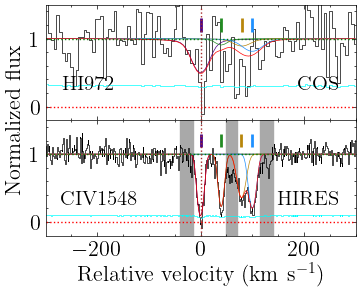

In [158]:
fig, axes = plt.subplots(2, 1, figsize=(4,1.5*2), sharex=True, sharey=True)

hi_972_nuv.plot_ion_transition_init_fit(fig=fig, ax=axes[0], legend=False, label_axes=False)
civ_1548_hires.plot_ion_transition_init_fit(fig=fig, ax=axes[1], legend=False, label_axes=False)

axes[0].set_xlim(-300,300)
axes[0].set_ylim(-0.2,1.5)

plt.subplots_adjust(wspace=0., hspace=0)

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])
ax_label.set_xlabel(r'Relative velocity (km s${}^{-1}$)', labelpad=20) # Use argument `labelpad` to move label downwards.
ax_label.set_ylabel('Normalized flux', labelpad=15)

plt.savefig(rootdir+'Figures/z_104_HI_CIV.png', dpi=300)

# CIV + CIII

In [159]:
civ_ciii = ion_suite(z_sys, 'CIV+CIII', [civ, ciii])

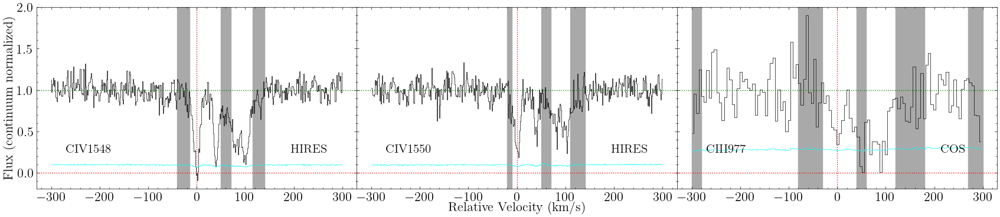

In [160]:
fig, axes = civ_ciii.plot_ion_suite(n_cols=3)

In [161]:
civ_ciii.init_ion_suite([
    [[13.6, 6.8, 0], [13.3, 5.9, 40], [13.4, 10, 80], [13.5, 8, 100]], # CIV
    [[13.6, 6.8, 0], [13.3, 5.9, 40], [13.4, 10, 80], [13.5, 8, 100]],     
    [[13.3, 7, 0], [14.2, 7, 40], [14.6, 10, 80], [13.0, 7, 100]], # CIII
]
)

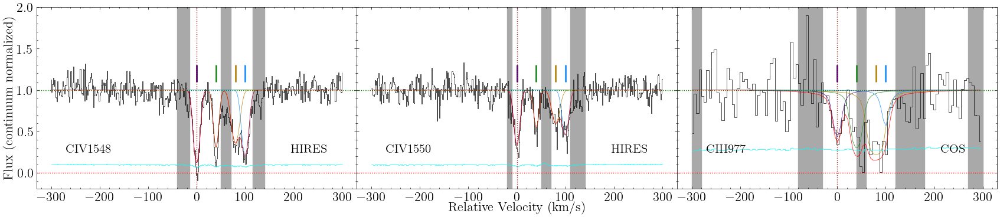

In [162]:
fig, axes = civ_ciii.plot_ion_suite_init_fit(n_cols=3, legend=False)

In [163]:
civ_ciii.fit_ion_suite(tie_params_list = [
                                        ['it1c1_logN', 'it2c1_logN'], # CIV, c1
                                        ['it1c1_b', 'it2c1_b'],
                                        ['it1c2_logN', 'it2c2_logN'], # CIV, c2
                                        ['it1c2_b', 'it2c2_b'],
                                        ['it1c3_logN', 'it2c3_logN'], # CIV, c3
                                        ['it1c3_b', 'it2c3_b'],
                                        ['it1c4_logN', 'it2c4_logN'], # CIV, c3
                                        ['it1c4_b', 'it2c4_b'],
                                        ['it1c1_dv_c', 'it2c1_dv_c'], # c1, dv_c
                                        ['it1c1_dv_c', 'it3c1_dv_c'],
                                        ['it1c2_dv_c', 'it2c2_dv_c'], # c2, dv_c
                                        ['it1c2_dv_c', 'it3c2_dv_c'],
                                        ['it1c3_dv_c', 'it2c3_dv_c'], # c3, dv_c
                                        ['it1c3_dv_c', 'it3c3_dv_c'],
                                        ['it1c4_dv_c', 'it2c4_dv_c'], # c4, dv_c
                                        ['it1c4_dv_c', 'it3c4_dv_c'],
                                         ],
                      exclude_models = ['it1c3_logN > it1c4_logN', # CIV
                                        'it3c3_b < it3c1_b',
                                        'it3c3_b < it3c2_b',
                                        'it3c3_b < it3c4_b'],
                      lower_bounds_dict = {'it3c1_b': 3.7,
                                           'it3c2_b': 3.7,
                                           'it3c3_b': 3.7,
                                           'it3c4_b': 3.7})

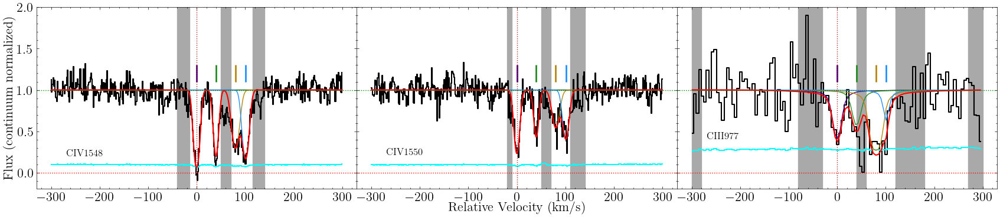

In [164]:
fig, axes = civ_ciii.plot_ion_suite_best_fit(n_cols=3, legend=False)

In [165]:
#civ_ciii.result

In [166]:
#civ_ciii.fit_ion_suite_emcee(loaddir=rootdir, n_walkers=200, n_steps=5000, scale_covar=1e-20)
#civ_ciii.fit_ion_suite_emcee(load=True, loaddir=rootdir)

In [167]:
#fig, axes = civ_ciii.plot_samples(n_cols=3)

In [168]:
#civ_ciii.plot_corner()

# NIV

## NIV 765

In [169]:
niv_765_fuv = ion_transition('NIV', 765, 'N', z_sys, 'COS FUV')

In [170]:
niv_765_fuv.grab_ion_transition_info()

In [171]:
niv_765_fuv.grab_ion_transition_spec(spec_fits_list, masks=[[-90,-10],[50,70],[120,160]])

In [172]:
niv_765_fuv.cont_norm_flux(v_abs_range=[-90,160], degree=1)

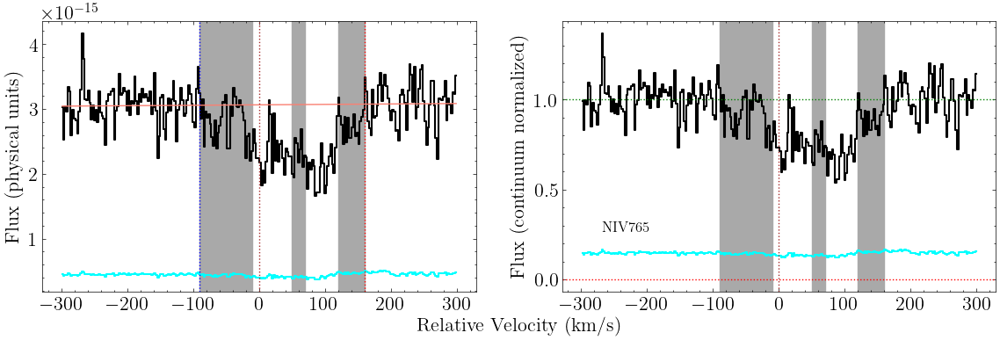

In [173]:
fig, ax = niv_765_fuv.plot_ion_transition_spec_cont()

In [174]:
niv_765_fuv.get_EW_total(-40,120)

Integration window: [-40, 120]
EW, 1sig: 94, 7
EW-3sig: 19.914


In [175]:
niv_765_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [176]:
niv_765_fuv.init_ion_transition(init_values = [[13.1, 7, 0], [13.1, 6, 40], [13.1, 10, 80], [13.1, 8, 100]], 
                             lsf_convolve = True)

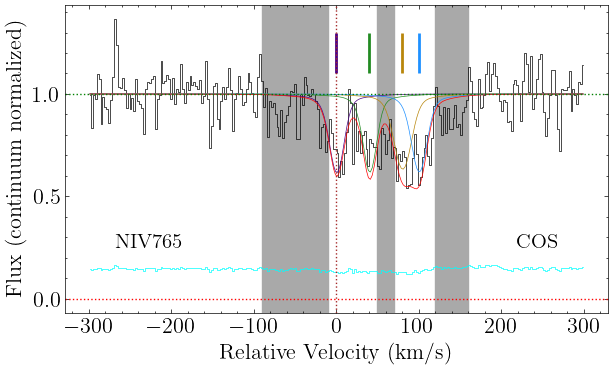

In [177]:
fig, ax = niv_765_fuv.plot_ion_transition_init_fit(legend=False)

In [178]:
niv_765_fuv.fit_ion_transition(fix_params_list=['it1c1_dv_c', 'it1c2_dv_c', 'it1c3_dv_c', 'it1c4_dv_c',
                                                'it1c1_b', 'it1c2_b', 'it1c3_b', 'it1c4_b',])

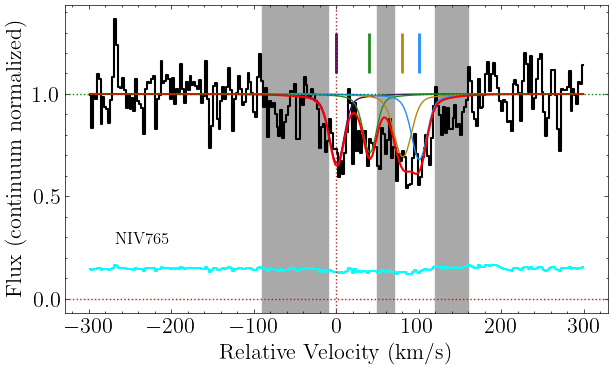

In [179]:
fig, ax = niv_765_fuv.plot_ion_transition_best_fit(legend=False)

## NIV ion

In [180]:
niv = ion(z_sys, 'NIV', [niv_765_fuv])

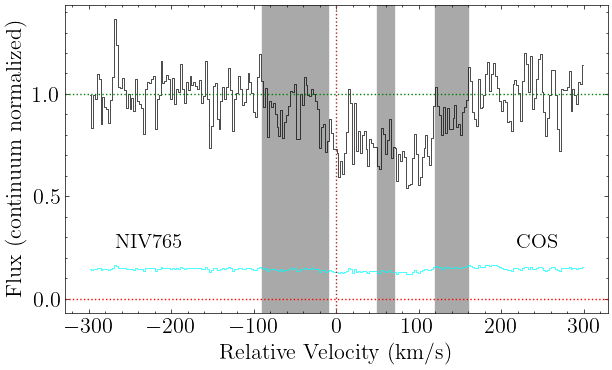

In [181]:
fig, axes = niv.plot_ion()

In [182]:
niv.init_ion([[[13.1, 7, 0], [12.8, 6, 40], [12.9, 10, 80], [13.1, 8, 100]]])

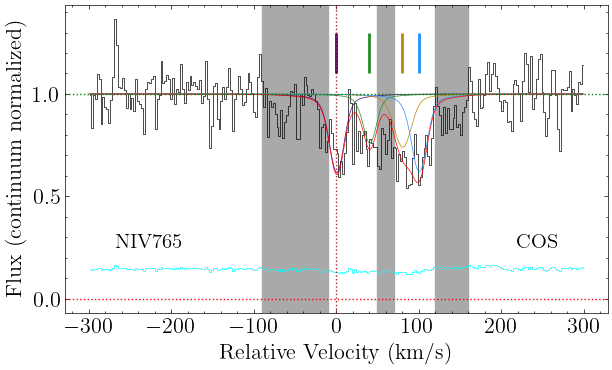

In [183]:
fig, axes = niv.plot_ion_init_fit(legend=False)

In [184]:
niv.fit_ion(fix_params_list=['it1c1_dv_c', 'it1c2_dv_c', 'it1c3_dv_c', 'it1c4_dv_c',
                             'it1c1_b', 'it1c2_b', 'it1c3_b', 'it1c4_b',],)

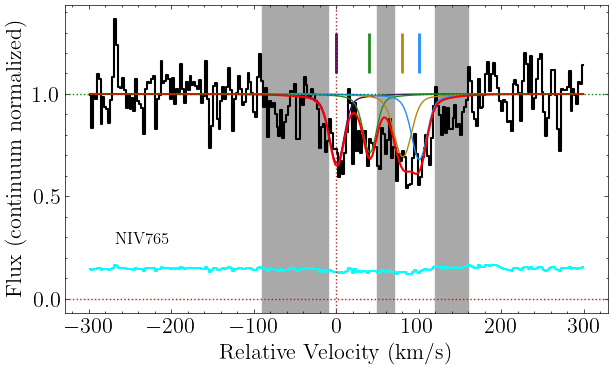

In [185]:
fig, axes = niv.plot_ion_best_fit(legend=False)

In [186]:
#niv.fit_ion_emcee(loaddir=rootdir, scale_covar=1e-18, n_walkers=100, n_steps=2500)
#niv.fit_ion_emcee(load=True, loaddir=rootdir)

In [187]:
#fig, axes = niv.plot_samples()

In [188]:
#niv.plot_corner()

# OIII

## OIII 832

In [189]:
oiii_832_fuv = ion_transition('OIII', 832, 'O', z_sys, 'COS FUV')

In [190]:
oiii_832_fuv.grab_ion_transition_info()

In [191]:
oiii_832_fuv.grab_ion_transition_spec(spec_fits_list, masks=[[70,170],[-40,-10]])

In [192]:
oiii_832_fuv.cont_norm_flux(v_abs_range=[-40,170], degree=1)

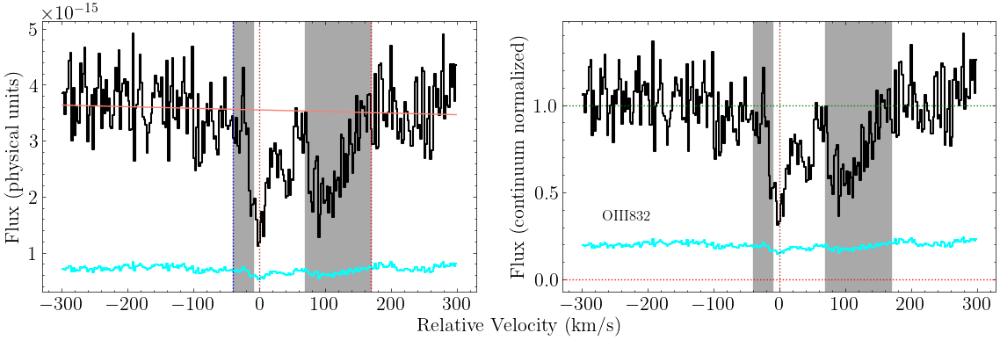

In [193]:
fig, ax = oiii_832_fuv.plot_ion_transition_spec_cont()

In [194]:
oiii_832_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [195]:
oiii_832_fuv.get_EW_total(-40,120)

Integration window: [-40, 120]
EW, 1sig: 136, 9
EW-3sig: 27.364


In [196]:
oiii_832_fuv.init_ion_transition(init_values = [[14.4, 6.4, 0],
                                                [13.9, 6.1, 40.1], 
                                                [13.59, 10, 79.3], 
                                                [13.60, 8.2, 100.5]], 
                             lsf_convolve = True)

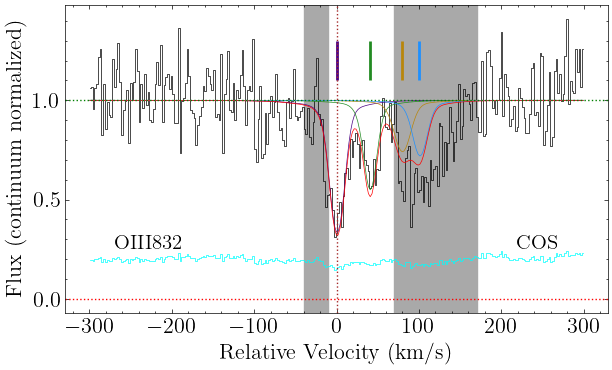

In [197]:
fig, ax = oiii_832_fuv.plot_ion_transition_init_fit(legend=False)

In [198]:
oiii_832_fuv.fit_ion_transition(fix_params_list = ['it1c1_dv_c', 
                                                  'it1c2_dv_c',
                                                  'it1c3_dv_c',
                                                  'it1c4_dv_c'])

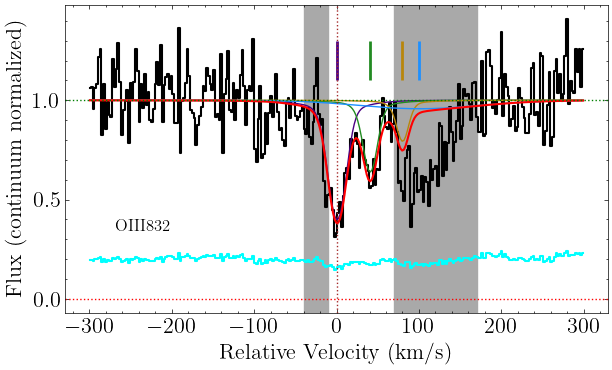

In [199]:
fig, ax = oiii_832_fuv.plot_ion_transition_best_fit(legend=False)

## OIII 702

In [200]:
oiii_702_fuv = ion_transition('OIII', 702, 'O', z_sys, 'COS FUV')

In [201]:
oiii_702_fuv.grab_ion_transition_info(delta_v=2)

In [202]:
oiii_702_fuv.grab_ion_transition_spec(spec_fits_list, masks=[[-300,-80],[10,70],[105,170]])

In [203]:
oiii_702_fuv.cont_norm_flux(v_abs_range=[-40,170], degree=1)

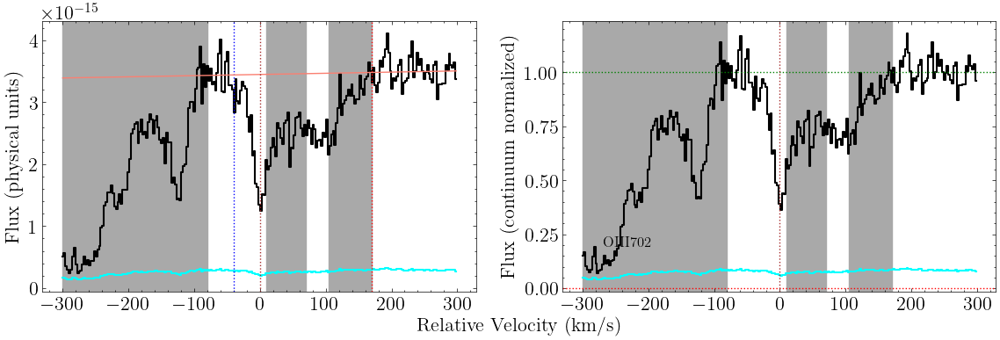

In [204]:
fig, ax = oiii_702_fuv.plot_ion_transition_spec_cont()

(-0.1, 1.2)

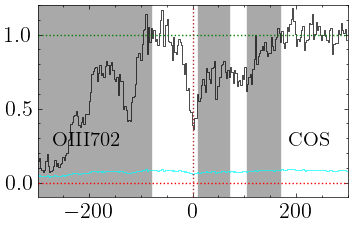

In [205]:
fig, ax = plt.subplots(1, figsize=(4,2.5))

oiii_702_fuv.plot_ion_transition_spec(fig=fig, ax = ax, label_axes=False)

ax.set_xlim(-300,300)
ax.set_ylim(-0.1,1.2)

In [206]:
oiii_702_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [207]:
oiii_702_fuv.get_EW_total(-30,110)

Integration window: [-30, 110]
EW, 1sig: 99, 3
EW-3sig: 9.711


In [208]:
oiii_702_fuv.init_ion_transition(init_values = [[14.4, 6.4, 0],
                                                [13.9, 6.1, 40.1], 
                                                [13.59, 10, 79.3], 
                                                [13.60, 8.2, 100.5]], 
                             lsf_convolve = True)

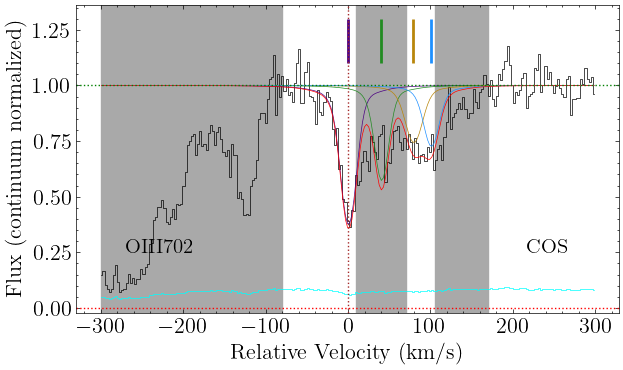

In [209]:
fig, ax = oiii_702_fuv.plot_ion_transition_init_fit(legend=False)

In [210]:
oiii_702_fuv.fit_ion_transition(fix_params_list = ['it1c1_dv_c', 'it1c1_b', 
                                                  'it1c2_dv_c', 'it1c2_b',
                                                  'it1c3_dv_c', 'it1c3_b',
                                                  'it1c4_dv_c', 'it1c4_b',])

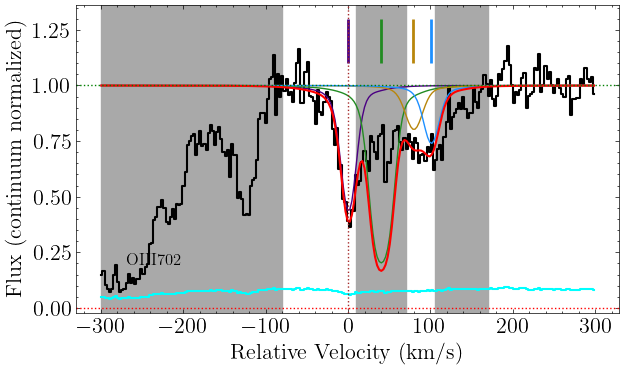

In [211]:
fig, ax = oiii_702_fuv.plot_ion_transition_best_fit(legend=False)

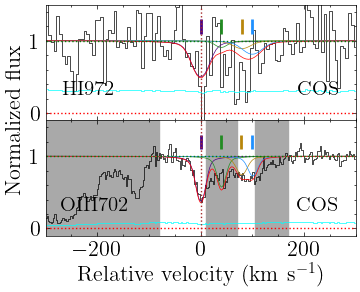

In [212]:
fig, axes = plt.subplots(2, 1, figsize=(4,1.5*2), sharex=True, sharey=True)

hi_972_nuv.plot_ion_transition_init_fit(fig=fig, ax=axes[0], legend=False, label_axes=False)
oiii_702_fuv.plot_ion_transition_init_fit(fig=fig, ax=axes[1], legend=False, label_axes=False)

axes[0].set_ylim(-0.1,1.5)
axes[0].set_xlim(-300,300)

plt.subplots_adjust(wspace=0., hspace=0)

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])
ax_label.set_xlabel(r'Relative velocity (km s${}^{-1}$)', labelpad=20) # Use argument `labelpad` to move label downwards.
ax_label.set_ylabel('Normalized flux', labelpad=15)

plt.savefig(rootdir+'Figures/z_104_HI_OIII.png', dpi=300)

## OIII ion

In [213]:
oiii = ion(z_sys, 'OIII', [oiii_702_fuv, oiii_832_fuv])

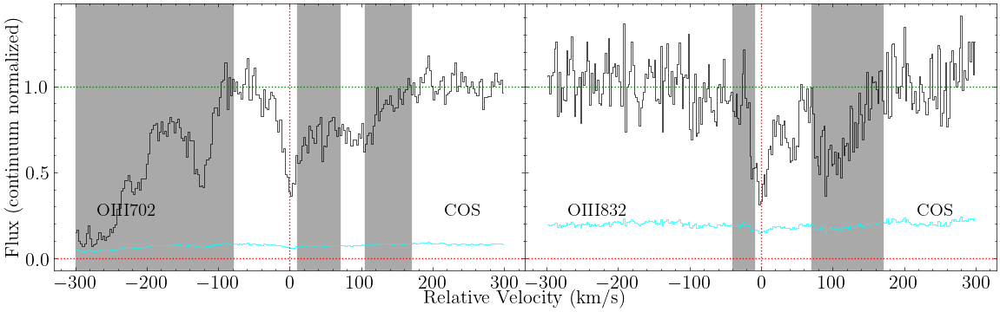

In [214]:
fig, axes = oiii.plot_ion()

In [215]:
oiii.init_ion([[[14.4,7,0],[13.9,6,40],[13.6,10,80],[13.6,8,100]],
              [[14.4,7,0],[13.9,6,40],[13.6,10,80],[13.6,8,100]]])

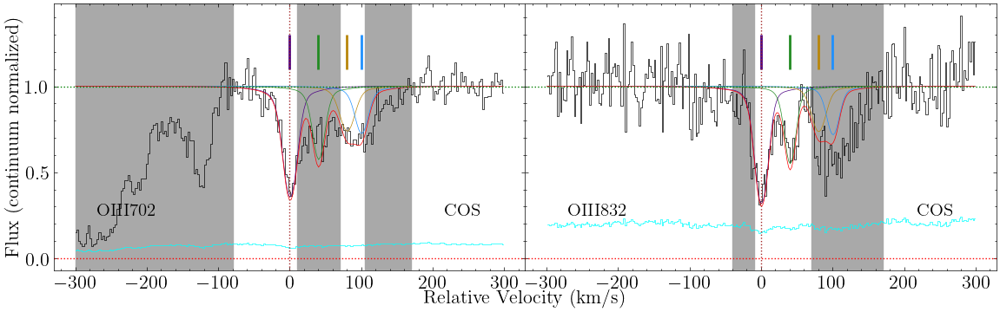

In [216]:
fig, axes = oiii.plot_ion_init_fit(legend=False)

In [217]:
oiii.fit_ion(tie_params_list = [['it1c1_logN', 'it2c1_logN'],
                               ['it1c1_b', 'it2c1_b'],
                               ['it1c1_dv_c', 'it2c1_dv_c'],
                               ['it1c2_logN', 'it2c2_logN'],
                               ['it1c2_b', 'it2c2_b'],
                               ['it1c2_dv_c', 'it2c2_dv_c'],
                               ['it1c3_logN', 'it2c3_logN'],
                               ['it1c3_b', 'it2c3_b'],
                               ['it1c3_dv_c', 'it2c3_dv_c'],
                               ['it1c4_logN', 'it2c4_logN'],
                               ['it1c4_b', 'it2c4_b'],
                               ['it1c4_dv_c', 'it2c4_dv_c']],
    fix_params_list=['it1c1_dv_c', 'it1c2_dv_c', 'it1c3_dv_c', 'it1c4_dv_c', 
                     'it1c1_b', 'it1c2_b', 'it1c3_b', 'it1c4_b'])

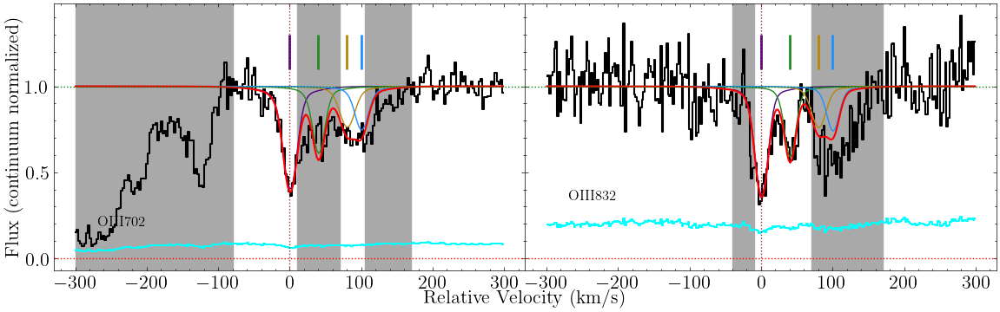

In [218]:
fig, axes = oiii.plot_ion_best_fit(legend=False)

In [219]:
#oiii.fit_ion_emcee(loaddir=rootdir, scale_covar=1e-7, n_walkers=100, n_steps=2500)
#oiii.fit_ion_emcee(load=True, loaddir=rootdir)

In [220]:
#fig, axes = oiii.plot_samples()

In [221]:
#oiii.plot_corner()

# OIV

## OIV 608

In [222]:
oiv_608_fuv = ion_transition('OIV', 608, 'O', z_sys, 'COS FUV')

In [223]:
oiv_608_fuv.grab_ion_transition_info()

In [224]:
oiv_608_fuv.grab_ion_transition_spec(spec_fits_list, masks=[[-300,-140],[-30,-10],[105,140]])#,[110,150]])

In [225]:
oiv_608_fuv.cont_norm_flux(v_abs_range=[-50,140], degree=1)

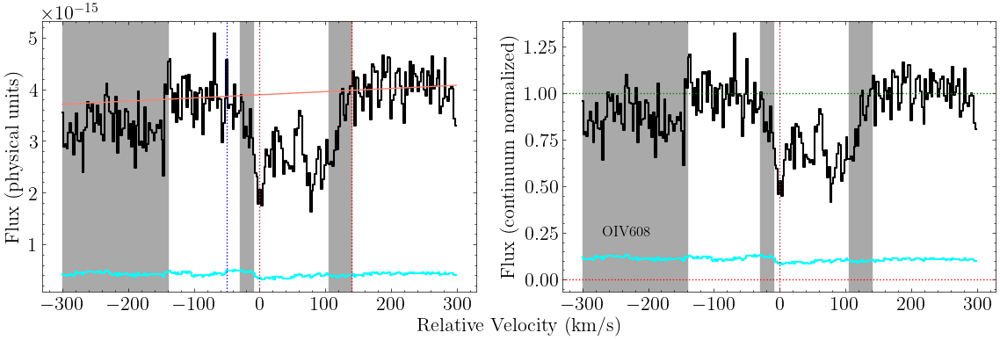

In [226]:
fig, ax = oiv_608_fuv.plot_ion_transition_spec_cont()

(-0.1, 1.2)

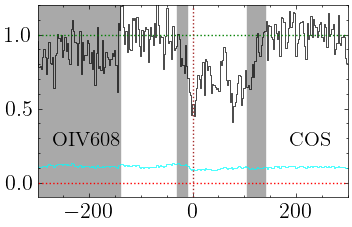

In [227]:
fig, ax = plt.subplots(1, figsize=(4,2.5))

oiv_608_fuv.plot_ion_transition_spec(fig=fig, ax = ax, label_axes=False)

ax.set_xlim(-300,300)
ax.set_ylim(-0.1,1.2)

In [228]:
oiv_608_fuv.get_EW_total(-50,140)

Integration window: [-50, 140]
EW, 1sig: 97, 4
EW-3sig: 13.362


In [229]:
oiv_608_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [230]:
oiv_608_fuv.init_ion_transition(init_values = [[14.5, 6.4, 0],
                                                [14.21, 6.1, 40.1], 
                                                [14.29, 10, 79.3], 
                                                [13.9, 8.2, 100.5]], 
                             lsf_convolve = True)

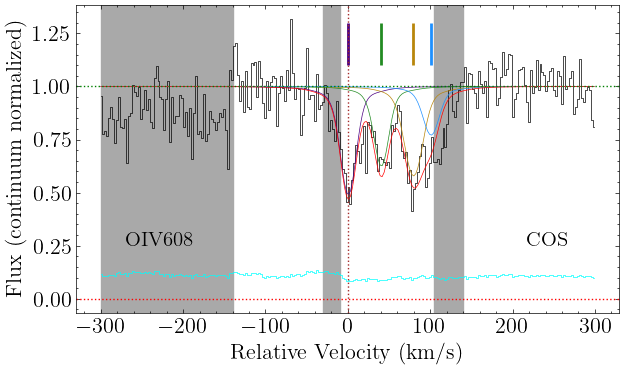

In [231]:
fig, ax = oiv_608_fuv.plot_ion_transition_init_fit(legend=False)

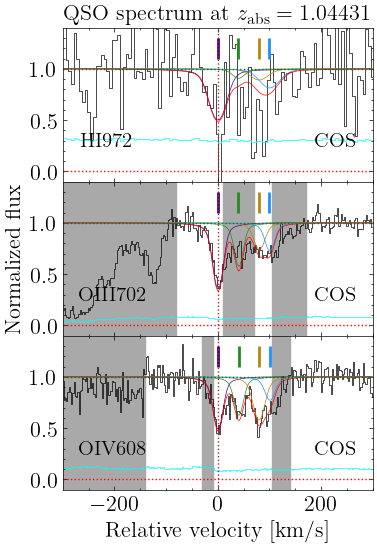

In [232]:
fig, axes = plt.subplots(3, 1, figsize=(4,2.*3), sharex=True, sharey=True)

hi_972_nuv.plot_ion_transition_init_fit(fig=fig, ax = axes[0], label_axes=False, legend=False)

oiii_702_fuv.plot_ion_transition_init_fit(fig=fig, ax = axes[1], label_axes=False, legend=False)

oiv_608_fuv.plot_ion_transition_init_fit(fig=fig, ax = axes[2], label_axes=False, legend=False)

axes[2].set_xlim(-300,300)
axes[2].set_ylim(-0.1,1.4)

axes[1].set_ylabel('Normalized flux')
axes[2].set_xlabel('Relative velocity [km/s]')
plt.subplots_adjust(wspace=0.2, hspace=0)

axes[0].set_title('QSO spectrum at $z_\mathrm{abs} = 1.04431$', fontsize=16)

plt.savefig(rootdir+'Figures/abs_summary.png', dpi=300)

In [233]:
oiv_608_fuv.fit_ion_transition(fix_params_list=['it1c1_dv_c', 'it1c2_dv_c', 'it1c3_dv_c', 'it1c4_dv_c'])

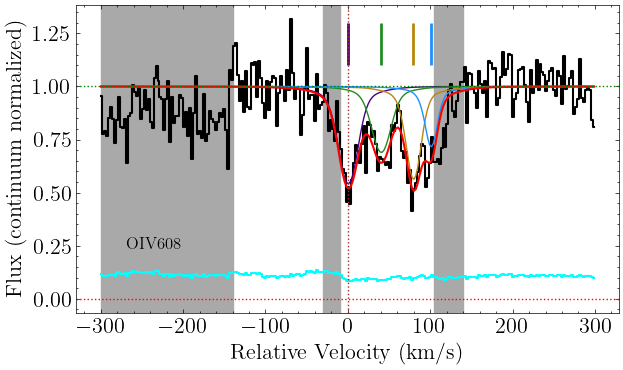

In [234]:
fig, ax = oiv_608_fuv.plot_ion_transition_best_fit(legend=False)

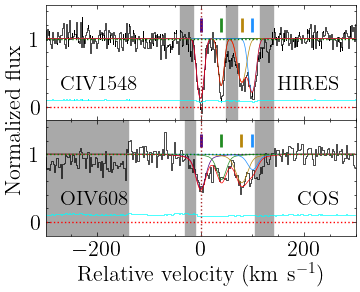

In [235]:
fig, axes = plt.subplots(2, 1, figsize=(4,1.5*2), sharex=True, sharey=True)

civ_1548_hires.plot_ion_transition_init_fit(fig=fig, ax=axes[0], legend=False, label_axes=False)
oiv_608_fuv.plot_ion_transition_init_fit(fig=fig, ax=axes[1], legend=False, label_axes=False)

axes[0].set_xlim(-300,300)
axes[0].set_ylim(-0.2,1.5)

plt.subplots_adjust(wspace=0., hspace=0)

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])
ax_label.set_xlabel(r'Relative velocity (km s${}^{-1}$)', labelpad=20) # Use argument `labelpad` to move label downwards.
ax_label.set_ylabel('Normalized flux', labelpad=15)

plt.savefig(rootdir+'Figures/z_104_CIV_OIV.png', dpi=300)

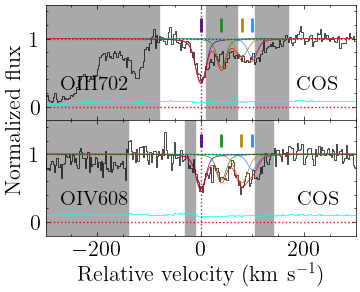

In [236]:
fig, axes = plt.subplots(2, 1, figsize=(4,1.5*2), sharex=True, sharey=True)

oiii_702_fuv.plot_ion_transition_init_fit(fig=fig, ax = axes[0], label_axes=False, legend=False)
oiv_608_fuv.plot_ion_transition_init_fit(fig=fig, ax = axes[1], label_axes=False, legend=False)

axes[0].set_xlim(-300,300)
axes[0].set_ylim(-0.2,1.5)

plt.subplots_adjust(wspace=0., hspace=0)

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])
ax_label.set_xlabel(r'Relative velocity (km s${}^{-1}$)', labelpad=20) # Use argument `labelpad` to move label downwards.
ax_label.set_ylabel('Normalized flux', labelpad=15)

plt.savefig(rootdir+'Figures/z_104_OIII_OIV.png', dpi=300)

## OIV 787

In [237]:
oiv_787_fuv = ion_transition('OIV', 787, 'O', z_sys, 'COS FUV')

In [238]:
oiv_787_fuv.grab_ion_transition_info()

In [239]:
oiv_787_fuv.grab_ion_transition_spec(spec_fits_list, masks=[[-300,-155],[-80,-5],[90,160]])

In [240]:
oiv_787_fuv.cont_norm_flux(v_abs_range=[-70,160], degree=1)

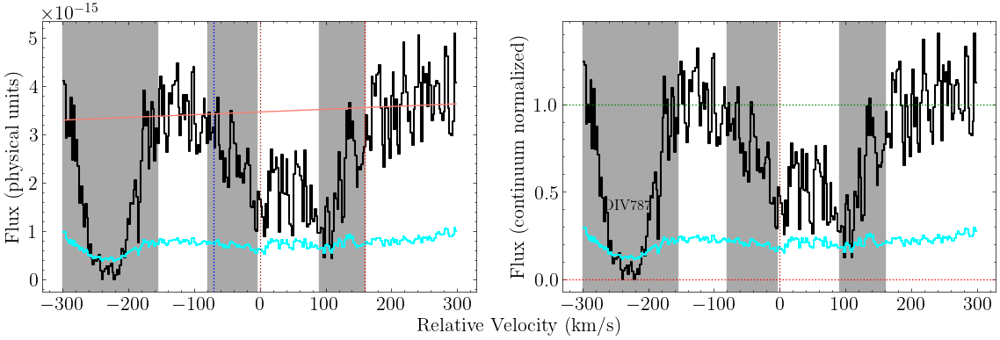

In [241]:
fig, ax = oiv_787_fuv.plot_ion_transition_spec_cont()

In [242]:
oiv_787_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [243]:
oiv_787_fuv.get_EW_total(-40,120)

Integration window: [-40, 120]
EW, 1sig: 208, 10
EW-3sig: 30.014


In [244]:
oiv_787_fuv.init_ion_transition(init_values = oiv_608_fuv.best_values, 
                             lsf_convolve = True)

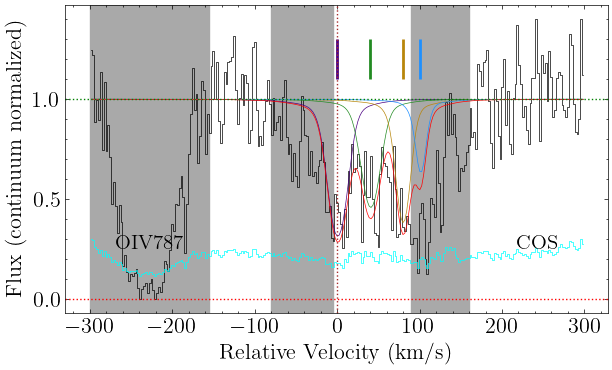

In [245]:
fig, ax = oiv_787_fuv.plot_ion_transition_init_fit(legend=False)

In [246]:
oiv_787_fuv.fit_ion_transition()#fix_params_list=['it1c1_dv_c', 'it1c2_dv_c', 'it1c3_dv_c', 'it1c4_dv_c'])

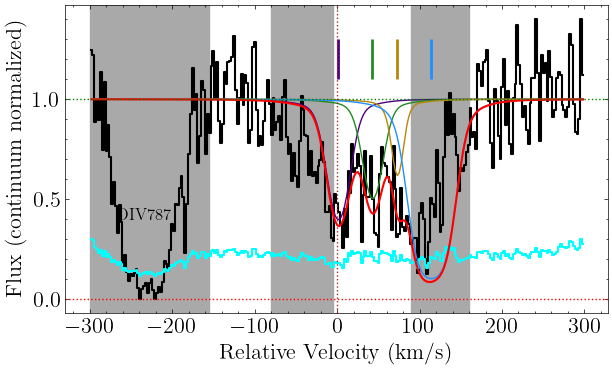

In [247]:
fig, ax = oiv_787_fuv.plot_ion_transition_best_fit(legend=False)

## OIV ion

In [248]:
oiv = ion(z_sys, 'OIV', [oiv_608_fuv, oiv_787_fuv])

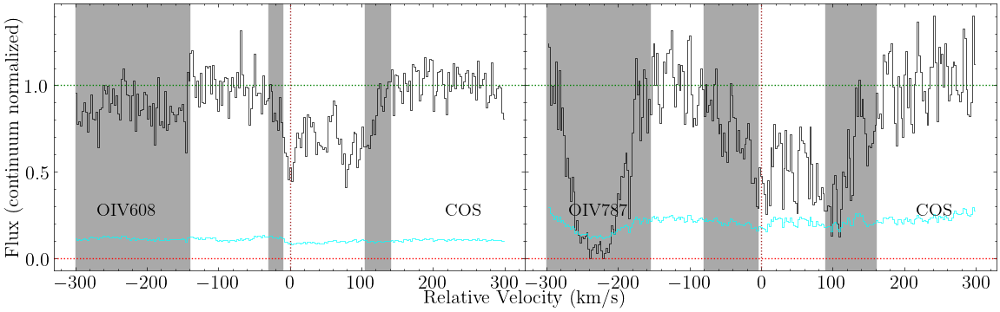

In [249]:
fig, axes = oiv.plot_ion()

In [250]:
oiv.init_ion([[[14.4, 7, 0],[14.2, 6, 40], [14.3, 10,80], [14.1, 8, 100]],
              [[14.4, 7, 0],[14.2, 6, 40], [14.3, 10,80], [14.1, 8, 100]],])

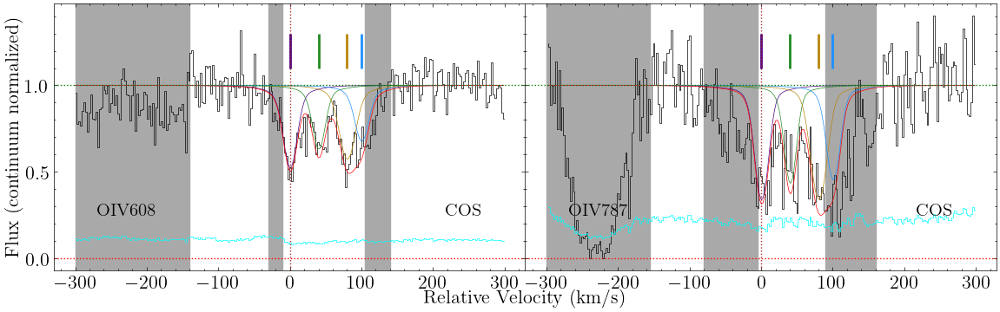

In [251]:
fig, axes = oiv.plot_ion_init_fit(legend=False)

In [252]:
oiv.fit_ion(tie_params_list = [['it1c1_logN', 'it2c1_logN'],
                               ['it1c1_b', 'it2c1_b'],
                               ['it1c1_dv_c', 'it2c1_dv_c'],
                               ['it1c2_logN', 'it2c2_logN'],
                               ['it1c2_b', 'it2c2_b'],
                               ['it1c2_dv_c', 'it2c2_dv_c'],
                               ['it1c3_logN', 'it2c3_logN'],
                               ['it1c3_b', 'it2c3_b'],
                               ['it1c3_dv_c', 'it2c3_dv_c'],
                               ['it1c4_logN', 'it2c4_logN'],
                               ['it1c4_b', 'it2c4_b'],
                               ['it1c4_dv_c', 'it2c4_dv_c']],
    fix_params_list=['it1c1_dv_c', 'it1c2_dv_c', 'it1c3_dv_c', 'it1c4_dv_c',
                     'it1c1_b', 'it1c2_b', 'it1c3_b', 'it1c4_b'])

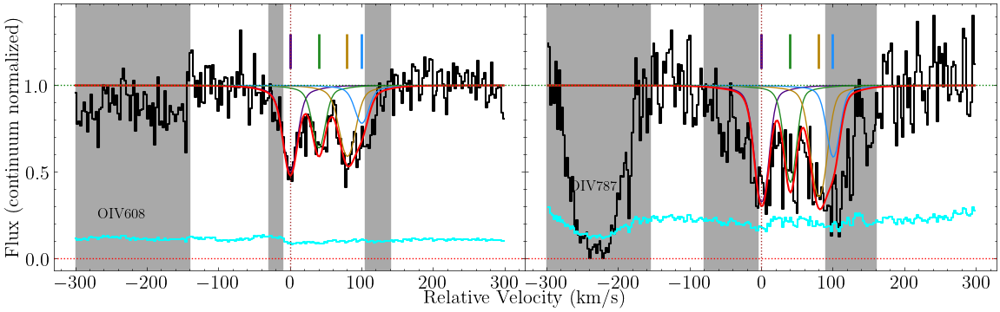

In [253]:
fig, axes = oiv.plot_ion_best_fit(legend=False)

In [254]:
#.fit_ion_emcee(loaddir=rootdir, scale_covar=1e-18, n_walkers=100, n_steps=2500)
#oiv.fit_ion_emcee(load=True, loaddir=rootdir)

In [255]:
#fig, axes = oiv.plot_samples()

In [256]:
#oiv.plot_corner()

# OV

## OV 629

In [322]:
ov_629_fuv = ion_transition('OV', 629, 'O', z_sys, 'COS FUV')

In [323]:
ov_629_fuv.grab_ion_transition_info()

In [324]:
ov_629_fuv.grab_ion_transition_spec(spec_fits_list)

In [325]:
ov_629_fuv.cont_norm_flux(v_abs_range=[-60,170], degree=1)

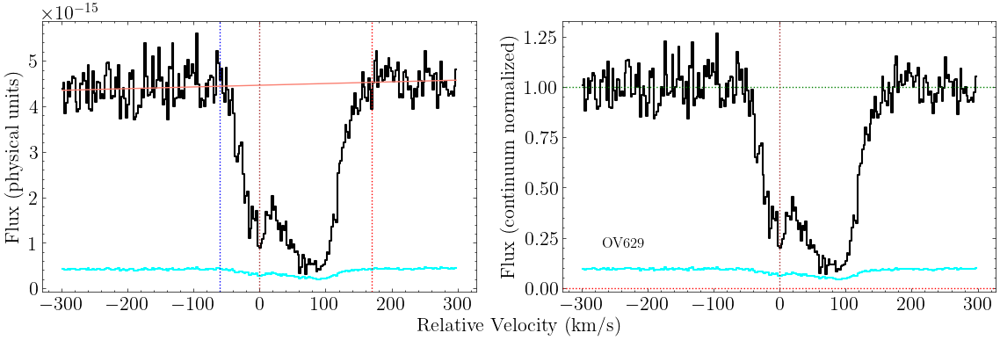

In [326]:
fig, ax = ov_629_fuv.plot_ion_transition_spec_cont()

In [327]:
ov_629_fuv.get_EW_total(-60,170)

Integration window: [-60, 170]
EW, 1sig: 254, 3
EW-3sig: 10.488


In [328]:
ov_629_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [329]:
ov_629_fuv.init_ion_transition(init_values = [[13.97, 23, 0],
                                                [13.6, 6.1, 40.1], 
                                                [14.34, 26, 79.3], 
                                                [14.1, 8.2, 100.5]], 
                             lsf_convolve = True)

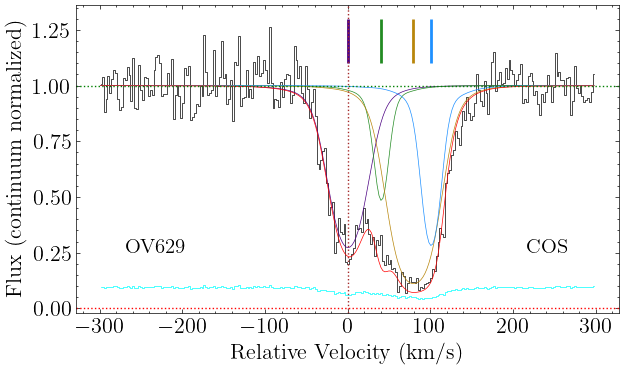

In [265]:
fig, ax = ov_629_fuv.plot_ion_transition_init_fit(legend=False)

In [266]:
ov_629_fuv.fit_ion_transition(fix_params_list = ['it1c1_dv_c', 
                                                  'it1c2_dv_c',
                                                  'it1c3_dv_c'])

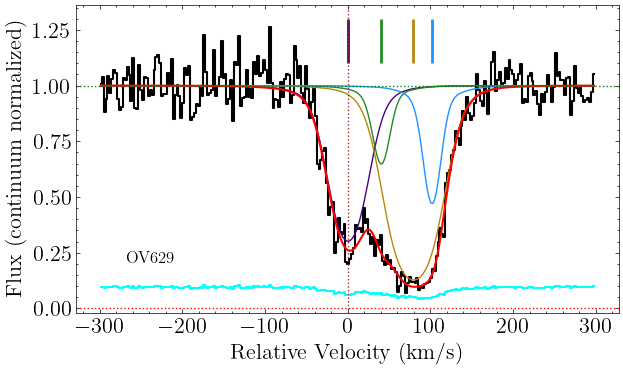

In [267]:
fig, ax = ov_629_fuv.plot_ion_transition_best_fit(legend=False)

In [268]:
#ov_629_fuv.result

## OV ion

In [269]:
ov = ion(z_sys, 'OV', [ov_629_fuv])

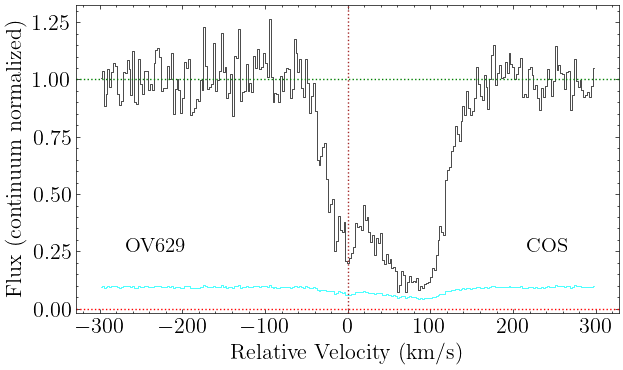

In [270]:
fig, axes = ov.plot_ion()

In [271]:
ov.init_ion([[[14.1, 15., 0],[13.6, 5.9, 40], [14.4, 20, 80],[13.8, 8.1, 100]]])

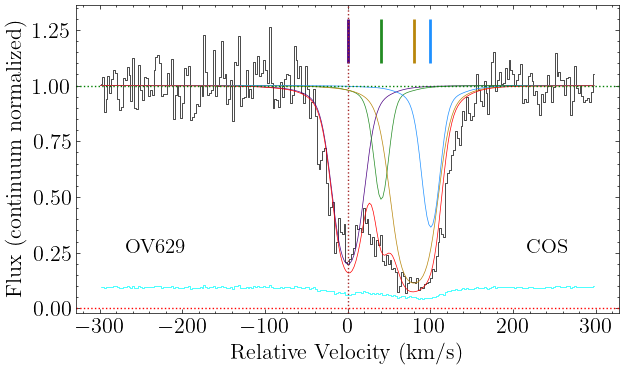

In [272]:
fig, axes = ov.plot_ion_init_fit(legend=False)

In [273]:
ov.fit_ion(fix_params_list = ['it1c1_dv_c', 'it1c2_dv_c', 'it1c3_dv_c', 'it1c4_dv_c', 'it1c2_b', 'it1c4_b'],
           exclude_models = ['it1c2_logN > it1c4_logN',
                             'it1c3_b < it1c1_b',],
                             #'it1c4_b < it1c2_b'],
          lower_bounds_dict = {'it1c2_b':3.2,
                               'it1c4_b':3.2})

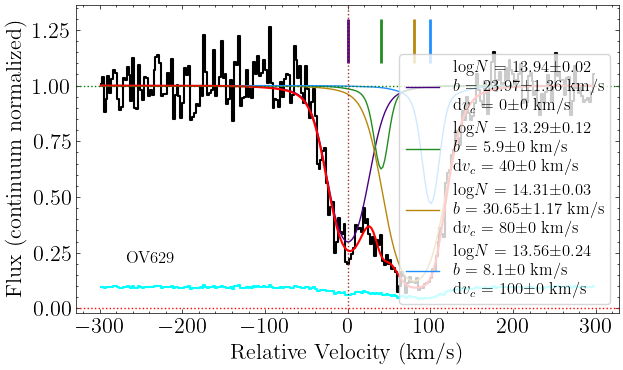

In [274]:
fig, axes = ov.plot_ion_best_fit()

In [275]:
#ov.fit_ion_emcee(loaddir=rootdir, scale_covar=1e-19, n_walkers=100, n_steps=2500)
#ov.fit_ion_emcee(load=True, loaddir=rootdir)

In [276]:
#fig, axes = ov.plot_samples()

In [277]:
#ov.plot_corner()

# OVI

## OVI 1031

In [278]:
ovi_1031_stis = ion_transition('OVI', 1031, 'O', z_sys, 'STIS')

In [279]:
ovi_1031_stis.grab_ion_transition_info(delta_v=5)

In [280]:
ovi_1031_stis.grab_ion_transition_spec(spec_fits_list, masks=[[105,200]])

In [281]:
ovi_1031_stis.cont_norm_flux(v_abs_range=[-60,210], degree=1)

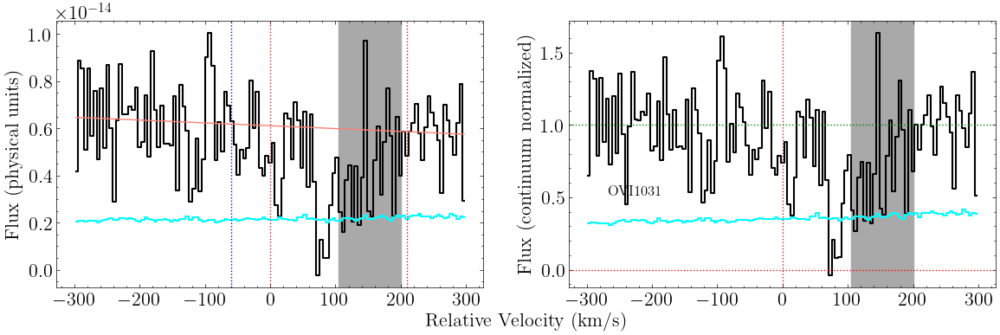

In [282]:
fig, ax = ovi_1031_stis.plot_ion_transition_spec_cont()

In [283]:
ovi_1031_stis.get_EW_total(-40,160)

Integration window: [-40, 160]
EW, 1sig: 200, 38
EW-3sig: 113.665


In [284]:
ovi_1031_stis.grab_ion_transition_lsf(lsf_fits_list)

In [285]:
ovi_1031_stis.init_ion_transition(init_values = [[13.7, 23, 0],
                                                [14.0, 26, 79.3]], 
                             lsf_convolve = True)

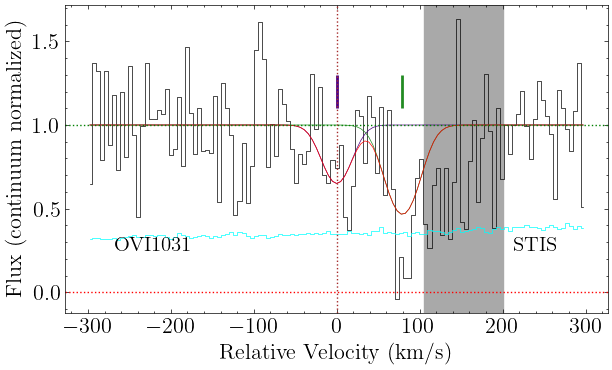

In [286]:
fig, ax = ovi_1031_stis.plot_ion_transition_init_fit(legend=False)

In [287]:
ovi_1031_stis.fit_ion_transition(fix_params_list = ['it1c1_dv_c',
                                                  'it1c2_dv_c'])

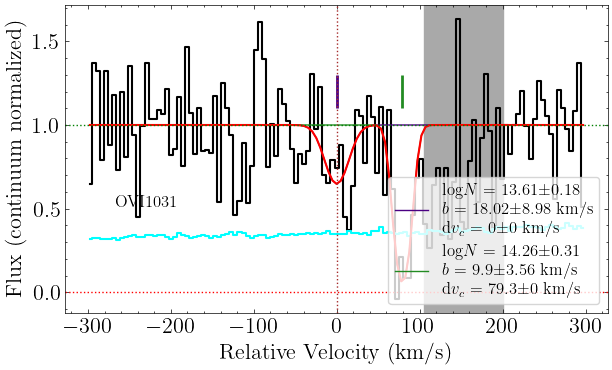

In [288]:
fig, ax = ovi_1031_stis.plot_ion_transition_best_fit()

## OVI 1037

In [289]:
ovi_1037_stis = ion_transition('OVI', 1037, 'O', z_sys, 'STIS')

In [290]:
ovi_1037_stis.grab_ion_transition_info(delta_v=5)

In [291]:
ovi_1037_stis.grab_ion_transition_spec(spec_fits_list)#, masks=[[-25,10]])

In [292]:
ovi_1037_stis.cont_norm_flux(v_abs_range=[-60,160], degree=1)

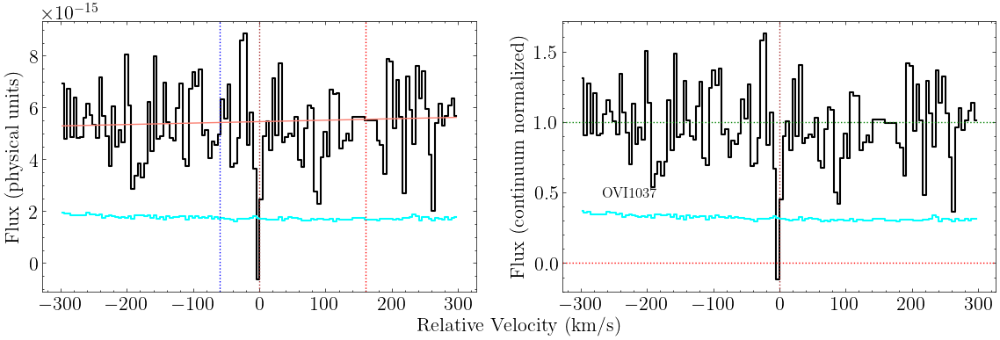

In [293]:
fig, ax = ovi_1037_stis.plot_ion_transition_spec_cont()

In [294]:
ovi_1037_stis.get_EW_total(40,160)

Integration window: [40, 160]
EW, 1sig: 40, 24
EW-3sig: 70.565


In [295]:
ovi_1037_stis.grab_ion_transition_lsf(lsf_fits_list)

In [296]:
ovi_1037_stis.init_ion_transition(init_values = [[13.5, 20., 0],
                                                [14.5, 30, 100]], 
                             lsf_convolve = True)

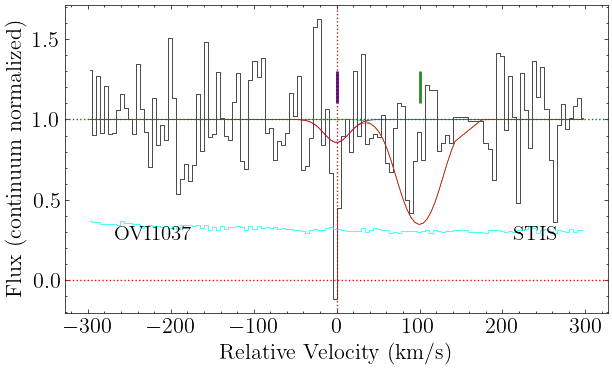

In [297]:
fig, ax = ovi_1037_stis.plot_ion_transition_init_fit(legend=False)

In [298]:
ovi_1037_stis.fit_ion_transition(fix_params_list = ['it1c1_dv_c', 
                                                  'it1c2_dv_c'])

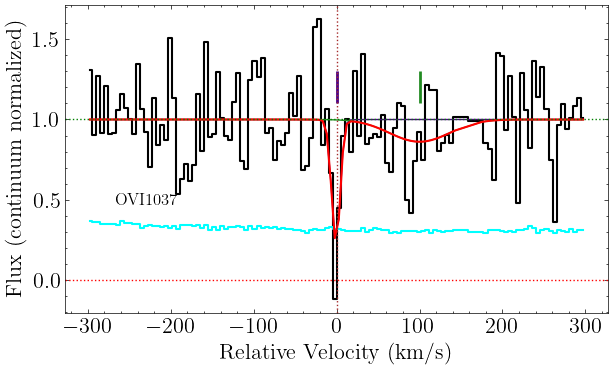

In [299]:
fig, ax = ovi_1037_stis.plot_ion_transition_best_fit(legend=False)

In [300]:
#ovi_1037_stis.result

## OVI ion

In [301]:
ovi = ion(z_sys, 'OVI', [ovi_1031_stis, ovi_1037_stis])

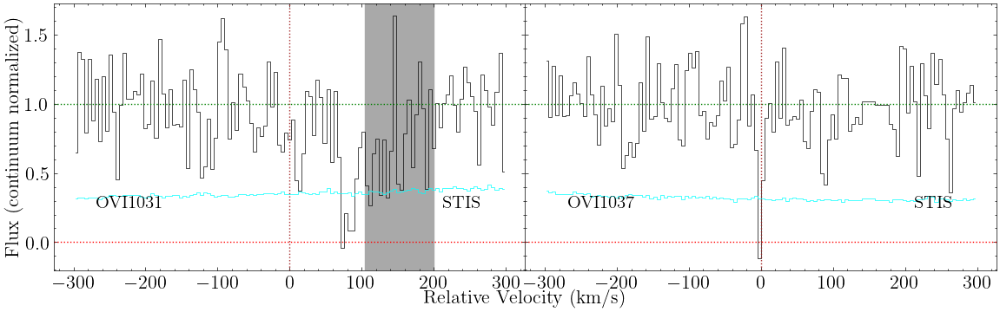

In [302]:
fig, axes = ovi.plot_ion()

In [303]:
ovi.init_ion([[[14.0, 23, 0],[14.0, 19, 80]], 
              [[14.0, 23, 0],[14.0, 19, 80]]])

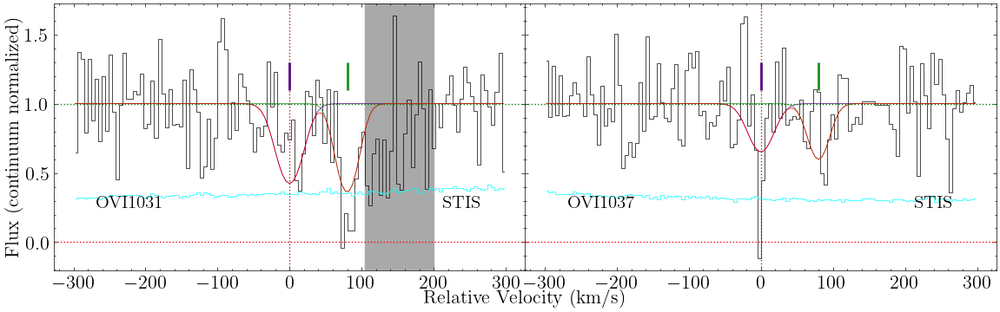

In [304]:
fig, axes = ovi.plot_ion_init_fit(legend=False)

In [305]:
ovi.fit_ion(tie_params_list = [['it1c1_logN', 'it2c1_logN'],
                               ['it1c1_b', 'it2c1_b'],
                               ['it1c1_dv_c', 'it2c1_dv_c'],
                               ['it1c2_logN', 'it2c2_logN'],
                               ['it1c2_b', 'it2c2_b'],
                               ['it1c2_dv_c', 'it2c2_dv_c'],
                              ],
            fix_params_list = ['it1c1_dv_c','it1c2_dv_c',
                               'it1c1_b','it1c2_b'],)
            #lower_bounds_dict = {'it1c1_logN': 0, 'it1c2_logN': 0, 'it1c3_logN': 0, 'it1c4_logN': 0})

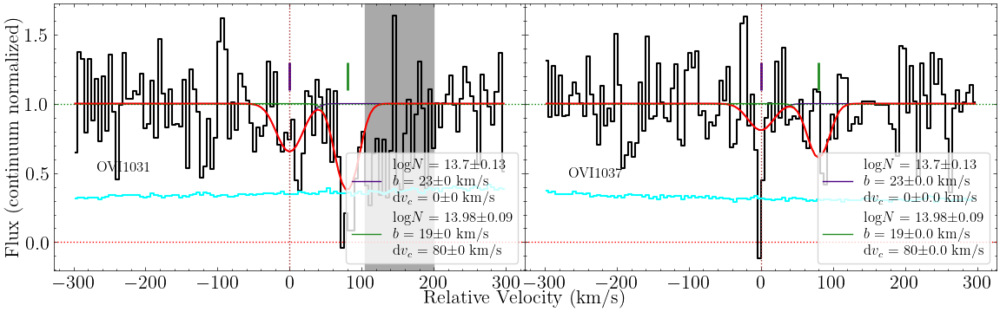

In [306]:
fig, axes = ovi.plot_ion_best_fit(legend=True)

In [307]:
#ovi.fit_ion_emcee(loaddir=rootdir, scale_covar=1e-10, n_walkers=100, n_steps=2500)
#ovi.fit_ion_emcee(load=True, loaddir=rootdir)

In [308]:
#ovi.plot_corner()

In [309]:
#fig, axes = ovi.plot_samples()

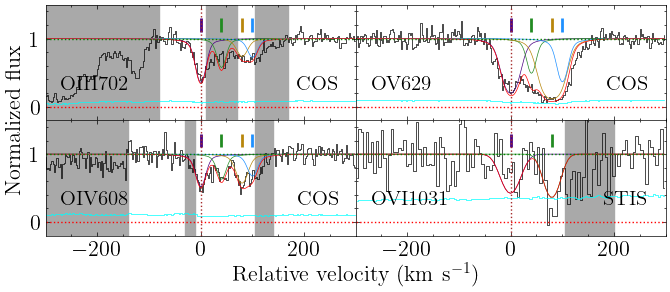

In [310]:
fig, axes = plt.subplots(2, 2, figsize=(4*2,1.5*2), sharex=True, sharey=True)

oiii_702_fuv.plot_ion_transition_init_fit(fig=fig, ax=axes[0,0], legend=False, label_axes=False)
oiv_608_fuv.plot_ion_transition_init_fit(fig=fig, ax=axes[1,0], legend=False, label_axes=False)

ov_629_fuv.plot_ion_transition_init_fit(fig=fig, ax=axes[0,1], legend=False, label_axes=False)
ovi_1031_stis.plot_ion_transition_init_fit(fig=fig, ax=axes[1,1], legend=False, label_axes=False)


axes[0,0].set_xlim(-300,300)
axes[0,0].set_ylim(-0.2,1.5)

plt.subplots_adjust(wspace=0., hspace=0)

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])
ax_label.set_xlabel(r'Relative velocity (km s${}^{-1}$)', labelpad=20) # Use argument `labelpad` to move label downwards.
ax_label.set_ylabel('Normalized flux', labelpad=15)

plt.savefig(rootdir+'Figures/z_104_OIII_OVI.png', dpi=300)

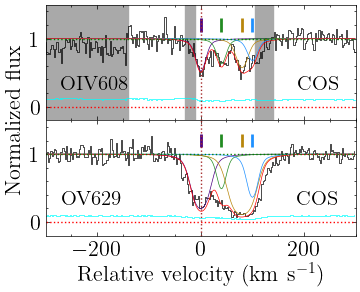

In [311]:
fig, axes = plt.subplots(2, 1, figsize=(4,1.5*2), sharex=True, sharey=True)

oiv_608_fuv.plot_ion_transition_init_fit(fig=fig, ax=axes[0], legend=False, label_axes=False)
ov_629_fuv.plot_ion_transition_init_fit(fig=fig, ax=axes[1], legend=False, label_axes=False)

axes[0].set_xlim(-300,300)
axes[0].set_ylim(-0.2,1.5)

plt.subplots_adjust(wspace=0., hspace=0)

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])
ax_label.set_xlabel(r'Relative velocity (km s${}^{-1}$)', labelpad=20) # Use argument `labelpad` to move label downwards.
ax_label.set_ylabel('Normalized flux', labelpad=15)

plt.savefig(rootdir+'Figures/z_104_OIV_OV.png', dpi=300)

Text(0, 0.5, 'Normalized flux')

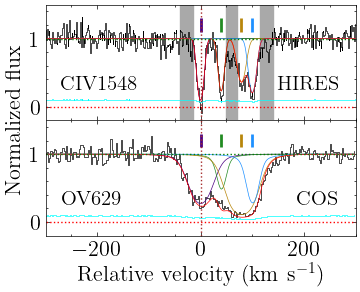

In [334]:
fig, axes = plt.subplots(2, 1, figsize=(4,1.5*2), sharex=True, sharey=True)

civ_1548_hires.plot_ion_transition_init_fit(fig=fig, ax=axes[0], legend=False, label_axes=False)
ov_629_fuv.plot_ion_transition_init_fit(fig=fig, ax=axes[1], legend=False, label_axes=False)

axes[0].set_xlim(-300,300)
axes[0].set_ylim(-0.2,1.5)

plt.subplots_adjust(wspace=0., hspace=0)

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])
ax_label.set_xlabel(r'Relative velocity (km s${}^{-1}$)', labelpad=20) # Use argument `labelpad` to move label downwards.
ax_label.set_ylabel('Normalized flux', labelpad=15)

#plt.savefig(rootdir+'Figures/z_104_CIV_OV.png', dpi=300)

# OV + OVI

In [301]:
ov_ovi = ion_suite(z_sys, 'OV+OVI', [ov, ovi])

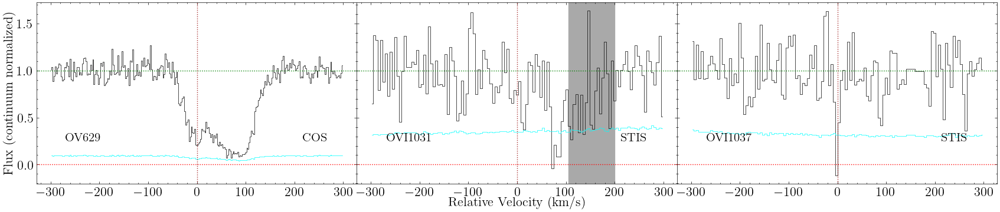

In [302]:
fig, axes = ov_ovi.plot_ion_suite(n_cols=3)

In [303]:
ov_ovi.init_ion_suite([
    [[14.1, 15, 0],[13.5, 10, 40], [14.4, 20, 80],[13.8, 15, 100]], # OV
    [[14.0, 23, 0],[14.0, 19, 80]], # OVI  
    [[14.0, 23, 0],[14.0, 19, 80]],
]
)

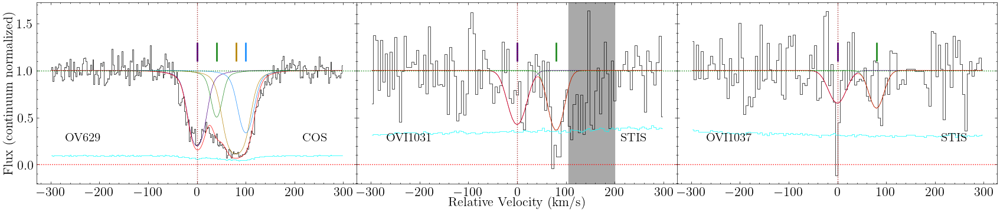

In [304]:
fig, axes = ov_ovi.plot_ion_suite_init_fit(n_cols=3, legend=False)

In [305]:
ov_ovi.fit_ion_suite(tie_params_list = [
                                        ['it2c1_logN', 'it3c1_logN'], # OVI, c1
                                        ['it2c2_logN', 'it3c2_logN'], # OVI, c2
                                        ['it1c1_b', 'it2c1_b'], # OV, c1
                                        ['it1c1_b', 'it3c1_b'], # OVI, c1
                                        ['it1c3_b', 'it2c2_b'], # OV, c3
                                        ['it1c3_b', 'it3c2_b'], # OVI, c2
                                        ['it1c1_dv_c', 'it2c1_dv_c'], # OV, c1
                                        ['it1c1_dv_c', 'it3c1_dv_c'], # OVI, c1
                                        ['it1c3_dv_c', 'it2c2_dv_c'], # OV, c1
                                        ['it1c3_dv_c', 'it3c2_dv_c'], # OVI, c1     
                                         ],
                   fix_params_list = ['it1c1_dv_c', 'it1c2_dv_c', 'it1c3_dv_c', 'it1c4_dv_c'],
                   exclude_models = ['it1c2_logN > it1c4_logN',
                                     'it1c3_b < it1c1_b',
                                     'it1c4_b < it1c2_b'],
                   lower_bounds_dict = {'it1c2_b':3.2})

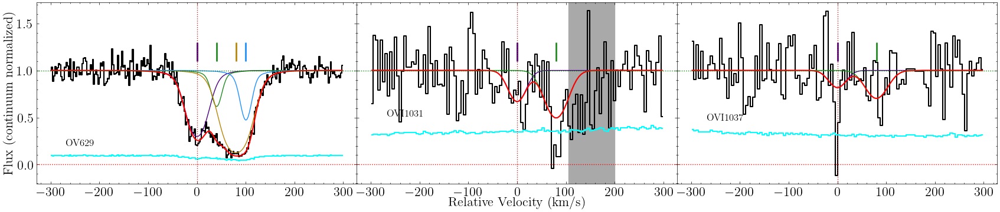

In [306]:
fig, axes = ov_ovi.plot_ion_suite_best_fit(n_cols=3, legend=False)

In [307]:
len(ov_ovi.result.var_names)

10

In [308]:
#ov_ovi.fit_ion_suite_emcee(loaddir=rootdir, n_walkers=200, n_steps=2000, scale_covar=1e-15)
#ov_ovi.fit_ion_suite_emcee(load=True, loaddir=rootdir)

In [309]:
#fig, axes = ov_ovi.plot_samples(n_cols=3)

In [310]:
#ov_ovi.plot_corner()

# NeV

## NeV 568

In [311]:
nev_568_fuv = ion_transition('NeV', 568, 'Ne', z_sys, 'COS FUV')

In [312]:
nev_568_fuv.grab_ion_transition_info(delta_v=-15)

In [313]:
nev_568_fuv.grab_ion_transition_spec(spec_fits_list, masks=[[-300,-250],[-200,5],[100,150],[270,300]])

In [314]:
nev_568_fuv.cont_norm_flux(v_abs_range=[-70,150], degree=1)

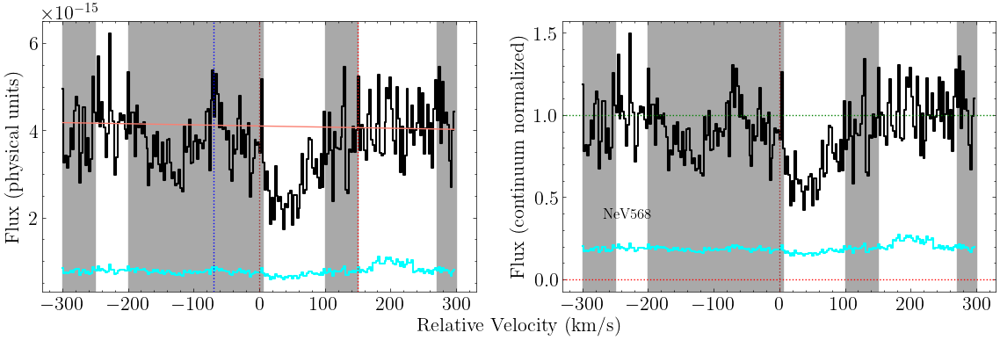

In [315]:
fig, ax = nev_568_fuv.plot_ion_transition_spec_cont()

In [316]:
nev_568_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [317]:
nev_568_fuv.get_EW_total(-80,120)

Integration window: [-80, 120]
EW, 1sig: 70, 8
EW-3sig: 22.580


In [318]:
nev_568_fuv.init_ion_transition(init_values = [[14.4, 15, 40], [14.0, 10, 80]], 
                             lsf_convolve = True)

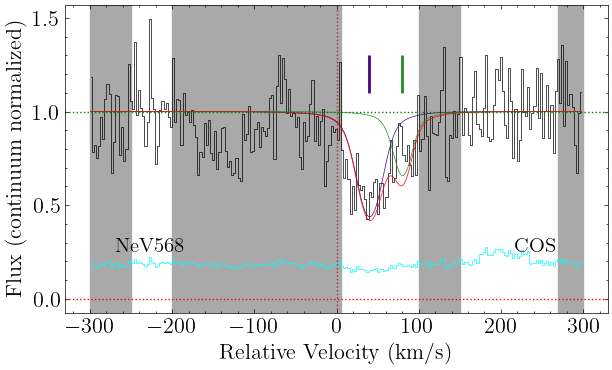

In [319]:
fig, ax = nev_568_fuv.plot_ion_transition_init_fit(legend=False)

In [320]:
nev_568_fuv.fit_ion_transition(fix_params_list=['it1c1_dv_c','it1c2_dv_c'])

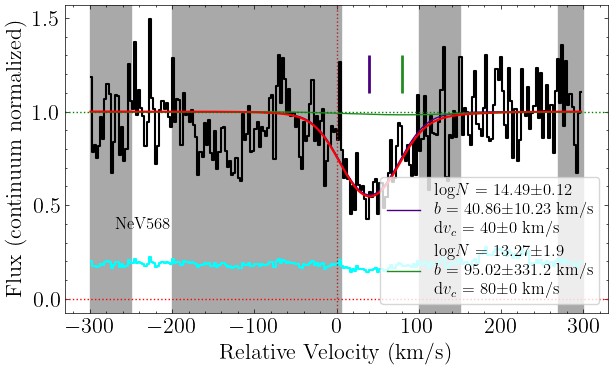

In [321]:
fig, ax = nev_568_fuv.plot_ion_transition_best_fit(legend=True)

## NeV ion

In [322]:
nev = ion(z_sys, 'NeV', [nev_568_fuv])

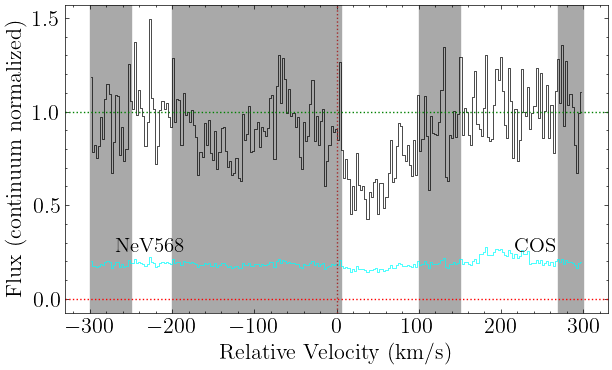

In [323]:
fig, axes = nev.plot_ion()

In [324]:
nev.init_ion([[[14.4, 23, 40],[13.8, 25, 80]]])

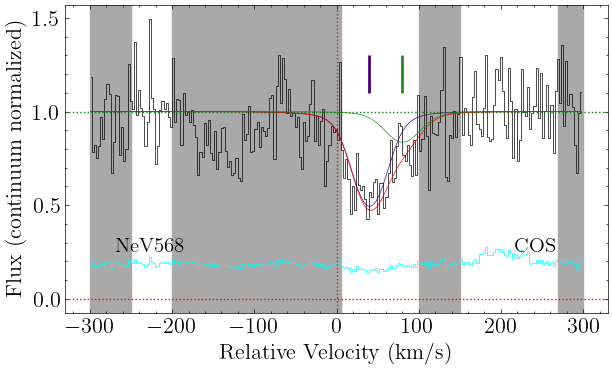

In [325]:
fig, axes = nev.plot_ion_init_fit(legend=False)

In [326]:
nev.fit_ion(fix_params_list=['it1c1_dv_c','it1c2_dv_c'],
           exclude_models=['it1c1_b > it1c2_b'],
           upper_bounds_dict={'it1c2_b':30})

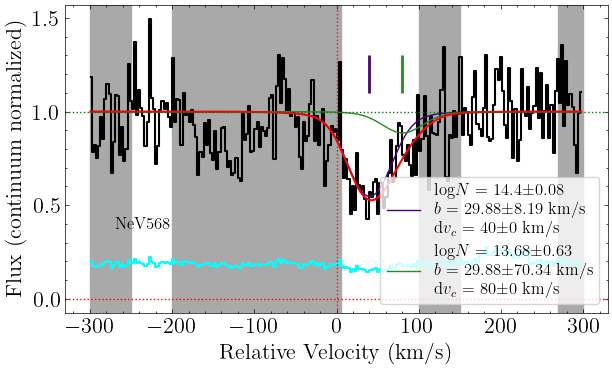

In [327]:
fig, axes = nev.plot_ion_best_fit(legend=True)

In [328]:
#nev.fit_ion_emcee(loaddir=rootdir, scale_covar=1e-7, n_walkers=100, n_steps=2500)
#nev.fit_ion_emcee(load=True, loaddir=rootdir)

In [329]:
#fig, axes = nev.plot_samples()

In [330]:
#nev.plot_corner()

# OV + OVI + NeV

In [331]:
ov_ovi_nev = ion_suite(z_sys, 'OV+OVI+NeV', [ov, ovi, nev])

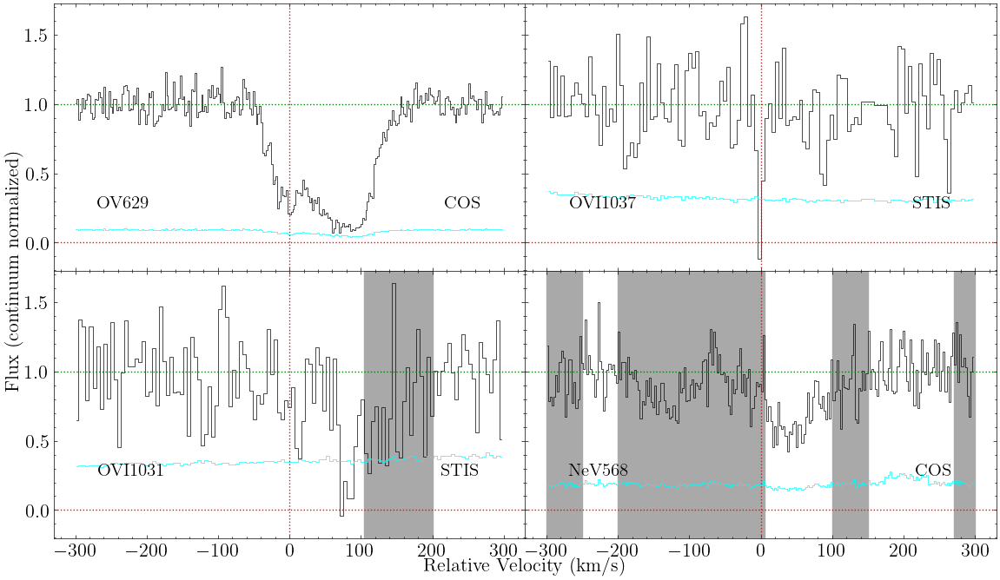

In [332]:
fig, axes = ov_ovi_nev.plot_ion_suite(n_cols=2)

In [333]:
ov_ovi_nev.init_ion_suite([
    [[14.1, 15, 0],[13.5, 10, 40], [14.4, 20, 80],[13.8, 15, 100]], # OV
    [[14.0, 23, 0],[14.0, 20, 80]], # OVI  
    [[14.0, 23, 0],[14.0, 20, 80]],
    [[14.4, 18,40],[14.0, 20, 80]] # NeV
]
)

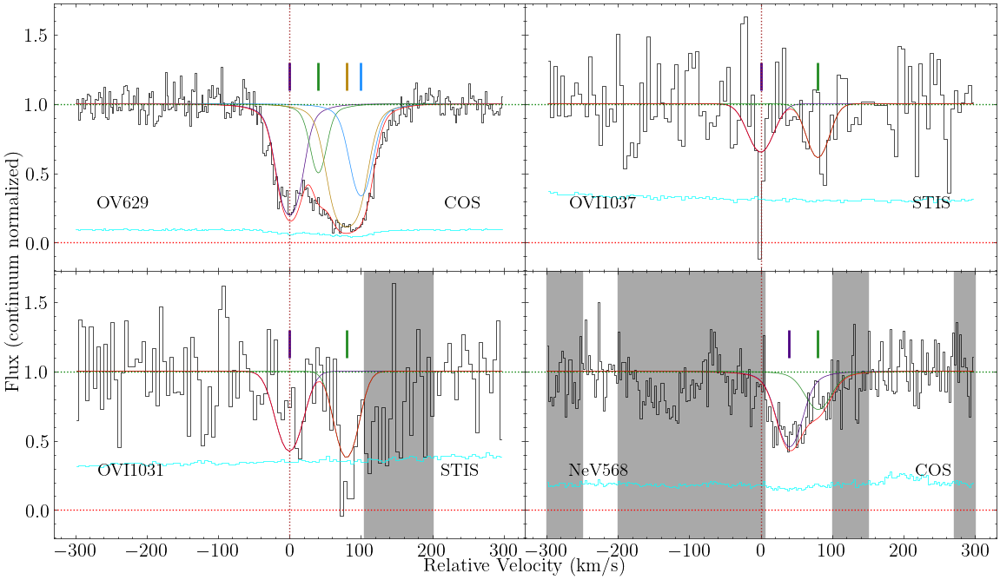

In [334]:
fig, axes = ov_ovi_nev.plot_ion_suite_init_fit(n_cols=2, legend=False)

In [335]:
ov_ovi_nev.fit_ion_suite(tie_params_list = [
                                        ['it2c1_logN', 'it3c1_logN'], # OVI, c1
                                        ['it2c2_logN', 'it3c2_logN'], # OVI, c2
                                        ['it1c1_b', 'it2c1_b'], # OV, c1
                                        ['it1c1_b', 'it3c1_b'], # OVI, c1
                                        ['it1c3_b', 'it2c2_b'], # OV, c3
                                        ['it1c3_b', 'it3c2_b'], # OVI, c2
                                        ['it1c3_b', 'it4c2_b'], # NeV, c2
                                        ['it1c1_dv_c', 'it2c1_dv_c'], # OV, c1
                                        ['it1c1_dv_c', 'it3c1_dv_c'], # OVI, c1
                                        ['it1c2_dv_c', 'it4c1_dv_c'], # OV, c2
                                        ['it1c3_dv_c', 'it2c2_dv_c'], # OV, c3
                                        ['it1c3_dv_c', 'it3c2_dv_c'], # OVI, c2 
                                        ['it1c3_dv_c', 'it4c2_dv_c'], # NeV, c2 
                                         ],
                   fix_params_list = ['it1c1_dv_c', 'it1c2_dv_c', 'it1c3_dv_c', 'it1c4_dv_c'],
                   exclude_models = ['it1c2_logN > it1c4_logN',
                                     'it1c3_b < it1c1_b',
                                     'it1c4_b < it1c2_b',
                                     'it4c1_b > it4c2_b'],
                   lower_bounds_dict = {'it1c2_b':3.2})

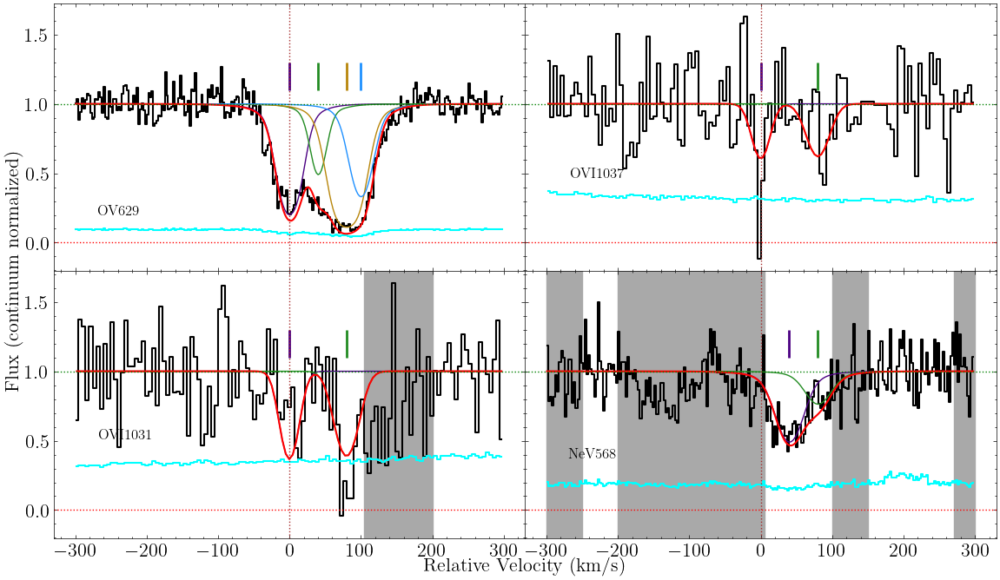

In [336]:
fig, axes = ov_ovi_nev.plot_ion_suite_best_fit(n_cols=2, legend=False)

In [337]:
#ov_ovi_nev.fit_ion_suite_emcee(loaddir=rootdir, n_walkers=200, n_steps=2000, scale_covar=1e-15)
#ov_ovi_nev.fit_ion_suite_emcee(load=True, loaddir=rootdir)

In [338]:
#fig, axes = ov_ovi_nev.plot_samples(n_cols=2)

In [339]:
#ov_ovi_nev.plot_corner()

# HI + HeI + CIII + CIV + NIV + OIII + OIV + OV + OVI

In [340]:
hi_hei_ciii_civ_niv_oiii_oiv_ov_ovi = ion_suite(z_sys, 'HI+HeI+CIII+CIV+NIV+OIII+OIV+OV+OVI', 
                                             [hi, hei, ciii, civ, niv, oiii, oiv, ov, ovi])

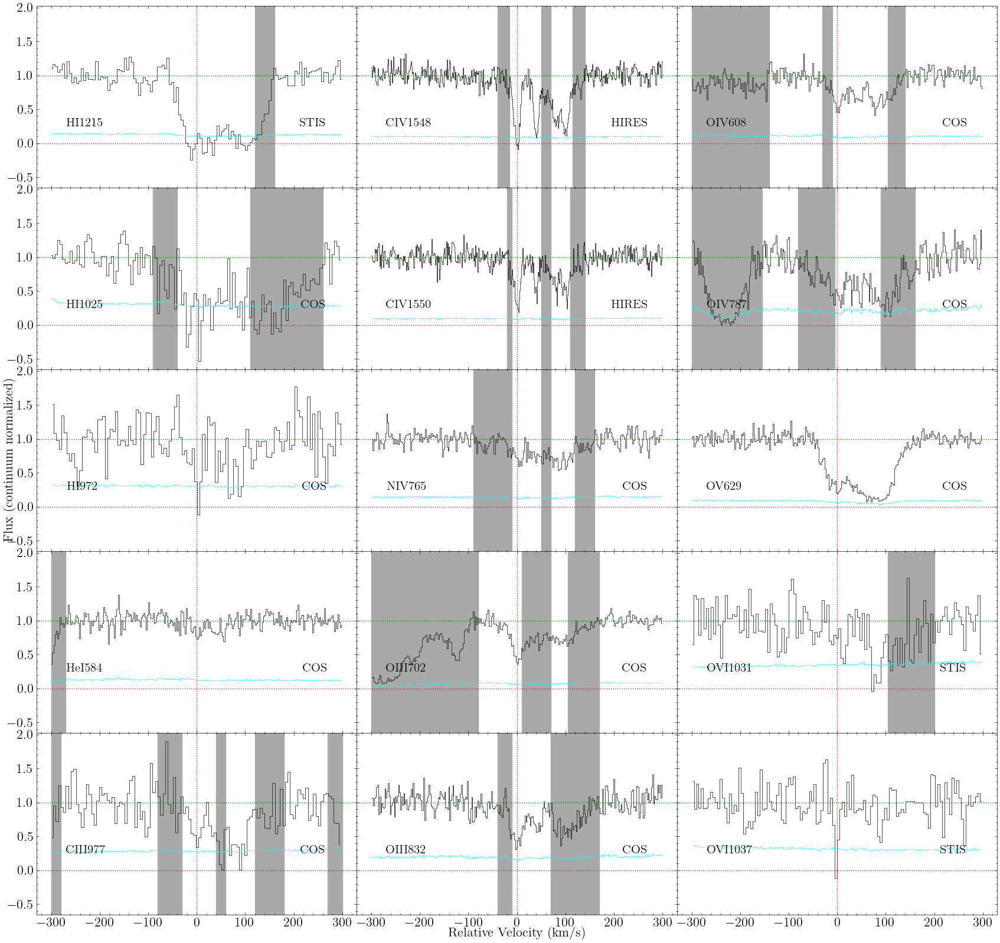

In [341]:
fig, axes = hi_hei_ciii_civ_niv_oiii_oiv_ov_ovi.plot_ion_suite(n_cols=3)

In [342]:
hi_hei_ciii_civ_niv_oiii_oiv_ov_ovi.init_ion_suite([
    [[14.8, 19, 0], [14.0, 10, 40], [14.3, 14, 79.5], [14.5, 21, 100.5]], # HI
    [[14.8, 19, 0], [14.0, 10, 40], [14.3, 14, 79.5], [14.5, 21, 100.5]],
    [[14.8, 19, 0], [14.0, 10, 40], [14.3, 14, 79.5], [14.5, 21, 100.5]],
    [[13.1, 10, 0], [13.1, 8, 40]],
    [[13.8, 6.7, 0], [13.3, 6.3, 40], [13.7, 10, 79.5], [13.2, 8.3, 100.5]], # CIII
    [[13.6, 6.7, 0], [13.4, 6.3, 40], [13.4, 10, 79.5], [13.5, 8.3, 100.5]], # CIV
    [[13.6, 6.7, 0], [13.4, 6.3, 40], [13.4, 10, 79.5], [13.5, 8.3, 100.5]], 
    [[13.0, 6.7, 0], [12.9, 6.3, 40], [13.0, 10, 79.5], [12.9, 8.3, 100.5]], # NIV
    [[14.3, 6.7, 0], [13.9, 6.3, 40], [13.6, 10, 79.5], [13.6, 8.3, 100.5]], # OIII
    [[14.3, 6.7, 0], [13.9, 6.3, 40], [13.6, 10, 79.5], [13.6, 8.3, 100.5]], 
    [[14.5, 6.7, 0], [14.2, 6.3, 40], [14.3, 10, 79.5], [13.9, 8.3, 100.5]], # OIV
    [[14.5, 6.7, 0], [14.2, 6.3, 40], [14.3, 10, 79.5], [13.9, 8.3, 100.5]], 
    [[14.0, 23, 0], [13.6, 6.3, 40], [14.4, 26, 79.5], [13.8, 8.3, 100.5]], # OV
    [[13.8, 23, 0],[14.0, 26, 79.5]], # OVI
    [[13.8, 23, 0],[14.0, 26, 79.5]],
 ])

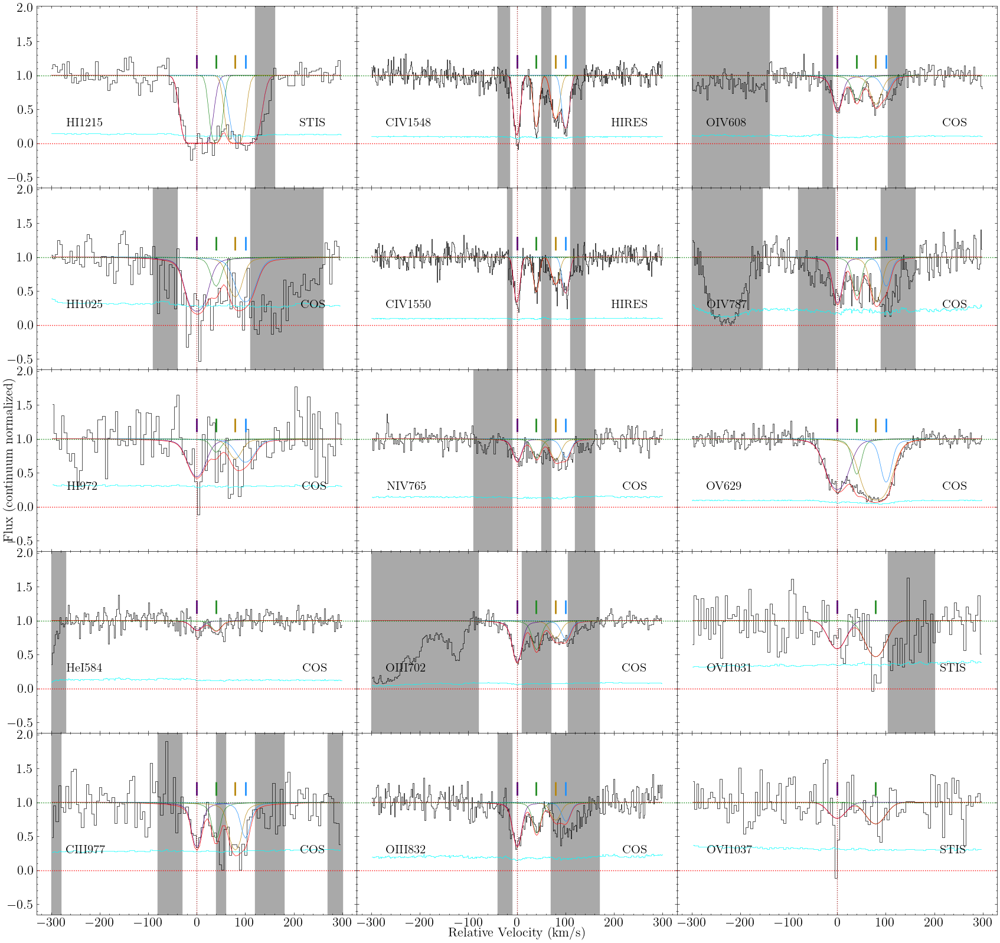

In [343]:
fig, axes = hi_hei_ciii_civ_niv_oiii_oiv_ov_ovi.plot_ion_suite_init_fit(n_cols=3, legend=False)

In [344]:
hi_hei_ciii_civ_niv_oiii_oiv_ov_ovi.fit_ion_suite(tie_params_list = [
    
    ['it1c1_logN', 'it2c1_logN'], # Tie HI logN, c1
    ['it1c1_logN', 'it3c1_logN'],

    ['it1c2_logN', 'it2c2_logN'], # Tie HI logN, c2
    ['it1c2_logN', 'it3c2_logN'],

    ['it1c3_logN', 'it2c3_logN'], # Tie HI logN, c3
    ['it1c3_logN', 'it3c3_logN'],

    ['it1c4_logN', 'it2c4_logN'], # Tie HI logN, c4
    ['it1c4_logN', 'it3c4_logN'],
    
    ['it1c1_b', 'it2c1_b'], # Tie HI b, c1
    ['it1c1_b', 'it3c1_b'], 

    ['it1c2_b', 'it2c2_b'], # Tie HI b, c2
    ['it1c2_b', 'it3c2_b'], 

    ['it1c3_b', 'it2c3_b'], # Tie HI b, c3
    ['it1c3_b', 'it3c3_b'],

    ['it1c4_b', 'it2c4_b'], # Tie HI b, c4    
    ['it1c4_b', 'it3c4_b'], 

    ['it6c1_logN', 'it7c1_logN'], # Tie CIV logN, c1
    ['it6c2_logN', 'it7c2_logN'], # Tie CIV logN, c2
    ['it6c3_logN', 'it7c3_logN'], # Tie CIV logN, c3
    ['it6c4_logN', 'it7c4_logN'], # Tie CIV logN, c4
    
    ['it9c1_logN', 'it10c1_logN'], # Tie OIII logN, c1
    ['it9c2_logN', 'it10c2_logN'], # Tie OIII logN, c2
    ['it9c3_logN', 'it10c3_logN'], # Tie OIII logN, c3
    ['it9c4_logN', 'it10c4_logN'], # Tie OIII logN, c4
    
    ['it11c1_logN', 'it12c1_logN'], # Tie OIV logN, c1
    ['it11c2_logN', 'it12c2_logN'], # Tie OIV logN, c2
    ['it11c3_logN', 'it12c3_logN'], # Tie OIV logN, c3
    ['it11c4_logN', 'it12c4_logN'], # Tie OIV logN, c4    
    
    ['it14c1_logN', 'it15c1_logN'], # Tie OVI logN, c1  
    ['it14c2_logN', 'it15c2_logN'], # Tie OVI logN, c2      
    
    ['it5c1_b', 'it6c1_b'], # Tie CIII b, c1
    ['it5c1_b', 'it7c1_b'], # Tie CIV b, c1
    ['it5c1_b', 'it8c1_b'], # Tie NIV b, c1
    ['it5c1_b', 'it9c1_b'], # Tie OIII b, c1
    ['it5c1_b', 'it10c1_b'],
    ['it5c1_b', 'it11c1_b'], # Tie OIV b, c1
    ['it5c1_b', 'it12c1_b'],

    ['it5c2_b', 'it6c2_b'], # Tie CIII b, c2
    ['it5c2_b', 'it7c2_b'], # Tie CIV b, c2
    ['it5c2_b', 'it8c2_b'], # Tie NIV b, c2
    ['it5c2_b', 'it9c2_b'], # Tie OIII b, c2
    ['it5c2_b', 'it10c2_b'],
    ['it5c2_b', 'it11c2_b'], # Tie OIV b, c2
    ['it5c2_b', 'it12c2_b'],
    ['it5c2_b', 'it13c2_b'], # Tie OV b, c2

    ['it5c3_b', 'it6c3_b'], # Tie CIII b, c3
    ['it5c3_b', 'it7c3_b'], # Tie CIV b, c3
    ['it5c3_b', 'it8c3_b'], # Tie NIV b, c3
    ['it5c3_b', 'it9c3_b'], # Tie OIII b, c3
    ['it5c3_b', 'it10c3_b'],
    ['it5c3_b', 'it11c3_b'], # Tie OIV b, c3
    ['it5c3_b', 'it12c3_b'],
    
    ['it5c4_b', 'it6c4_b'], # Tie CIII b, c4
    ['it5c4_b', 'it7c4_b'], # Tie CIV b, c4
    ['it5c4_b', 'it8c4_b'], # Tie NIV b, c4
    ['it5c4_b', 'it9c4_b'], # Tie OIII b, c4
    ['it5c4_b', 'it10c4_b'],
    ['it5c4_b', 'it11c4_b'], # Tie OIV b, c4
    ['it5c4_b', 'it12c4_b'],
    ['it5c4_b', 'it13c4_b'], # Tie OV b, c4

    ['it13c1_b', 'it14c1_b'], # Tie OV b, c1
    ['it13c1_b', 'it15c1_b'], # Tie OVI b, c1   
        
    ['it13c3_b', 'it14c2_b'], # Tie OV b, c3
    ['it13c3_b', 'it15c2_b'], # Tie OVI b, c2
  
    ['it1c1_dv_c', 'it2c1_dv_c'], # Tie c1, dv_c, HI
    ['it1c1_dv_c', 'it3c1_dv_c'],
    ['it1c1_dv_c', 'it4c1_dv_c'], # HeI
    ['it1c1_dv_c', 'it5c1_dv_c'], # CIII
    ['it1c1_dv_c', 'it6c1_dv_c'], # CIV
    ['it1c1_dv_c', 'it7c1_dv_c'], 
    ['it1c1_dv_c', 'it8c1_dv_c'], # NIV
    ['it1c1_dv_c', 'it9c1_dv_c'], # OIII
    ['it1c1_dv_c', 'it10c1_dv_c'],
    ['it1c1_dv_c', 'it11c1_dv_c'], # OIV
    ['it1c1_dv_c', 'it12c1_dv_c'],
    ['it1c1_dv_c', 'it13c1_dv_c'], # OV
    ['it1c1_dv_c', 'it14c1_dv_c'], # OVI
    ['it1c1_dv_c', 'it15c1_dv_c'], 
    
    ['it1c2_dv_c', 'it2c2_dv_c'], # Tie c2, dv_c, HI
    ['it1c2_dv_c', 'it3c2_dv_c'],
    ['it1c2_dv_c', 'it4c2_dv_c'], # HeI
    ['it1c2_dv_c', 'it5c2_dv_c'], # CIII
    ['it1c2_dv_c', 'it6c2_dv_c'], # CIV
    ['it1c2_dv_c', 'it7c2_dv_c'],
    ['it1c2_dv_c', 'it8c2_dv_c'], # NIV
    ['it1c2_dv_c', 'it9c2_dv_c'], # OIII
    ['it1c2_dv_c', 'it10c2_dv_c'],
    ['it1c2_dv_c', 'it11c2_dv_c'], # OIV
    ['it1c2_dv_c', 'it12c2_dv_c'],
    ['it1c2_dv_c', 'it13c2_dv_c'], # OV
    
    ['it1c3_dv_c', 'it2c3_dv_c'], # Tie c3, dv_c, HI
    ['it1c3_dv_c', 'it3c3_dv_c'],
    ['it1c3_dv_c', 'it5c3_dv_c'], #  CIII
    ['it1c3_dv_c', 'it6c3_dv_c'], # CIV
    ['it1c3_dv_c', 'it7c3_dv_c'],
    ['it1c3_dv_c', 'it8c3_dv_c'], # NIV
    ['it1c3_dv_c', 'it9c3_dv_c'], # OIII
    ['it1c3_dv_c', 'it10c3_dv_c'],
    ['it1c3_dv_c', 'it11c3_dv_c'], # OIV
    ['it1c3_dv_c', 'it12c3_dv_c'],  
    ['it1c3_dv_c', 'it13c3_dv_c'], # OV
    ['it1c3_dv_c', 'it14c2_dv_c'], # OVI
    ['it1c3_dv_c', 'it15c2_dv_c'],
    
    ['it1c4_dv_c', 'it2c4_dv_c'], # Tie c4, dv_c, HI
    ['it1c4_dv_c', 'it3c4_dv_c'],
    ['it1c4_dv_c', 'it5c4_dv_c'], # CIII
    ['it1c4_dv_c', 'it6c4_dv_c'], # CIV
    ['it1c4_dv_c', 'it7c4_dv_c'],
    ['it1c4_dv_c', 'it8c4_dv_c'], # NIV
    ['it1c4_dv_c', 'it9c4_dv_c'], # OIII
    ['it1c4_dv_c', 'it10c4_dv_c'],
    ['it1c4_dv_c', 'it11c4_dv_c'], # OIV
    ['it1c4_dv_c', 'it12c4_dv_c'],
    ['it1c4_dv_c', 'it13c4_dv_c'], # OV

    ],
    
    exclude_models=['it1c3_logN < it1c2_logN', # HI, don't make c3 disappear
                    'it1c4_logN < it1c3_logN', # HI, don't make c3 the strongest
                    'it1c3_b < it1c2_b', # HI, don't make c3 narrower than CIV c3
                    'it1c4_b < it1c3_b', # HI, don't make c3 too broad
                    'it5c1_logN > it1c1_logN', # CIII weaker than HI, c1
                    'it5c2_logN > it1c2_logN', # CIII weaker than HI, c2
                    'it5c3_logN > it1c3_logN', # CIII weaker than HI, c3
                    'it5c4_logN > it1c4_logN', # CIII weaker than HI, c4
                    'it5c1_logN < it5c2_logN', # CIII c1 stronger than c2
                    'it5c3_logN < it5c4_logN', # CIII c3 stronger than c4
                    'it6c3_logN > it6c4_logN', # CIV, keep c3 weaker than c4
                    'it13c2_logN > it13c4_logN', # OV, make c4 stronger
                    'it4c1_b > it1c1_b', # HeI narrower than HI
                    'it4c2_b > it1c2_b',
                    'it4c1_b > it5c1_b 1.73', # HeI narrower than thermal limit using CIV
                    'it4c2_b > it5c2_b 1.73',
                    'it4c1_b < it5c1_b', # HeI broader than metals
                    'it4c2_b < it5c2_b',
                    'it4c1_b < it1c1_b 0.50', # HeI broader than thermal limit using HI
                    'it4c2_b < it1c2_b 0.50',
                   ],
    lower_bounds_dict = {'it1c1_b':12})

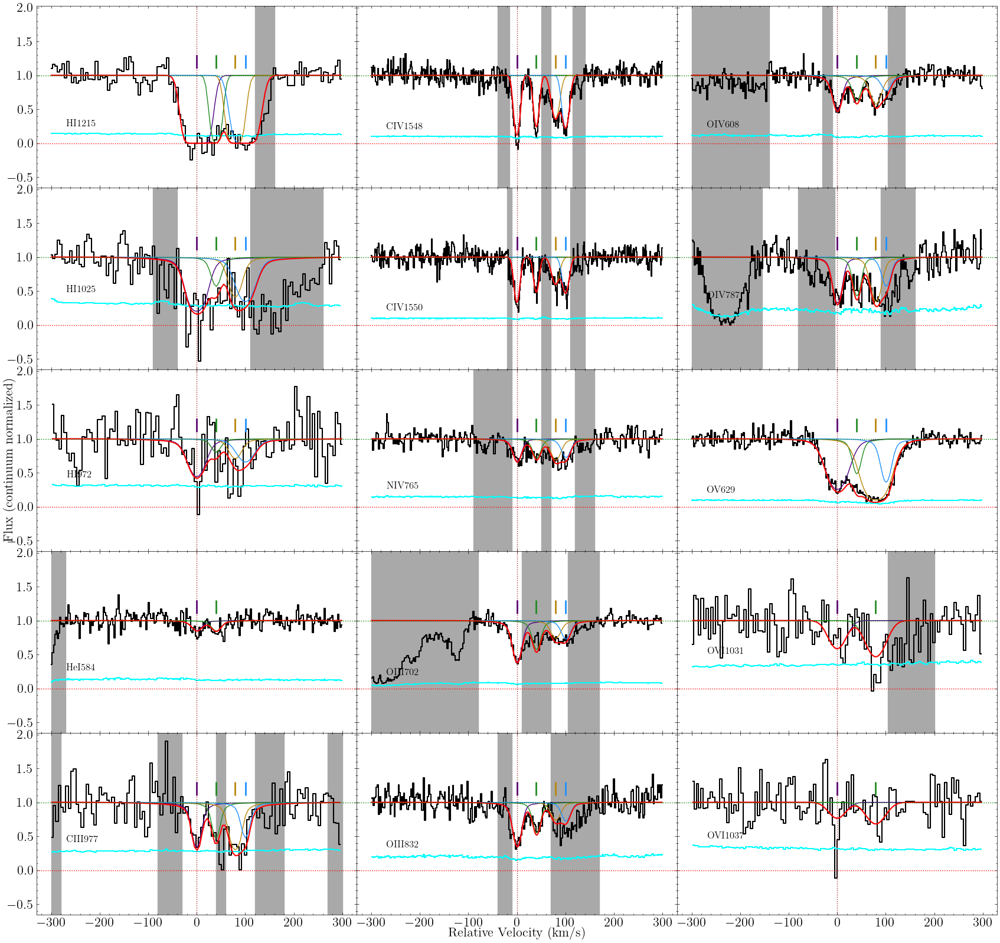

In [345]:
fig, axes = hi_hei_ciii_civ_niv_oiii_oiv_ov_ovi.plot_ion_suite_best_fit(n_cols=3, legend=False)

In [346]:
#hi_hei_ciii_civ_niv_oiii_oiv_ov_ovi.result

In [347]:
len(hi_hei_ciii_civ_niv_oiii_oiv_ov_ovi.result.var_names)

48

In [349]:
#hi_hei_ciii_civ_niv_oiii_oiv_ov_ovi.result

In [350]:
#hi_hei_ciii_civ_niv_oiii_oiv_ov_ovi.result.var_names

In [351]:
hi_hei_ciii_civ_niv_oiii_oiv_ov_ovi.fit_ion_suite_emcee(loaddir=rootdir, n_walkers=200, n_steps=5000, scale_covar=1e-20)
#hi_hei_ciii_civ_niv_oiii_oiv_ov_ovi.fit_ion_suite_emcee(load=True, loaddir=rootdir)

100%|█████████████████████████████████████| 5000/5000 [7:22:19<00:00,  5.31s/it]


The chain is shorter than 50 times the integrated autocorrelation time for 48 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 100;
tau: [577.4457011  552.813265   458.00972319 500.10478178 456.12519413
 458.29234563 469.45034958 450.54009655 494.23391987 481.93061831
 475.31118684 470.1831778  502.98218764 459.57922445 468.35193855
 474.61809524 529.86128228 604.01767892 478.18807059 504.55304854
 498.84941262 454.91098916 476.21304117 456.60146782 650.76004511
 473.47208247 475.21695683 514.76108015 464.57838779 451.71509832
 456.45344002 467.12375178 578.83133579 456.75525912 476.37413552
 438.516823   435.91114529 469.08088653 449.93688053 458.95205129
 596.82341737 454.89555394 480.02170861 540.87834815 514.49562299
 472.71913343 523.84972959 465.11350936]


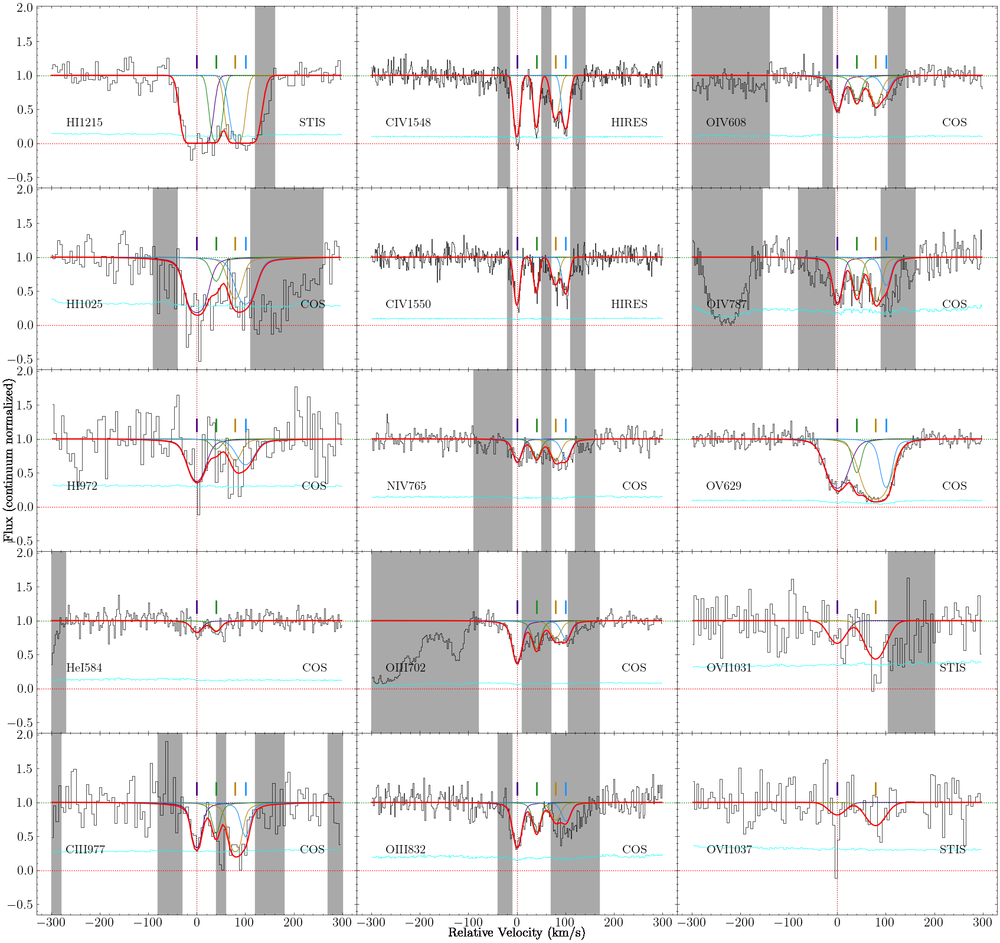

In [352]:
fig, axes = hi_hei_ciii_civ_niv_oiii_oiv_ov_ovi.plot_samples(n_cols=3)

In [363]:
#hi_hei_ciii_civ_niv_oiii_oiv_ov_ovi.plot_corner()

In [364]:
np.median(hi_hei_ciii_civ_niv_oiii_oiv_ov_ovi.result_emcee.flatchain['it1c4_logN'])

14.553579228781963

In [373]:
np.percentile(hi_hei_ciii_civ_niv_oiii_oiv_ov_ovi.result_emcee.flatchain['it1c4_logN'], 100*cdf_1sig)-np.median(hi_hei_ciii_civ_niv_oiii_oiv_ov_ovi.result_emcee.flatchain['it1c4_logN'])

0.1537734144544416

In [374]:
np.percentile(hi_hei_ciii_civ_niv_oiii_oiv_ov_ovi.result_emcee.flatchain['it4c2_logN'], 100*cdf_1sig)-np.median(hi_hei_ciii_civ_niv_oiii_oiv_ov_ovi.result_emcee.flatchain['it4c2_logN'])

0.14607259916951598

In [376]:
np.percentile(hi_hei_ciii_civ_niv_oiii_oiv_ov_ovi.result_emcee.flatchain['it13c2_logN'], 100*cdf_1sig)-np.median(hi_hei_ciii_civ_niv_oiii_oiv_ov_ovi.result_emcee.flatchain['it13c2_logN'])

0.15447883048361888

In [378]:
np.percentile(hi_hei_ciii_civ_niv_oiii_oiv_ov_ovi.result_emcee.flatchain['it14c1_logN'], 100*cdf_1sig)-np.median(hi_hei_ciii_civ_niv_oiii_oiv_ov_ovi.result_emcee.flatchain['it14c1_logN'])

0.154662573130933

In [379]:
np.median(hi_hei_ciii_civ_niv_oiii_oiv_ov_ovi.result_emcee.flatchain['it14c2_logN'])

14.048540566516628

# Summary List

In [359]:
summary = ion_summary([hi_hei_ciii_civ_niv_oiii_oiv_ov_ovi])

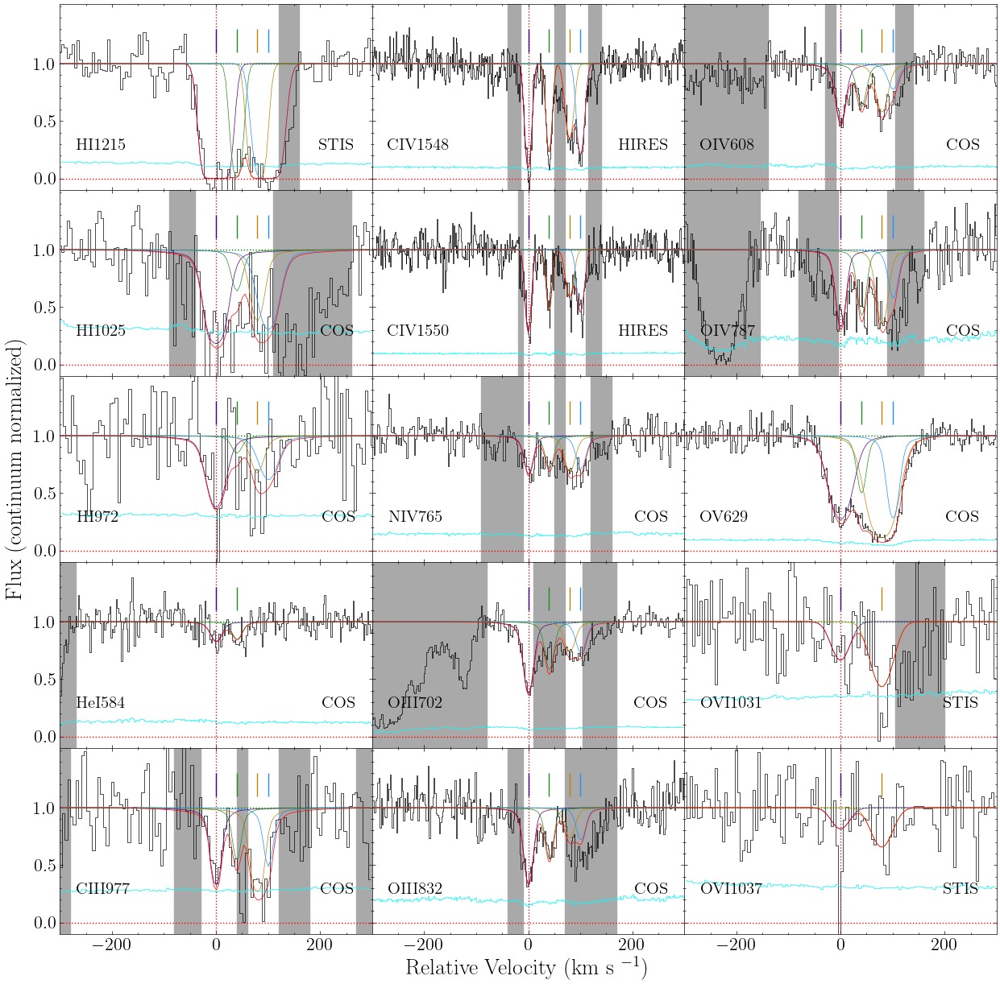

In [360]:
fig, axes = plt.subplots(5, 3, figsize=(5*3, 3*5), sharex=True, sharey=True)

summary.plot_samples(fig=fig, axes=axes, n_cols=3)

axes[0,0].set_ylim(-0.1,1.52)
axes[0,0].set_xlim(-299.9,299.9)
axes[0,0].set_yticks([0,0.5,1])

#axes[4,2].axis('off')
#axes[3,2].xaxis.set_tick_params(which='both', labelbottom=True)
#axes[3,2].set_xticks([-200,-100,0,100,200])

#plt.savefig(rootdir+'Ions/z={}/z={}_vp.pdf'.format(str(z_sys), str(z_sys).replace('.', '_')), dpi=300)

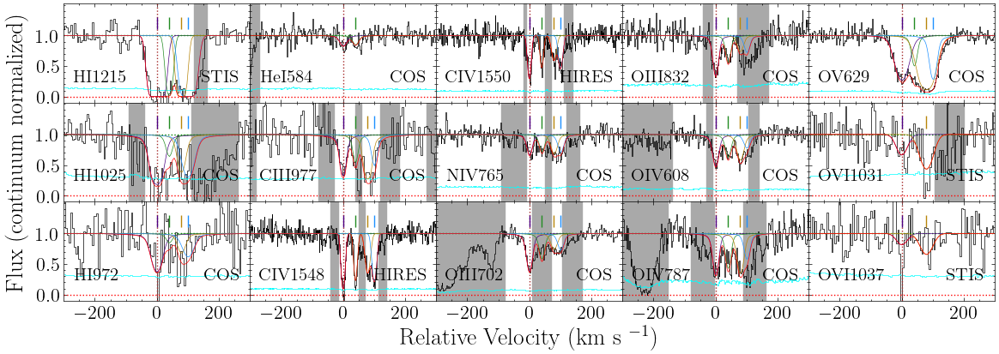

In [361]:
fig, axes = plt.subplots(3, 5, figsize=(5*2.8, 3*1.5), sharex=True, sharey=True)

summary.plot_samples(fig=fig, axes=axes, n_cols=5)

axes[0,0].set_ylim(-0.1,1.52)
axes[0,0].set_xlim(-299.9,299.9)
axes[0,0].set_yticks([0,0.5,1])

plt.savefig(rootdir+'Ions/z={}/z={}_vp_alt.pdf'.format(str(z_sys), str(z_sys).replace('.', '_')), dpi=300)

In [362]:
summary.print_summary()

HI1215
dv_c = -0.0 \pm 0.2, logN = 14.90 \pm 0.20, b = 18.3_{-1.6}^{+1.3}
dv_c = 40.1 \pm 0.3, logN = 13.88 \pm 0.21, b = 10.5_{-2.1}^{+1.8}
dv_c = 79.3 \pm 0.7, logN = 14.34 \pm 0.17, b = 13.2_{-2.0}^{+2.9}
dv_c = 100.5 \pm 0.5, logN = 14.55 \pm 0.15, b = 20.3_{-5.0}^{+6.0}
HI1025
dv_c = -0.0 \pm 0.2, logN = 14.90 \pm 0.20, b = 18.3_{-1.6}^{+1.3}
dv_c = 40.1 \pm 0.3, logN = 13.88 \pm 0.21, b = 10.5_{-2.1}^{+1.8}
dv_c = 79.3 \pm 0.7, logN = 14.34 \pm 0.17, b = 13.2_{-2.0}^{+2.9}
dv_c = 100.5 \pm 0.5, logN = 14.55 \pm 0.15, b = 20.3_{-5.0}^{+6.0}
HI972
dv_c = -0.0 \pm 0.2, logN = 14.90 \pm 0.20, b = 18.3_{-1.6}^{+1.3}
dv_c = 40.1 \pm 0.3, logN = 13.88 \pm 0.21, b = 10.5_{-2.1}^{+1.8}
dv_c = 79.3 \pm 0.7, logN = 14.34 \pm 0.17, b = 13.2_{-2.0}^{+2.9}
dv_c = 100.5 \pm 0.5, logN = 14.55 \pm 0.15, b = 20.3_{-5.0}^{+6.0}
HeI584
dv_c = -0.0 \pm 0.2, logN = 13.19 \pm 0.14, b = 9.7_{-0.7}^{+0.8}
dv_c = 40.1 \pm 0.3, logN = 13.10 \pm 0.16, b = 7.7_{-1.3}^{+2.1}
CIII977
dv_c = -0.0 \pm 0.2, logN 

# CII

## CII 1334 (STIS)

In [518]:
cii_1334_stis = ion_transition('CII', 1334, 'C', z_sys, 'STIS')

In [519]:
cii_1334_stis.grab_ion_transition_info()

In [520]:
cii_1334_stis.grab_ion_transition_spec(spec_fits_list)

In [521]:
cii_1334_stis.cont_norm_flux(v_abs_range=[-70,180], degree=1)

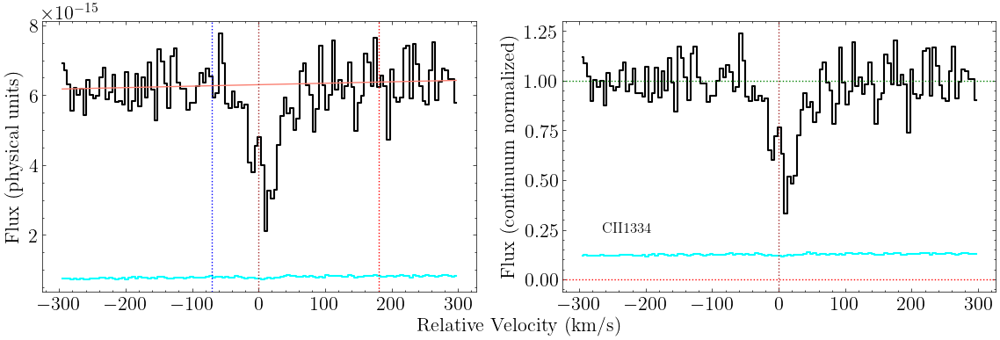

In [522]:
fig, ax = cii_1334_stis.plot_ion_transition_spec_cont()

In [523]:
cii_1334_stis.grab_ion_transition_lsf(lsf_fits_list)

In [524]:
cii_1334_stis.get_upper_lim(10)

logN-1sig: 12.6
logN-2sig: 12.9
logN-3sig: 13.0


In [525]:
cii_1334_stis.get_upper_lim_data(10, 0)

logN-1sig: 13.6
logN-2sig: 13.7
logN-3sig: 13.8


## CII 1036 (STIS)

In [526]:
cii_1036_stis = ion_transition('CII', 1036, 'C', z_sys, 'STIS')

In [527]:
cii_1036_stis.grab_ion_transition_info()

In [528]:
cii_1036_stis.grab_ion_transition_spec(spec_fits_list)

In [529]:
cii_1036_stis.cont_norm_flux(v_abs_range=[-70,180], degree=1)

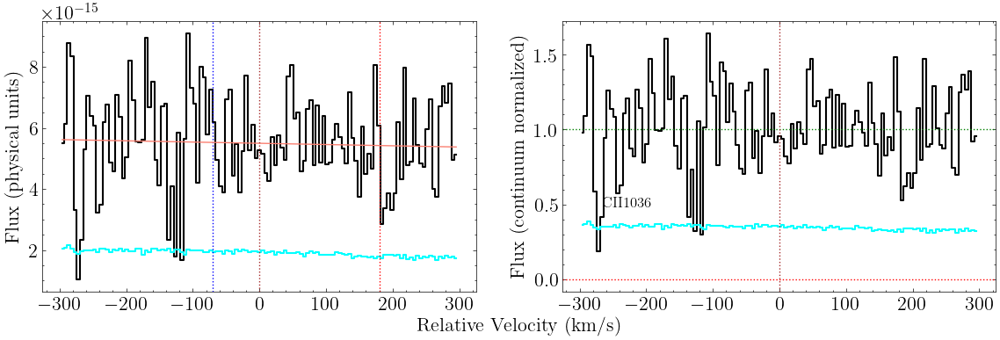

In [530]:
fig, ax = cii_1036_stis.plot_ion_transition_spec_cont()

In [531]:
cii_1036_stis.grab_ion_transition_lsf(lsf_fits_list)

In [532]:
cii_1036_stis.get_upper_lim(10)

logN-1sig: 13.3
logN-2sig: 13.6
logN-3sig: 13.8


In [533]:
cii_1036_stis.get_upper_lim_data(10, 0, -50, 50)

logN-1sig: 13.4
logN-2sig: 13.7
logN-3sig: 13.9


# NV

## NV 1238 (STIS)

In [534]:
nv_1238_stis = ion_transition('NV', 1238, 'N', z_sys, 'STIS')

In [535]:
nv_1238_stis.grab_ion_transition_info()

In [536]:
nv_1238_stis.grab_ion_transition_spec(spec_fits_list, masks=[[180,300]])

In [537]:
nv_1238_stis.cont_norm_flux(v_abs_range=[-70,155], degree=1)

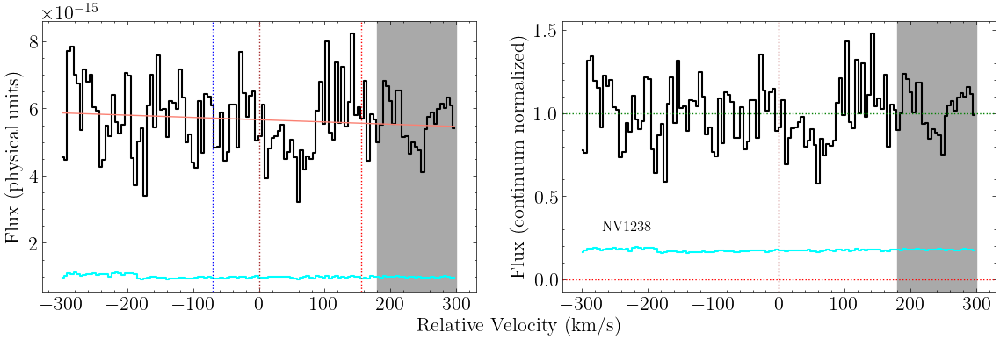

In [538]:
fig, ax = nv_1238_stis.plot_ion_transition_spec_cont()

In [539]:
nv_1238_stis.grab_ion_transition_lsf(lsf_fits_list)

In [540]:
nv_1238_stis.get_upper_lim(20)

logN-1sig: 12.9
logN-2sig: 13.1
logN-3sig: 13.3


In [541]:
nv_1238_stis.get_upper_lim_data(20, -50, -100, 0)

logN-1sig: 13.0
logN-2sig: 13.2
logN-3sig: 13.3


## NV 1242 (STIS)

In [542]:
nv_1242_stis = ion_transition('NV', 1242, 'N', z_sys, 'STIS')

In [543]:
nv_1242_stis.grab_ion_transition_info()

In [544]:
nv_1242_stis.grab_ion_transition_spec(spec_fits_list, masks=[[180,300]])

In [545]:
nv_1242_stis.cont_norm_flux(v_abs_range=[-70,155], degree=1)

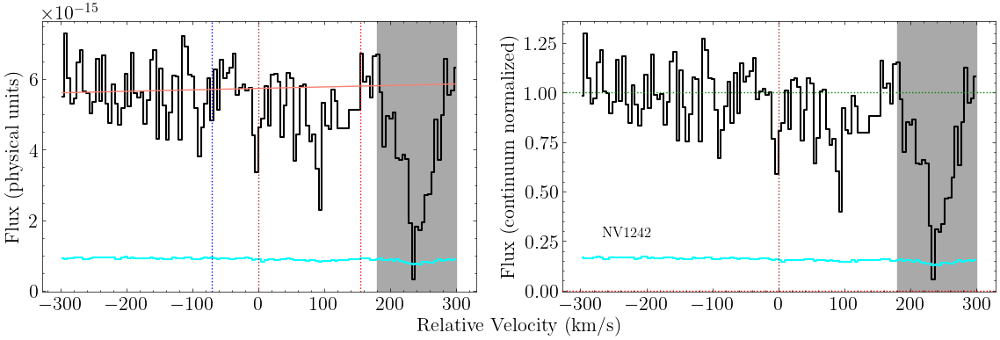

In [546]:
fig, ax = nv_1242_stis.plot_ion_transition_spec_cont()

In [547]:
nv_1242_stis.grab_ion_transition_lsf(lsf_fits_list)

In [548]:
nv_1242_stis.get_upper_lim(20)

logN-1sig: 13.1
logN-2sig: 13.3
logN-3sig: 13.5


In [549]:
nv_1242_stis.get_upper_lim_data(20, -50, -100, 0)

logN-1sig: 13.0
logN-2sig: 13.2
logN-3sig: 13.4


# OVI (re-c2,c4: upper limits)

## OVI 1031

In [550]:
ovi_1031_stis = ion_transition('OVI', 1031, 'O', z_sys, 'STIS')

In [551]:
ovi_1031_stis.grab_ion_transition_info()

In [552]:
ovi_1031_stis.grab_ion_transition_spec(spec_fits_list, masks=[[-20,25],[140,200]])

In [553]:
ovi_1031_stis.cont_norm_flux(v_abs_range=[-60,210], degree=1)

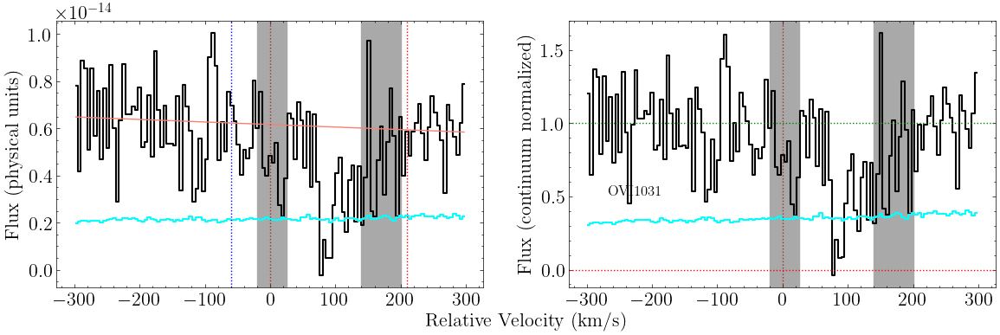

In [554]:
fig, ax = ovi_1031_stis.plot_ion_transition_spec_cont()

In [555]:
ovi_1031_stis.grab_ion_transition_lsf(lsf_fits_list)

In [556]:
ovi_1031_stis.get_upper_lim(20)

logN-1sig: 13.4
logN-2sig: 13.6
logN-3sig: 13.8


In [557]:
ovi_1031_stis.get_upper_lim_data(20, -100, -200, 0)

logN-1sig: 13.5
logN-2sig: 13.7
logN-3sig: 13.9


## OVI 1037

In [558]:
ovi_1037_stis = ion_transition('OVI', 1037, 'O', z_sys, 'STIS')

In [559]:
ovi_1037_stis.grab_ion_transition_info()

In [560]:
ovi_1037_stis.grab_ion_transition_spec(spec_fits_list, masks=[[-10,10]])

In [561]:
ovi_1037_stis.cont_norm_flux(v_abs_range=[-60,160], degree=1)

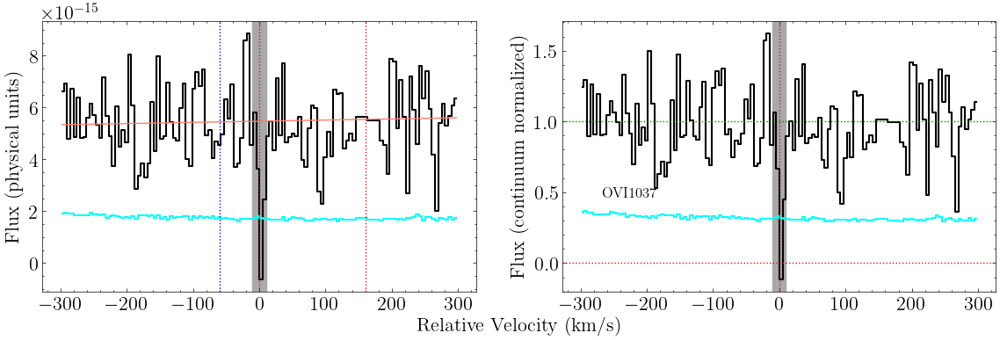

In [562]:
fig, ax = ovi_1037_stis.plot_ion_transition_spec_cont()

In [563]:
ovi_1037_stis.grab_ion_transition_lsf(lsf_fits_list)

In [564]:
ovi_1037_stis.get_upper_lim(20)

logN-1sig: 13.6
logN-2sig: 13.8
logN-3sig: 14.0


In [565]:
ovi_1037_stis.get_upper_lim_data(20, -100, -200, 0)

logN-1sig: 13.5
logN-2sig: 13.8
logN-3sig: 13.9


# NeV (re-c1, c4 - upper limit)

## NeV 568

In [566]:
nev_568_fuv = ion_transition('NeV', 568, 'Ne', z_sys, 'COS FUV')

In [567]:
nev_568_fuv.grab_ion_transition_info(delta_v=-15)

In [568]:
nev_568_fuv.grab_ion_transition_spec(spec_fits_list, masks=[[-220,-70],[270,300]])

In [569]:
nev_568_fuv.cont_norm_flux(v_abs_range=[-70,130], degree=1)

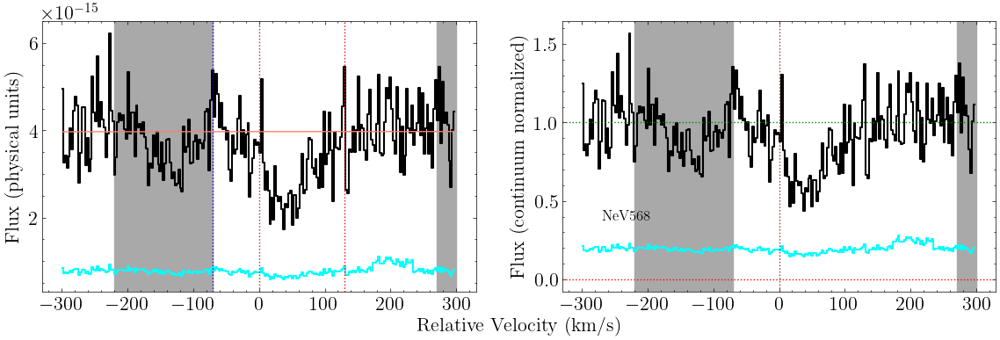

In [570]:
fig, ax = nev_568_fuv.plot_ion_transition_spec_cont()

In [571]:
nev_568_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [572]:
nev_568_fuv.get_upper_lim(20, logN_max=20)

logN-1sig: 13.3
logN-2sig: 13.5
logN-3sig: 13.7


In [573]:
ovi_1037_stis.get_upper_lim_data(20, -40, -150, 200, logN_max=120)

logN-1sig: 13.6
logN-2sig: 13.8
logN-3sig: 14.0


# MgII

## MgII 2796

In [574]:
mgii_2796_hires = ion_transition('MgII', 2796, 'Mg', z_sys, 'HIRES')

In [575]:
mgii_2796_hires.grab_ion_transition_info()

In [576]:
mgii_2796_hires.grab_ion_transition_spec(spec_fits_list)

In [577]:
mgii_2796_hires.cont_norm_flux(v_abs_range=[-100,100], degree=1)

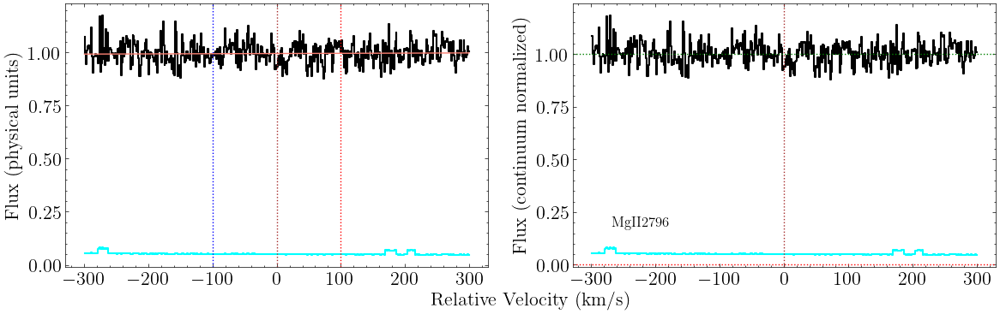

In [578]:
fig, ax = mgii_2796_hires.plot_ion_transition_spec_cont()

In [579]:
mgii_2796_hires.grab_ion_transition_lsf(lsf_fits_list)

In [580]:
mgii_2796_hires.get_upper_lim(10)

logN-1sig: 10.9
logN-2sig: 11.1
logN-3sig: 11.3


In [581]:
mgii_2796_hires.get_upper_lim_data(10, 150, 100, 200)

logN-1sig: 11.0
logN-2sig: 11.2
logN-3sig: 11.3


# MgX

## MgX 609

In [582]:
mgx_609_fuv = ion_transition('MgX', 609, 'Mg', z_sys, 'COS FUV')

In [583]:
mgx_609_fuv.grab_ion_transition_info()

In [584]:
mgx_609_fuv.grab_ion_transition_spec(spec_fits_list, masks=[[-300,-170]])

In [585]:
mgx_609_fuv.cont_norm_flux(v_abs_range=[-100,100], degree=1)

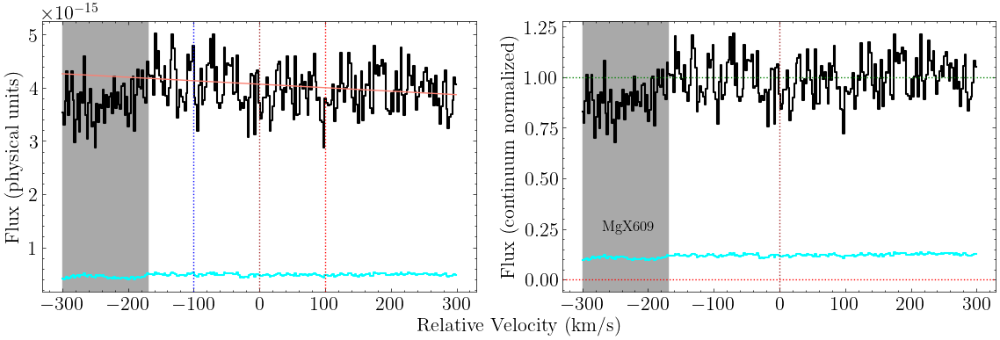

In [586]:
fig, ax = mgx_609_fuv.plot_ion_transition_spec_cont()

In [587]:
mgx_609_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [588]:
mgx_609_fuv.get_upper_lim(20)

logN-1sig: 13.2
logN-2sig: 13.4
logN-3sig: 13.6


In [589]:
mgx_609_fuv.get_upper_lim_data(20, 150, 100, 200)

logN-1sig: 13.2
logN-2sig: 13.4
logN-3sig: 13.6


## MgX 624

In [590]:
mgx_609_fuv = ion_transition('MgX', 624, 'Mg', z_sys, 'COS FUV')

In [591]:
mgx_609_fuv.grab_ion_transition_info()

In [592]:
mgx_609_fuv.grab_ion_transition_spec(spec_fits_list)

In [593]:
mgx_609_fuv.cont_norm_flux(v_abs_range=[-100,100], degree=1)

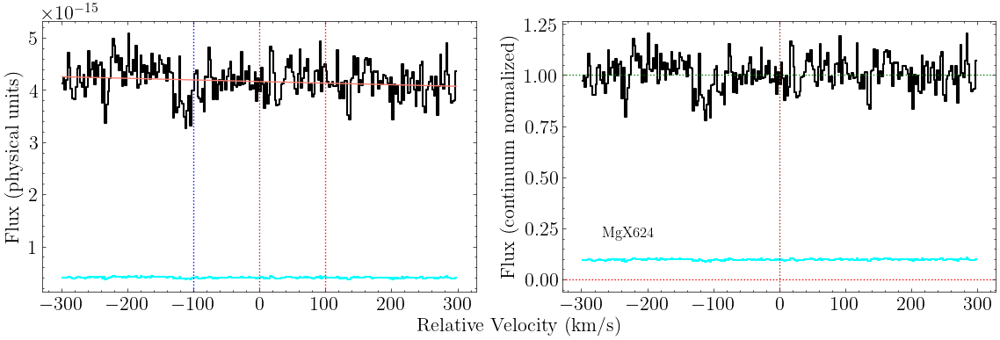

In [594]:
fig, ax = mgx_609_fuv.plot_ion_transition_spec_cont()

In [595]:
mgx_609_fuv.grab_ion_transition_lsf(lsf_fits_list)

In [596]:
mgx_609_fuv.get_upper_lim(20)

logN-1sig: 13.4
logN-2sig: 13.6
logN-3sig: 13.8


# AlII

## AlII 1670 (HIRES)

In [597]:
alii_1670_hires = ion_transition('AlII', 1670, 'Al', z_sys, 'HIRES')

In [598]:
alii_1670_hires.grab_ion_transition_info()

In [599]:
alii_1670_hires.grab_ion_transition_spec(spec_fits_list)

In [600]:
alii_1670_hires.cont_norm_flux(v_abs_range=[-100,100], degree=1)

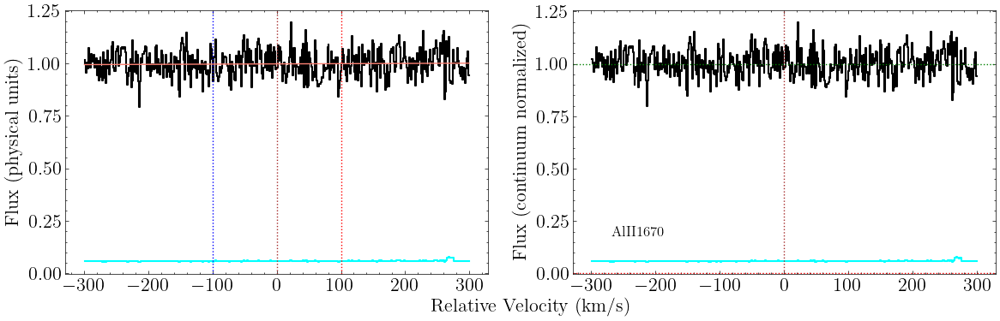

In [601]:
fig, ax = alii_1670_hires.plot_ion_transition_spec_cont()

In [602]:
alii_1670_hires.grab_ion_transition_lsf(lsf_fits_list)

In [603]:
alii_1670_hires.get_upper_lim(10)

logN-1sig: 10.8
logN-2sig: 11.0
logN-3sig: 11.1


In [604]:
alii_1670_hires.get_upper_lim_data(10, 0, -100, 100)

logN-1sig: 10.6
logN-2sig: 10.8
logN-3sig: 11.0


# AlIII

## AlIII 1862 (HIRES)

In [605]:
aliii_1862_hires = ion_transition('AlIII', 1862, 'Al', z_sys, 'HIRES')

In [606]:
aliii_1862_hires.grab_ion_transition_info()

In [607]:
aliii_1862_hires.grab_ion_transition_spec(spec_fits_list)

In [608]:
aliii_1862_hires.cont_norm_flux(v_abs_range=[-100,100], degree=1)

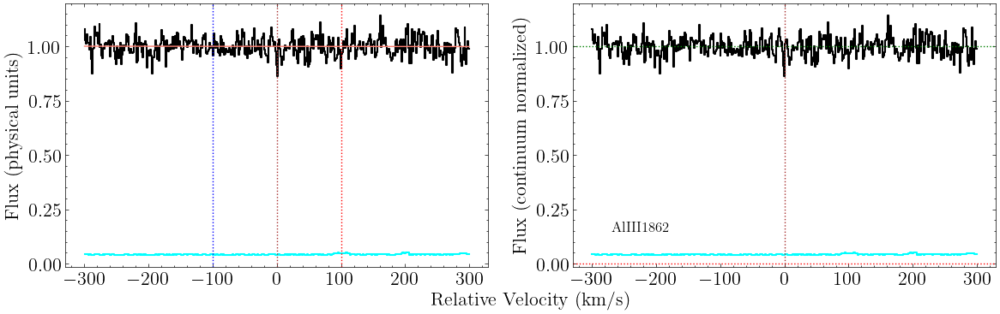

In [609]:
fig, ax = aliii_1862_hires.plot_ion_transition_spec_cont()

In [610]:
aliii_1862_hires.grab_ion_transition_lsf(lsf_fits_list)

In [611]:
aliii_1862_hires.get_upper_lim(10)

logN-1sig: 11.4
logN-2sig: 11.6
logN-3sig: 11.7


In [612]:
aliii_1862_hires.get_upper_lim_data(10, 150, 100, 200)

logN-1sig: 11.2
logN-2sig: 11.4
logN-3sig: 11.6


## AlIII 1854 (HIRES)

In [613]:
aliii_1854_hires = ion_transition('AlIII', 1854, 'Al', z_sys, 'HIRES')

In [614]:
aliii_1854_hires.grab_ion_transition_info()

In [615]:
aliii_1854_hires.grab_ion_transition_spec(spec_fits_list)

In [616]:
aliii_1854_hires.cont_norm_flux(v_abs_range=[-100,100], degree=1)

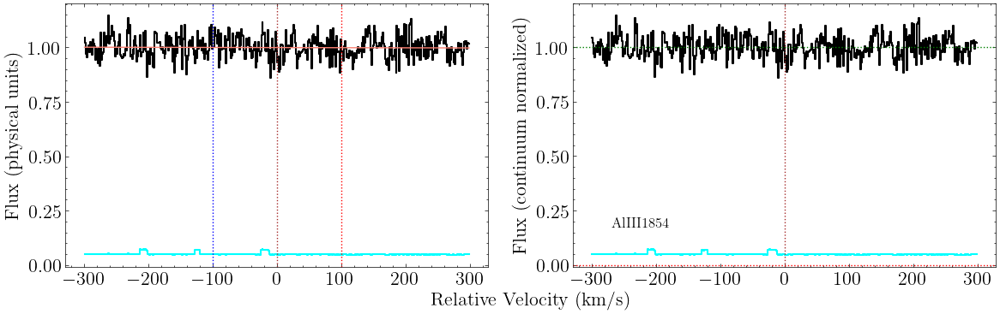

In [617]:
fig, ax = aliii_1854_hires.plot_ion_transition_spec_cont()

In [618]:
aliii_1854_hires.grab_ion_transition_lsf(lsf_fits_list)

In [619]:
aliii_1854_hires.get_upper_lim(10)

logN-1sig: 11.1
logN-2sig: 11.3
logN-3sig: 11.5


In [620]:
aliii_1854_hires.get_upper_lim_data(10, -100, -150, -50)

logN-1sig: 10.9
logN-2sig: 11.1
logN-3sig: 11.3


# SiII

## SiII 1260

In [621]:
siii_1260_stis = ion_transition('SiII', 1260, 'Si', z_sys, 'STIS')

In [622]:
siii_1260_stis.grab_ion_transition_info()

In [623]:
siii_1260_stis.grab_ion_transition_spec(spec_fits_list)

In [624]:
siii_1260_stis.cont_norm_flux(v_abs_range=[-100,160], degree=1)

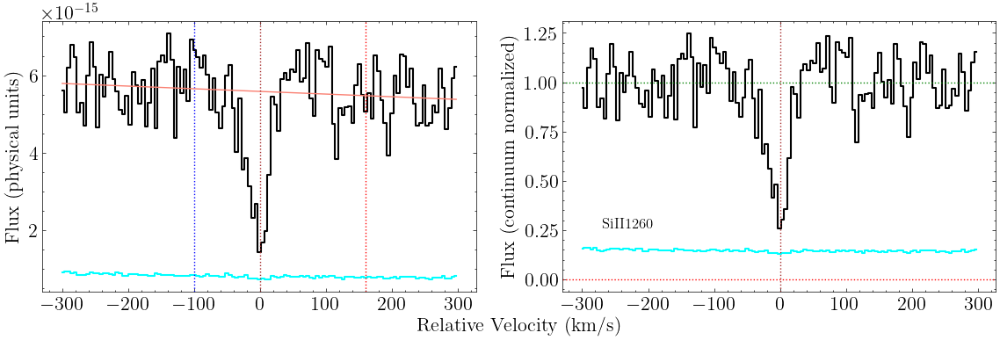

In [625]:
fig, ax = siii_1260_stis.plot_ion_transition_spec_cont()

In [626]:
siii_1260_stis.grab_ion_transition_lsf(lsf_fits_list)

In [627]:
siii_1260_stis.init_ion_transition(init_values = [[13.1, 10, 0]], 
                             lsf_convolve = True)

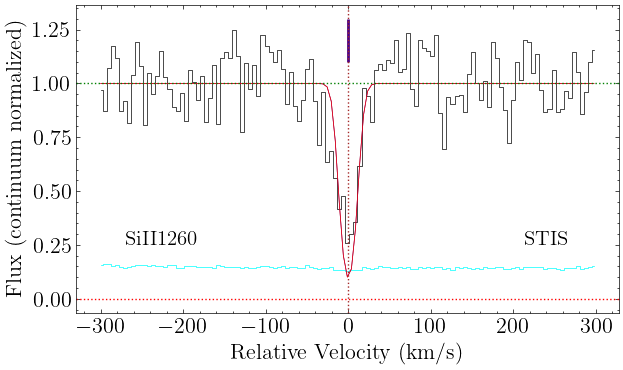

In [628]:
fig, ax = siii_1260_stis.plot_ion_transition_init_fit(legend=False)

In [629]:
siii_1260_stis.fit_ion_transition()

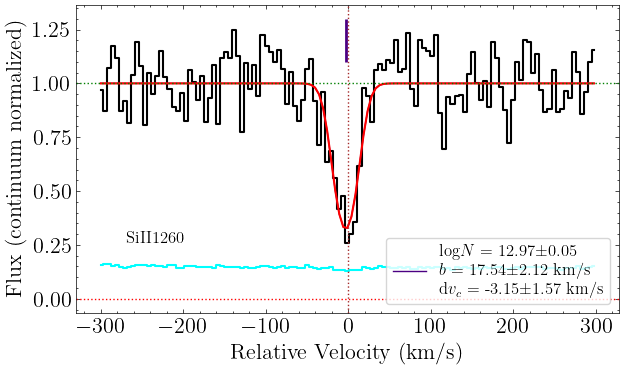

In [630]:
fig, ax = siii_1260_stis.plot_ion_transition_best_fit()

In [631]:
siii_1260_stis.get_upper_lim(10)

logN-1sig: 11.7
logN-2sig: 12.0
logN-3sig: 12.1


In [632]:
siii_1260_stis.get_upper_lim_data(10, 0)

logN-1sig: 13.1
logN-2sig: 13.2
logN-3sig: 13.3


## SiII 1193

In [633]:
siii_1193_stis = ion_transition('SiII', 1193, 'Si', z_sys, 'STIS')

In [634]:
siii_1193_stis.grab_ion_transition_info()

In [635]:
siii_1193_stis.grab_ion_transition_spec(spec_fits_list)

In [636]:
siii_1193_stis.cont_norm_flux(v_abs_range=[-100,100], degree=1)

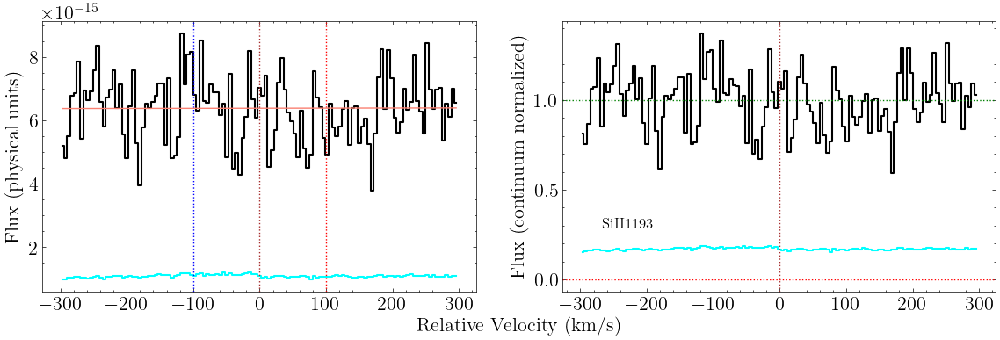

In [637]:
fig, ax = siii_1193_stis.plot_ion_transition_spec_cont()

In [638]:
siii_1193_stis.grab_ion_transition_lsf(lsf_fits_list)

In [639]:
siii_1193_stis.init_ion_transition(init_values = [[12.97, 17.5, -3.1]], 
                             lsf_convolve = True)

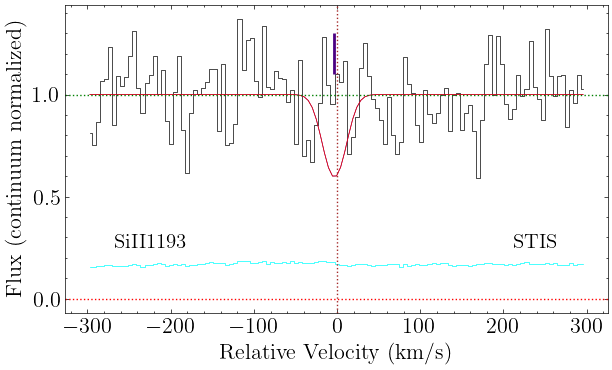

In [640]:
fig, ax = siii_1193_stis.plot_ion_transition_init_fit(legend=False)

In [641]:
siii_1193_stis.get_upper_lim(10)

logN-1sig: 12.2
logN-2sig: 12.4
logN-3sig: 12.6


## SiII 1190

In [642]:
siii_1190_stis = ion_transition('SiII', 1190, 'Si', z_sys, 'STIS')

In [643]:
siii_1190_stis.grab_ion_transition_info()

In [644]:
siii_1190_stis.grab_ion_transition_spec(spec_fits_list)

In [645]:
siii_1190_stis.cont_norm_flux(v_abs_range=[-100,100], degree=1)

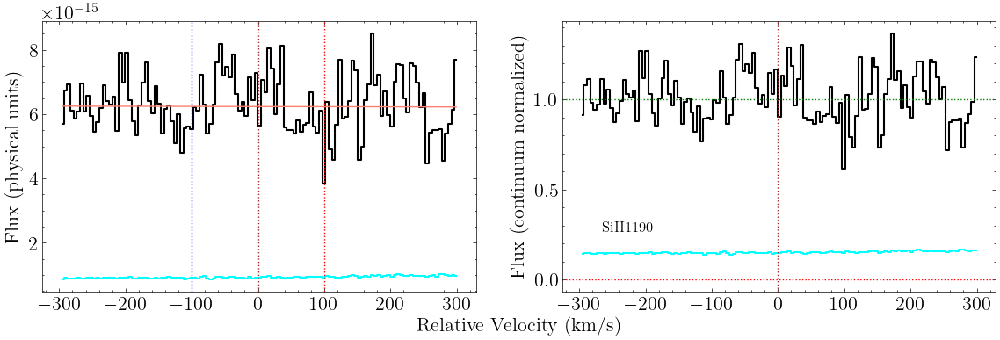

In [646]:
fig, ax = siii_1190_stis.plot_ion_transition_spec_cont()

In [647]:
siii_1190_stis.grab_ion_transition_lsf(lsf_fits_list)

In [648]:
siii_1190_stis.init_ion_transition(init_values = [[12.97, 17.5, -3.1]], 
                             lsf_convolve = True)

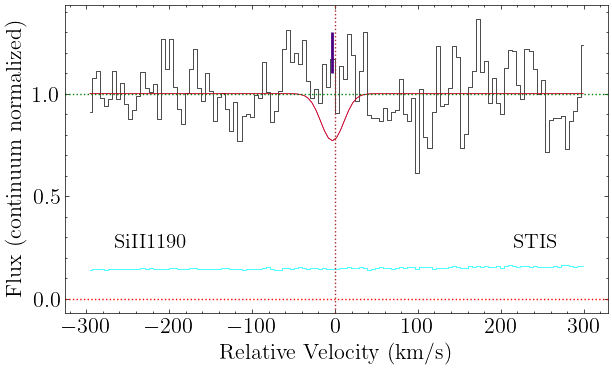

In [649]:
fig, ax = siii_1190_stis.plot_ion_transition_init_fit(legend=False)

In [650]:
siii_1190_stis.get_upper_lim(10)

logN-1sig: 12.4
logN-2sig: 12.6
logN-3sig: 12.8


# SIV

## SIV 1062 (STIS)

In [651]:
siv_1062_stis = ion_transition('SIV', 1062, 'S', z_sys, 'STIS')

In [652]:
siv_1062_stis.grab_ion_transition_info()

In [653]:
siv_1062_stis.grab_ion_transition_spec(spec_fits_list)

In [654]:
siv_1062_stis.cont_norm_flux(v_abs_range=[-100,170], degree=1)

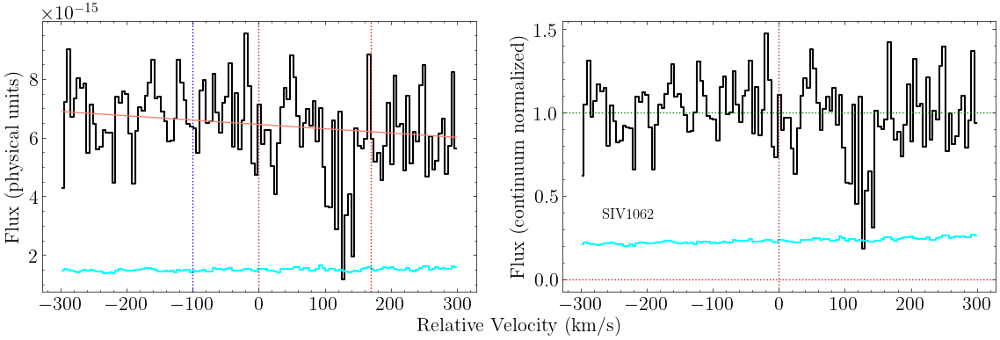

In [655]:
fig, ax = siv_1062_stis.plot_ion_transition_spec_cont()

In [656]:
siv_1062_stis.grab_ion_transition_lsf(lsf_fits_list)

In [657]:
siv_1062_stis.init_ion_transition(init_values = [[13.97, 6, -3.1]], 
                             lsf_convolve = True)

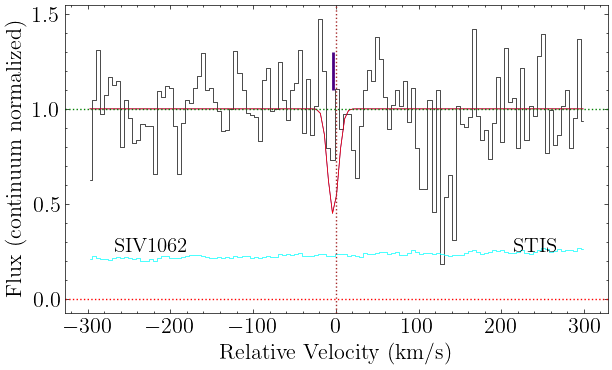

In [658]:
fig, ax = siv_1062_stis.plot_ion_transition_init_fit(legend=False)

In [659]:
siv_1062_stis.get_upper_lim(10)

logN-1sig: 13.5
logN-2sig: 13.7
logN-3sig: 13.9


In [660]:
siv_1062_stis.get_upper_lim_data(10, 130, 40, 200, logN_max=20)

logN-1sig: 14.3
logN-2sig: 14.4
logN-3sig: 14.6


# SVI

## SVI 933 (NUV)

In [661]:
svi_933_nuv = ion_transition('SVI', 933, 'S', z_sys, 'COS NUV')

In [662]:
svi_933_nuv.grab_ion_transition_info()

In [663]:
svi_933_nuv.grab_ion_transition_spec(spec_fits_list)

In [664]:
svi_933_nuv.cont_norm_flux(v_abs_range=[-100,170], degree=1)

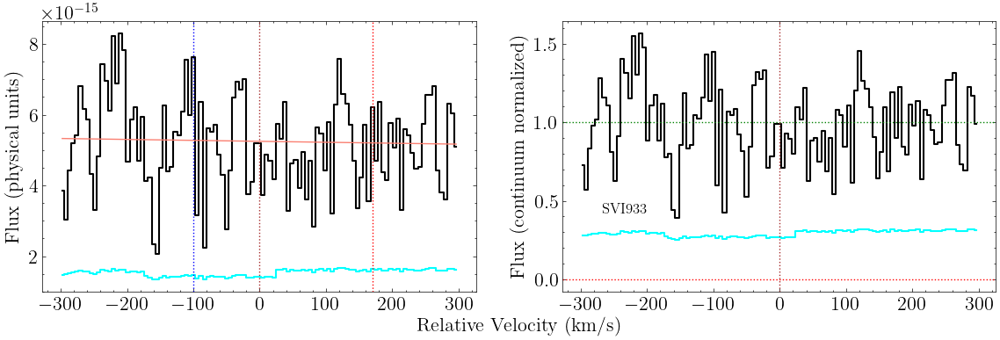

In [665]:
fig, ax = svi_933_nuv.plot_ion_transition_spec_cont()

In [666]:
svi_933_nuv.grab_ion_transition_lsf(lsf_fits_list)

In [667]:
svi_933_nuv.get_upper_lim(20)

logN-1sig: 12.9
logN-2sig: 13.1
logN-3sig: 13.3


In [668]:
svi_933_nuv.get_upper_lim_data(20, 150, 100, 200)

logN-1sig: 13.1
logN-2sig: 13.3
logN-3sig: 13.5


## SVI 944 (NUV)

In [669]:
svi_944_nuv = ion_transition('SVI', 944, 'S', z_sys, 'COS NUV')

In [670]:
svi_944_nuv.grab_ion_transition_info()

In [671]:
svi_944_nuv.grab_ion_transition_spec(spec_fits_list)

In [672]:
svi_944_nuv.cont_norm_flux(v_abs_range=[-100,170], degree=1)

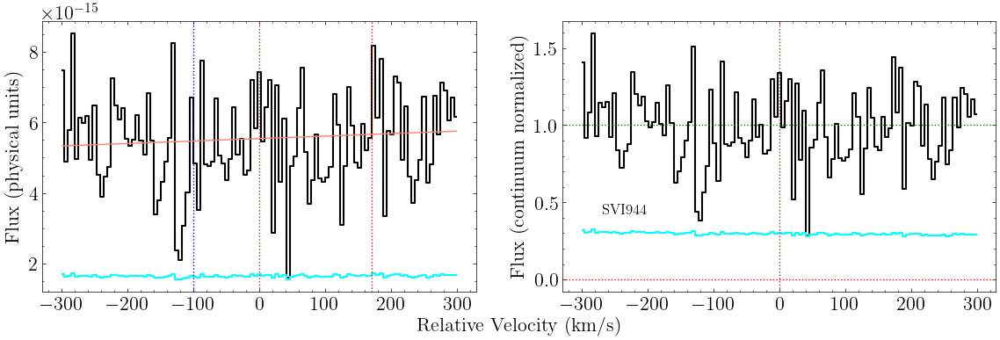

In [673]:
fig, ax = svi_944_nuv.plot_ion_transition_spec_cont()

In [674]:
svi_944_nuv.grab_ion_transition_lsf(lsf_fits_list)

In [675]:
svi_944_nuv.get_upper_lim(20)

logN-1sig: 13.3
logN-2sig: 13.5
logN-3sig: 13.7


# FeII

## FeII 2600 (HIRES)

In [676]:
feii_2600_hires = ion_transition('FeII', 2600, 'Fe', z_sys, 'HIRES')

In [677]:
feii_2600_hires.grab_ion_transition_info()

In [678]:
feii_2600_hires.grab_ion_transition_spec(spec_fits_list)

In [679]:
feii_2600_hires.cont_norm_flux(v_abs_range=[-100,100], degree=1)

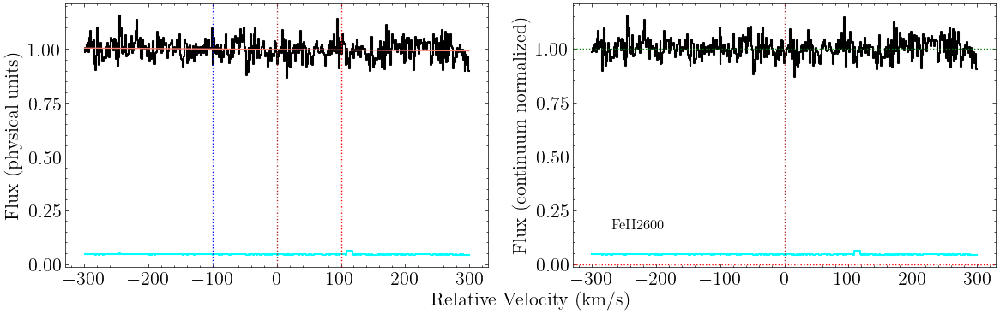

In [680]:
fig, ax = feii_2600_hires.plot_ion_transition_spec_cont()

In [681]:
feii_2600_hires.grab_ion_transition_lsf(lsf_fits_list)

In [682]:
feii_2600_hires.get_upper_lim(10)

logN-1sig: 11.3
logN-2sig: 11.5
logN-3sig: 11.7


## FeII 2382 (HIRES)

In [683]:
feii_2382_hires = ion_transition('FeII', 2382, 'Fe', z_sys, 'HIRES')

In [684]:
feii_2382_hires.grab_ion_transition_info()

In [685]:
feii_2382_hires.grab_ion_transition_spec(spec_fits_list)

In [686]:
feii_2382_hires.cont_norm_flux(v_abs_range=[-100,100], degree=1)

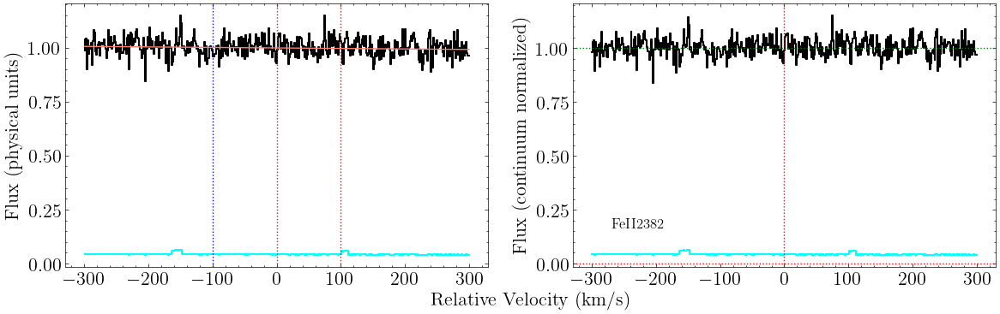

In [687]:
fig, ax = feii_2382_hires.plot_ion_transition_spec_cont()

In [688]:
feii_2382_hires.grab_ion_transition_lsf(lsf_fits_list)

In [689]:
feii_2382_hires.get_upper_lim(10)

logN-1sig: 11.2
logN-2sig: 11.4
logN-3sig: 11.6


## FeII 2344 (HIRES)

In [690]:
feii_2344_hires = ion_transition('FeII', 2344, 'Fe', z_sys, 'HIRES')

In [691]:
feii_2344_hires.grab_ion_transition_info()

In [692]:
feii_2344_hires.grab_ion_transition_spec(spec_fits_list)

In [693]:
feii_2344_hires.cont_norm_flux(v_abs_range=[-100,100], degree=1)

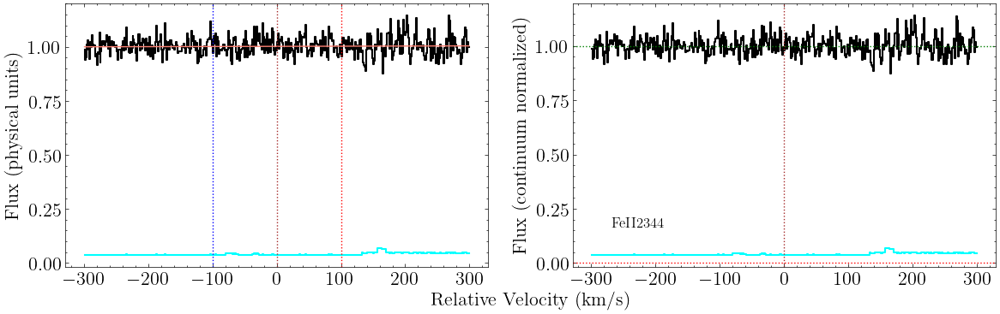

In [694]:
fig, ax = feii_2344_hires.plot_ion_transition_spec_cont()

In [695]:
feii_2344_hires.grab_ion_transition_lsf(lsf_fits_list)

In [696]:
feii_2344_hires.get_upper_lim(10)

logN-1sig: 11.6
logN-2sig: 11.8
logN-3sig: 12.0


# Paper plot

In [ ]:
ovi_1031_stis.n_components

In [ ]:
fig, axes = plt.subplots(3, 5, figsize=(5*2.8, 3*1.5), sharex=True, sharey=True)

hi_1215_stis.plot_ion_transition_init_fit(fig, axes[0,0], legend=False, label_axes=False)
hi_1025_nuv.plot_ion_transition_init_fit(fig, axes[1,0], legend=False, label_axes=False)
hi_972_nuv.plot_ion_transition_init_fit(fig, axes[2,0], legend=False, label_axes=False)

hei_584_fuv.plot_ion_transition_init_fit(fig, axes[0,1], legend=False, label_axes=False)
ciii_977_nuv.plot_ion_transition_init_fit(fig, axes[1,1], legend=False, label_axes=False)
civ_1548_hires.plot_ion_transition_init_fit(fig, axes[2,1], legend=False, label_axes=False)

civ_1550_hires.plot_ion_transition_init_fit(fig, axes[0,2], legend=False, label_axes=False)
niv_765_fuv.plot_ion_transition_init_fit(fig, axes[1,2], legend=False, label_axes=False)
oiii_702_fuv.plot_ion_transition_init_fit(fig, axes[2,2], legend=False, label_axes=False)

oiii_832_fuv.plot_ion_transition_init_fit(fig, axes[0,3], legend=False, label_axes=False)
oiv_608_fuv.plot_ion_transition_init_fit(fig, axes[1,3], legend=False, label_axes=False)
oiv_787_fuv.plot_ion_transition_init_fit(fig, axes[2,3], legend=False, label_axes=False)

ov_629_fuv.plot_ion_transition_init_fit(fig, axes[0,4], legend=False, label_axes=False)
ovi_1031_stis.plot_ion_transition_init_fit(fig, axes[1,4], legend=False, label_axes=False)
ovi_1037_stis.plot_ion_transition_init_fit(fig, axes[2,4], legend=False, label_axes=False)

axes[0,0].set_ylim(-0.1,1.52)
axes[0,0].set_xlim(-299.9,299.9)
axes[0,0].set_yticks([0,0.5,1])

ax_label = fig.add_subplot(111, frameon=False)
ax_label.set_xticks([])
ax_label.set_yticks([])

plt.subplots_adjust(wspace=0, hspace=0)

ax_label.set_xlabel(r'Relative velocity (km s${}^{-1}$)', labelpad=20, fontsize=18)
ax_label.set_ylabel('Flux (continuum normalized)', labelpad=30, fontsize=20)

#plt.savefig(rootdir+'Ions/z={}/z={}_vp_alt.pdf'.format(str(z_sys), str(z_sys).replace('.', '_')), dpi=300)

# HI + CIII + CIV + NIV + OIII + OIV + OV + OVI

In [ ]:
hi_ciii_civ_niv_oiii_oiv_ov_ovi = ion_suite(z_sys, 'HI+CIII+CIV+NIV+OIII+OIV+OV+OVI', 
                                             [hi, ciii, civ, niv, oiii, oiv, ov, ovi])

In [ ]:
fig, axes = hi_ciii_civ_niv_oiii_oiv_ov_ovi.plot_ion_suite(n_cols=3)

In [ ]:
hi_ciii_civ_niv_oiii_oiv_ov_ovi.init_ion_suite([
    [[14.8, 19, 0], [14.0, 10, 40], [14.3, 14, 79.5], [14.5, 21, 100.5]], # HI
    [[14.8, 19, 0], [14.0, 10, 40], [14.3, 14, 79.5], [14.5, 21, 100.5]],
    [[14.8, 19, 0], [14.0, 10, 40], [14.3, 14, 79.5], [14.5, 21, 100.5]],
    [[13.9, 6.7, 0], [13.3, 6.3, 40], [14.0, 10, 79.5], [13.2, 8.3, 100.5]], # CIII
    [[13.64, 6.7, 0], [13.37, 6.3, 40], [13.45, 10, 79.5], [13.53, 8.3, 100.5]], # CIV
    [[13.64, 6.7, 0], [13.37, 6.3, 40], [13.45, 10, 79.5], [13.53, 8.3, 100.5]], 
    [[13.0, 6.7, 0], [13.0, 6.3, 40], [13.0, 10, 79.5], [13.0, 8.3, 100.5]], # NIV
    [[14.34, 6.7, 0], [13.9, 6.3, 40], [13.57, 10, 79.5], [13.6, 8.3, 100.5]], # OIII
    [[14.34, 6.7, 0], [13.9, 6.3, 40], [13.57, 10, 79.5], [13.6, 8.3, 100.5]], 
    [[14.47, 6.7, 0], [14.22, 6.3, 40], [14.31, 10, 79.5], [13.9, 8.3, 100.5]], # OIV
    [[14.47, 6.7, 0], [14.22, 6.3, 40], [14.31, 10, 79.5], [13.9, 8.3, 100.5]], 
    [[14.00, 23, 0], [13.6, 6.3, 40], [14.37, 26, 79.5], [13.61, 8.3, 100.5]], # OV
    [[13.8, 23, 0],[14.0, 26, 79.5]], # OVI
    [[13.8, 23, 0],[14.0, 26, 79.5]],
 ])

In [ ]:
fig, axes = hi_ciii_civ_niv_oiii_oiv_ov_ovi.plot_ion_suite_init_fit(n_cols=3, legend=False)

In [ ]:
hi_ciii_civ_niv_oiii_oiv_ov_ovi.fit_ion_suite(tie_params_list = [
    
    ['it1c1_logN', 'it2c1_logN'], # Tie HI logN, c1
    ['it1c1_logN', 'it3c1_logN'],

    ['it1c2_logN', 'it2c2_logN'], # Tie HI logN, c2
    ['it1c2_logN', 'it3c2_logN'],

    ['it1c3_logN', 'it2c3_logN'], # Tie HI logN, c3
    ['it1c3_logN', 'it3c3_logN'],

    ['it1c4_logN', 'it2c4_logN'], # Tie HI logN, c4
    ['it1c4_logN', 'it3c4_logN'],

    ['it1c1_b', 'it2c1_b'], # Tie HI b, c1
    ['it1c1_b', 'it3c1_b'], 

    ['it1c2_b', 'it2c2_b'], # Tie HI b, c2
    ['it1c2_b', 'it3c2_b'], 

    ['it1c3_b', 'it2c3_b'], # Tie HI b, c3
    ['it1c3_b', 'it3c3_b'],

    ['it1c4_b', 'it2c4_b'], # Tie HI b, c4    
    ['it1c4_b', 'it3c4_b'], 

    ['it5c1_logN', 'it6c1_logN'], # Tie CIV logN, c1
    ['it5c2_logN', 'it6c2_logN'], # Tie CIV logN, c2
    ['it5c3_logN', 'it6c3_logN'], # Tie CIV logN, c3
    ['it5c4_logN', 'it6c4_logN'], # Tie CIV logN, c4
    
    ['it8c1_logN', 'it9c1_logN'], # Tie OIII logN, c1
    ['it8c2_logN', 'it9c2_logN'], # Tie OIII logN, c2
    ['it8c3_logN', 'it9c3_logN'], # Tie OIII logN, c3
    ['it8c4_logN', 'it9c4_logN'], # Tie OIII logN, c4
    
    ['it10c1_logN', 'it11c1_logN'], # Tie OIV logN, c1
    ['it10c2_logN', 'it11c2_logN'], # Tie OIV logN, c2
    ['it10c3_logN', 'it11c3_logN'], # Tie OIV logN, c3
    ['it10c4_logN', 'it11c4_logN'], # Tie OIV logN, c4    
    
    ['it13c1_logN', 'it14c1_logN'], # Tie OVI logN, c1  
    ['it13c2_logN', 'it14c2_logN'], # Tie OVI logN, c2      
    
    ['it4c1_b', 'it5c1_b'], # Tie CIII b, c1
    ['it4c1_b', 'it6c1_b'], # Tie CIV b, c1
    ['it4c1_b', 'it7c1_b'], # Tie NIV b, c1
    ['it4c1_b', 'it8c1_b'], # Tie OIII b, c1
    ['it4c1_b', 'it9c1_b'],
    ['it4c1_b', 'it10c1_b'], # Tie OIV b, c1
    ['it4c1_b', 'it11c1_b'],

    ['it4c2_b', 'it5c2_b'], # Tie CIII b, c2
    ['it4c2_b', 'it6c2_b'], # Tie CIV b, c2
    ['it4c2_b', 'it7c2_b'], # Tie NIV b, c2
    ['it4c2_b', 'it8c2_b'], # Tie OIII b, c2
    ['it4c2_b', 'it9c2_b'],
    ['it4c2_b', 'it10c2_b'], # Tie OIV b, c2
    ['it4c2_b', 'it11c2_b'],
    ['it4c2_b', 'it12c2_b'], # Tie OV b, c2

    ['it4c3_b', 'it5c3_b'], # Tie CIII b, c3
    ['it4c3_b', 'it6c3_b'], # Tie CIV b, c3
    ['it4c3_b', 'it7c3_b'], # Tie NIV b, c3
    ['it4c3_b', 'it8c3_b'], # Tie OIII b, c3
    ['it4c3_b', 'it9c3_b'],
    ['it4c3_b', 'it10c3_b'], # Tie OIV b, c3
    ['it4c3_b', 'it11c3_b'],
    
    ['it4c4_b', 'it5c4_b'], # Tie CIII b, c4
    ['it4c4_b', 'it6c4_b'], # Tie CIV b, c4
    ['it4c4_b', 'it7c4_b'], # Tie NIV b, c4
    ['it4c4_b', 'it8c4_b'], # Tie OIII b, c4
    ['it4c4_b', 'it9c4_b'],
    ['it4c4_b', 'it10c4_b'], # Tie OIV b, c4
    ['it4c4_b', 'it11c4_b'],
    ['it4c4_b', 'it12c4_b'], # Tie OV b, c4

    ['it12c1_b', 'it13c1_b'], # Tie OV b, c1
    ['it12c1_b', 'it14c1_b'], # Tie OVI b, c1   
        
    ['it12c3_b', 'it13c2_b'], # Tie OV b, c3
    ['it12c3_b', 'it14c2_b'], # Tie OVI b, c2
  
    ['it1c1_dv_c', 'it2c1_dv_c'], # Tie c1, dv_c, HI
    ['it1c1_dv_c', 'it3c1_dv_c'],
    ['it1c1_dv_c', 'it4c1_dv_c'], # CIII
    ['it1c1_dv_c', 'it5c1_dv_c'], # CIV
    ['it1c1_dv_c', 'it6c1_dv_c'], 
    ['it1c1_dv_c', 'it7c1_dv_c'], # NIV
    ['it1c1_dv_c', 'it8c1_dv_c'], # OIII
    ['it1c1_dv_c', 'it9c1_dv_c'],
    ['it1c1_dv_c', 'it10c1_dv_c'], # OIV
    ['it1c1_dv_c', 'it11c1_dv_c'],
    ['it1c1_dv_c', 'it12c1_dv_c'], # OV
    ['it1c1_dv_c', 'it13c1_dv_c'], # OVI
    ['it1c1_dv_c', 'it14c1_dv_c'], 
    
    ['it1c2_dv_c', 'it2c2_dv_c'], # Tie c2, dv_c, HI
    ['it1c2_dv_c', 'it3c2_dv_c'],
    ['it1c2_dv_c', 'it4c2_dv_c'], # CIII
    ['it1c2_dv_c', 'it5c2_dv_c'], # CIV
    ['it1c2_dv_c', 'it6c2_dv_c'],
    ['it1c2_dv_c', 'it7c2_dv_c'], # NIV
    ['it1c2_dv_c', 'it8c2_dv_c'], # OIII
    ['it1c2_dv_c', 'it9c2_dv_c'],
    ['it1c2_dv_c', 'it10c2_dv_c'], # OIV
    ['it1c2_dv_c', 'it11c2_dv_c'],
    ['it1c2_dv_c', 'it12c2_dv_c'], # OV
    
    ['it1c3_dv_c', 'it2c3_dv_c'], # Tie c3, dv_c, HI
    ['it1c3_dv_c', 'it3c3_dv_c'],
    ['it1c3_dv_c', 'it4c3_dv_c'], #  CIII
    ['it1c3_dv_c', 'it5c3_dv_c'], # CIV
    ['it1c3_dv_c', 'it6c3_dv_c'],
    ['it1c3_dv_c', 'it7c3_dv_c'], # NIV
    ['it1c3_dv_c', 'it8c3_dv_c'], # OIII
    ['it1c3_dv_c', 'it9c3_dv_c'],
    ['it1c3_dv_c', 'it10c3_dv_c'], # OIV
    ['it1c3_dv_c', 'it11c3_dv_c'],  
    ['it1c3_dv_c', 'it12c3_dv_c'], # OV
    ['it1c3_dv_c', 'it13c2_dv_c'], # OVI
    ['it1c3_dv_c', 'it14c2_dv_c'],
    
    ['it1c4_dv_c', 'it2c4_dv_c'], # Tie c4, dv_c, HI
    ['it1c4_dv_c', 'it3c4_dv_c'],
    ['it1c4_dv_c', 'it4c4_dv_c'], # CIII
    ['it1c4_dv_c', 'it5c4_dv_c'], # CIV
    ['it1c4_dv_c', 'it6c4_dv_c'],
    ['it1c4_dv_c', 'it7c4_dv_c'], # NIV
    ['it1c4_dv_c', 'it8c4_dv_c'], # OIII
    ['it1c4_dv_c', 'it9c4_dv_c'],
    ['it1c4_dv_c', 'it10c4_dv_c'], # OIV
    ['it1c4_dv_c', 'it11c4_dv_c'],
    ['it1c4_dv_c', 'it12c4_dv_c'], # OV

    ],
    
    exclude_models=['it1c3_logN < it1c2_logN', # HI, don't make c3 disappear
                    'it1c4_logN < it1c3_logN', # HI, don't make c3 the strongest
                    'it1c3_b < it1c2_b', # HI, don't make c3 narrower than CIV c3
                    'it1c4_b < it1c3_b', # HI, don't make c3 too broad
                    'it4c1_logN > it1c1_logN', # CIII weaker than HI, c1
                    'it4c2_logN > it1c2_logN', # CIII weaker than HI, c2
                    'it4c3_logN > it1c3_logN', # CIII weaker than HI, c3
                    'it4c4_logN > it1c4_logN', # CIII weaker than HI, c4
                    'it4c1_logN < it4c2_logN', # CIII c1 stronger than c2
                    'it4c3_logN < it4c4_logN', # CIII c3 stronger than c4
                    'it5c3_logN > it5c4_logN', # CIV, keep c3 weaker than c4
                    'it12c2_logN > it12c4_logN', # OV, make c4 stronger
                   ],
    lower_bounds_dict = {'it1c1_b':12})

In [ ]:
fig, axes = hi_ciii_civ_niv_oiii_oiv_ov_ovi.plot_ion_suite_best_fit(n_cols=3, legend=False)

In [ ]:
#hi_ciii_civ_niv_oiii_oiv_ov_ovi.result

In [ ]:
len(hi_ciii_civ_niv_oiii_oiv_ov_ovi.result.var_names)

In [ ]:
#hi_ciii_civ_niv_oiii_oiv_ov_ovi.result.var_names

In [ ]:
#hi_ciii_civ_niv_oiii_oiv_ov_ovi.fit_ion_suite_emcee(loaddir=rootdir, n_walkers=200, n_steps=5000, scale_covar=1e-20)
hi_ciii_civ_niv_oiii_oiv_ov_ovi.fit_ion_suite_emcee(load=True, loaddir=rootdir)

In [ ]:
fig, axes = hi_ciii_civ_niv_oiii_oiv_ov_ovi.plot_samples(n_cols=3)

In [ ]:
#hi_ciii_civ_niv_oiii_oiv_ov_ovi.plot_corner()

In [ ]:
np.median(hi_ciii_civ_niv_oiii_oiv_ov_ovi.result_emcee.flatchain['it1c3_logN'])-np.percentile(hi_ciii_civ_niv_oiii_oiv_ov_ovi.result_emcee.flatchain['it1c3_logN'], 100*(1-cdf_1sig))

In [ ]:
np.median(hi_ciii_civ_niv_oiii_oiv_ov_ovi.result_emcee.flatchain['it1c4_dv_c'])

In [ ]:
np.median(hi_ciii_civ_niv_oiii_oiv_ov_ovi.result_emcee.flatchain['it7c2_logN'])

In [ ]:
np.median(hi_ciii_civ_niv_oiii_oiv_ov_ovi.result_emcee.flatchain['it10c4_logN'])-np.percentile(hi_ciii_civ_niv_oiii_oiv_ov_ovi.result_emcee.flatchain['it10c4_logN'], 100*(1-cdf_1sig))

# Presentation plot

In [ ]:
fig, ax = plt.subplots(1, figsize=(3.3,4.2))

ax.step(civ_1550_hires.v, civ_1550_hires.flux_norm, where='mid', color='blue', lw=2)
ax.step(hi_972_nuv.v, hi_972_nuv.flux_norm, where='mid', color='olivedrab', lw=2)

#ax.text(30,0.12,'CIV 1550', color='blue', horizontalalignment='right', fontsize=17)
#ax.text(30,0.02,'SiIII 1206', color='olivedrab', horizontalalignment='right', fontsize=17)

ax.axhline(1, lw=.5)

ax.axvline(0, ymin=0.80, ymax=0.85, color='darkolivegreen', lw=2)
ax.text(0.7, 0.83, '26', rotation=90, fontsize=14, color='darkolivegreen', horizontalalignment='center')
ax.set_xlim(-35,35)
ax.set_ylim(-0.2/4, 1.15)
ax.set_yticks([0.0,0.2,0.4,0.6,0.8,1.0],[0.0,0.2,0.4,0.6,0.8,1.0])

ax.set_title('PG1522+101', fontsize=17)
ax.set_xlabel(r'v [km s${}^{-1}$]')

#plt.savefig('/Users/thepoetoftwilight/Documents/CUBS/Data/PG1522+101/Figures/logT.png', dpi=300)#